# **Barren Plateaus**

Randomly initialize the parameters in random circuit structure meets a certain degree of complexity, the optimization landscape will become very flat, which makes it difficult for the optimization method based on gradient descent to find the global minimum. FThis peculiar phenomenon was first discovered by McClean et al. in 2018.

Loss function from VQE method:
$$
     L(\theta)= \left\langle 0 \middle| U^{\dagger}(\Theta) \hat{H} U(\Theta) \middle| 0 \right\rangle,
$$

The formula for the analytical gradient:
$$
\frac{\partial L}{\partial \theta_{i}} = \frac{1}{2} \left[ 
L\left(\theta_{i} + \frac{\pi}{2}\right) - 
L\left(\theta_{i} - \frac{\pi}{2}\right) 
\right]

$$

In this study, we tested 9 fastest HEA variations for ground state energy calculations with the VQE method, based on barren plateau analysis (gradient variant). Fast VQE calculation is reviewed from the barren plateau analysis of the highest gradient variant.

In [ ]:
# Import packages needed
from qiskit.circuit.library import TwoLocal
from qiskit_algorithms.utils import algorithm_globals
from qiskit.quantum_info import Statevector, Operator, SparsePauliOp
import numpy as np
import matplotlib.pyplot as plt
import time

In [ ]:
# HEA variation initiation 
def hea_custom(num_qubits, layers, gates):
    return TwoLocal(num_qubits,
    rotation_blocks=gates,
    entanglement_blocks='cx',
    entanglement='linear',
    reps=layers,
    parameter_prefix='θ',
    insert_barriers=False,
    skip_final_rotation_layer=False,
    skip_unentangled_qubits=False,
    name='HEA').decompose()
    
gates_counts = [
    ("$R_y$", ["ry"]),
    ("$R_y R_x$", ["ry", "rx"]),
    ("$R_y R_z$", ["ry", "rz"]),
    ("$H R_y$", ["h", "ry"]),
    ("$S R_y$", ["s", "ry"]),
    ("$T R_y$", ["t", "ry"]),
    ("$X R_y$", ["x", "ry"]),
    ("$Y R_y$", ["y", "ry"]),
    ("$Z R_y$", ["z", "ry"]),
]

In [ ]:
# Hamiltonian (example H2) initiation

hamiltonian_h2 = [-0.82007165+0.j,  0.17317081+0.j, -0.22156797+0.j,  0.12067268+0.j,
  0.17317081+0.j,  0.16863423+0.j, -0.22156797+0.j,  0.16605903+0.j,
  0.04538635+0.j, -0.04538635+0.j, -0.04538635+0.j,  0.04538635+0.j,
  0.16605903+0.j,  0.17476831+0.j,  0.12067268+0.j]
  
I  = np.array([[ 1, 0],
               [ 0, 1]])
X  = np.array([[ 0, 1],
               [ 1, 0]])
Y  = np.array([[ 0,-1j],
               [1j, 0]])
Z  = np.array([[ 1, 0],
               [ 0,-1]])
Za, Zb = 1, 1
bk_mapper = [
        np.kron(np.kron(I,I), np.kron(I,I)),
        np.kron(np.kron(I,I), np.kron(I,Z)),
        np.kron(np.kron(I,I), np.kron(Z,Z)),
        np.kron(np.kron(I,I), np.kron(Z,I)),
        np.kron(np.kron(I,Z), np.kron(I,I)),
        np.kron(np.kron(I,Z), np.kron(I,Z)),
        np.kron(np.kron(Z,Z), np.kron(Z,I)),
        np.kron(np.kron(Z,Z), np.kron(Z,Z)),
        np.kron(np.kron(Z,X), np.kron(I,X)),
        np.kron(np.kron(I,X), np.kron(Z,X)),
        np.kron(np.kron(Z,X), np.kron(Z,X)),
        np.kron(np.kron(I,X), np.kron(I,X)),
        np.kron(np.kron(I,Z), np.kron(Z,Z)),
        np.kron(np.kron(Z,Z), np.kron(I,Z)),
        np.kron(np.kron(Z,I), np.kron(Z,I))
    ]
pauli_terms = [
 "IIII","IIIZ","IIZZ","IIZI","IZII","IZIZ",
 "ZZZI","ZZZZ","ZXIX","IXZX","ZXZX","IXIX",
 "IZZZ","ZZIZ","ZIZI"
]

coeffs = hamiltonian_h2
hamiltonian_operator = SparsePauliOp.from_list(list(zip(pauli_terms, coeffs)))
hamiltonian_qubit = sum(hamiltonian_h2[i] * bk_mapper[i] for i in range(len(hamiltonian_h2)))
h_nuclear = (Za * Zb)/1.4
eigen = np.linalg.eigvalsh(hamiltonian_operator)
electronic_energy = eigen[0]
E_mol = electronic_energy + h_nuclear


print("Eigenvalues of the Hamiltonian:")
print(eigen)
print("Electron energy:", eigen[0],"Hartree")
print("Ground State Energy: {:+2.8f} Hartree".format(E_mol))

Eigenvalues of the Hamiltonian:
[-1.86021496e+00 -1.25707351e+00 -1.25707351e+00 -1.25424689e+00
 -1.25424689e+00 -1.25424689e+00 -1.17254735e+00 -1.17254735e+00
 -8.91156090e-01 -4.79864110e-01 -4.79864110e-01 -3.70801630e-01
 -3.70801630e-01 -2.40050096e-01 -1.00000001e-08  1.93588630e-01]
Electron energy: -1.8602149640798369 Hartree
Ground State Energy: -1.14592925 Hartree


In [5]:
print(type(hamiltonian_operator))

<class 'qiskit.quantum_info.operators.symplectic.sparse_pauli_op.SparsePauliOp'>


In [ ]:
# Hyper parameter settings
samples = 2000
lr = 0.1


=== Optimizing $R_y$ ===
Loss last: 0.00000000 | Grad θ0 last: -2.19269047e-15


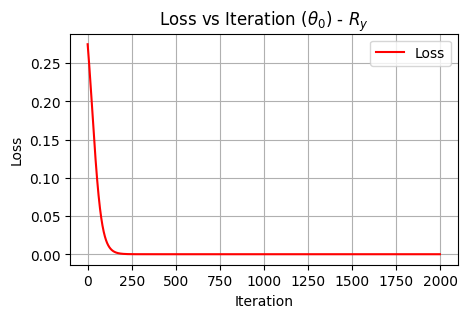

Gradient θ0 stats:
$R_y$: mean=-3.645731e-05, var=1.782688e-02


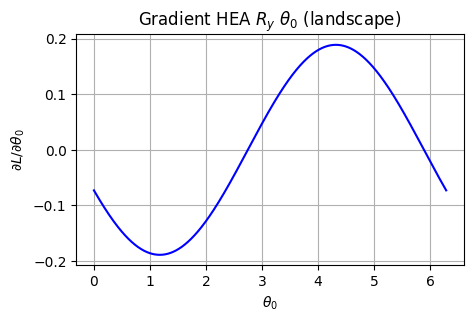


=== Optimizing $R_y R_x$ ===
Loss last: 0.00589711 | Grad θ0 last: -4.17438620e-03


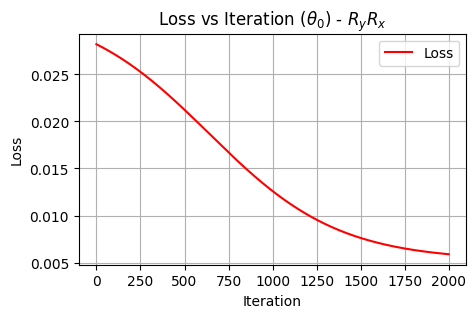

Gradient θ0 stats:
$R_y R_x$: mean=-5.422559e-06, var=9.149195e-05


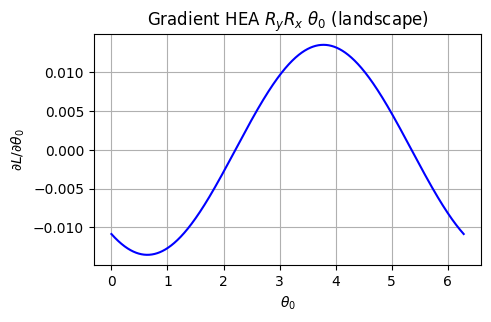


=== Optimizing $R_y R_z$ ===
Loss last: 0.00439124 | Grad θ0 last: -1.51328245e-03


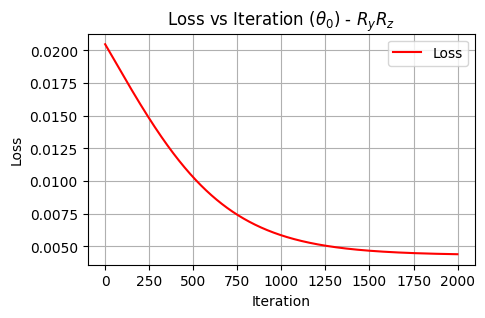

Gradient θ0 stats:
$R_y R_z$: mean=6.814883e-06, var=1.170955e-04


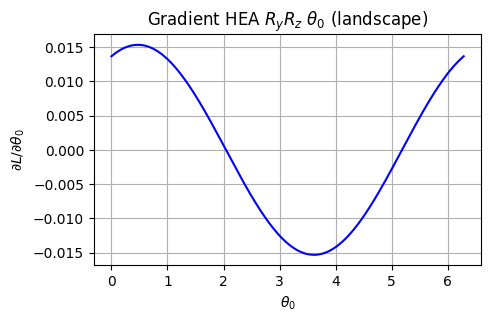


=== Optimizing $H R_y$ ===
Loss last: 0.00000000 | Grad θ0 last: -1.50235033e-11


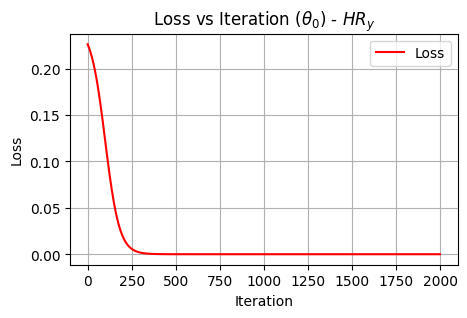

Gradient θ0 stats:
$H R_y$: mean=4.378971e-05, var=7.570473e-03


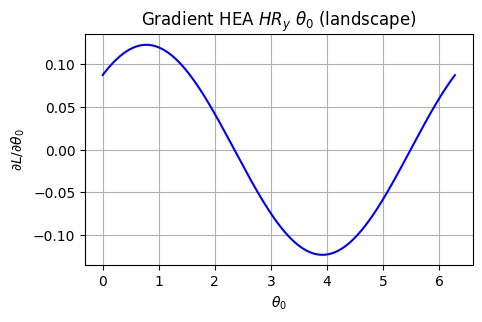


=== Optimizing $S R_y$ ===
Loss last: 0.00180430 | Grad θ0 last: 2.97512754e-03


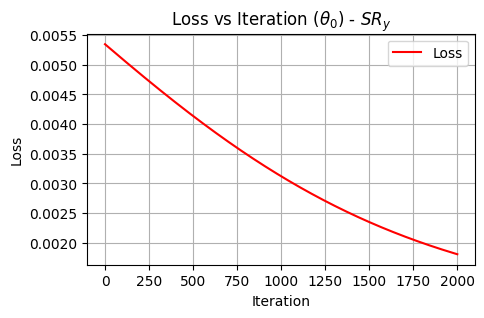

Gradient θ0 stats:
$S R_y$: mean=1.231407e-06, var=1.285984e-05


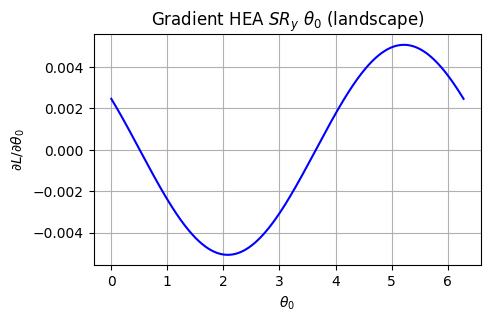


=== Optimizing $T R_y$ ===
Loss last: 0.00018503 | Grad θ0 last: -1.23082398e-04


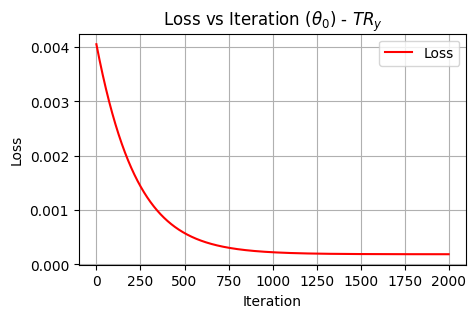

Gradient θ0 stats:
$T R_y$: mean=-2.680223e-06, var=2.806799e-04


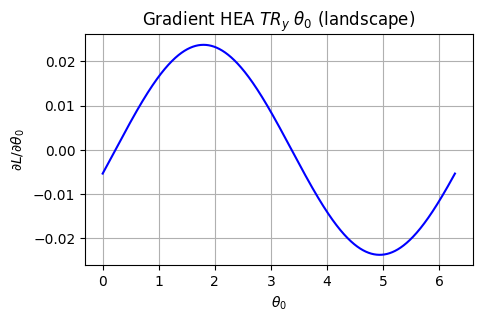


=== Optimizing $X R_y$ ===
Loss last: 0.00191605 | Grad θ0 last: -6.49107373e-03


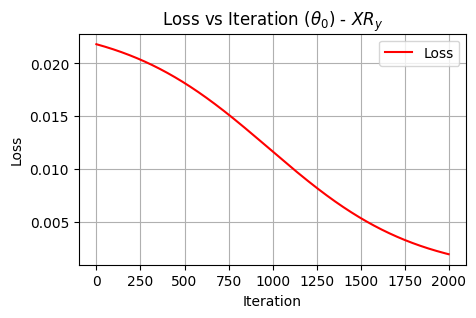

Gradient θ0 stats:
$X R_y$: mean=-5.707428e-06, var=7.146682e-05


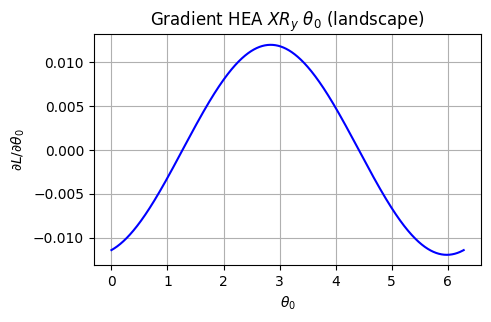


=== Optimizing $Y R_y$ ===
Loss last: 0.00000000 | Grad θ0 last: 5.12000773e-06


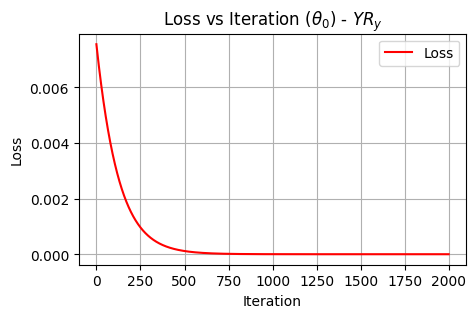

Gradient θ0 stats:
$Y R_y$: mean=4.434510e-06, var=9.115808e-04


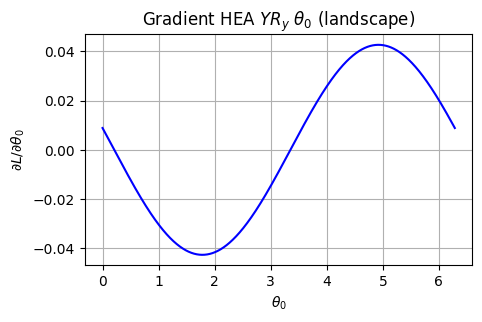


=== Optimizing $Z R_y$ ===
Loss last: 0.00000692 | Grad θ0 last: -4.90150013e-04


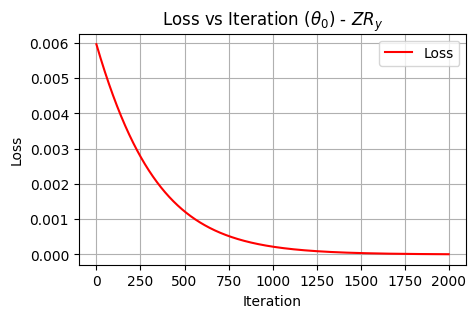

Gradient θ0 stats:
$Z R_y$: mean=5.740119e-06, var=1.506794e-04


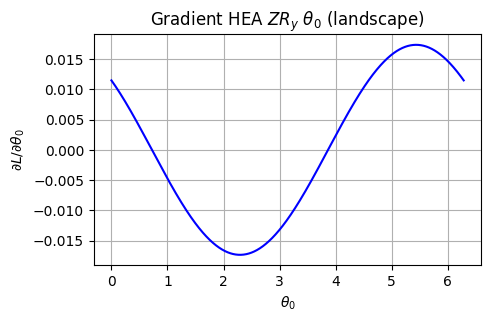

In [6]:
N_qubits = 4
layer = 2
grad_info = {label: [] for label, _ in gates_counts}
x_theta0 = np.linspace(0.0, 2*np.pi, samples)

def loss_func(num_qubits, ansatz, param_list, param_values):
    bind_dict = {p: float(val) for p, val in zip(param_list, param_values)}
    circuit = ansatz.assign_parameters(bind_dict)
    psi = Statevector.from_label('0'*num_qubits).evolve(circuit).data
    return np.real(np.conjugate(psi[0]) * psi[0])

class ManualGradient:
    def __init__(self, ansatz, param_list, num_qubits):
        self.ansatz = ansatz
        self.param_list = param_list
        self.num_qubits = num_qubits

    def forward(self, theta, param_idx=0, shift=np.pi/2.0):
        tp = np.copy(theta)
        tm = np.copy(theta)
        tp[param_idx] += shift
        tm[param_idx] -= shift
        Ep = loss_func(self.num_qubits, self.ansatz, self.param_list, tp)
        Em = loss_func(self.num_qubits, self.ansatz, self.param_list, tm)
        return 0.5 * (Ep - Em)

if __name__ == "__main__":
    for gate_label, gate in gates_counts:
        print(f"\n=== Optimizing {gate_label} ===")
        
        algorithm_globals.random_seed = 50
        ansatz = hea_custom(N_qubits, layer, gate)
        param_list = list(ansatz.parameters)
        theta = np.random.uniform(0, 2*np.pi, len(param_list)).astype(float)

        grad_calc = ManualGradient(ansatz, param_list, N_qubits)
        loss_history = []

        for it in range(samples):
            loss = loss_func(N_qubits, ansatz, param_list, theta)
            loss_history.append(loss)
            grad_val = grad_calc.forward(theta, param_idx=0)
            theta[0] -= lr * grad_val

        last_loss = loss_history[-1]
        print(f"Loss last: {last_loss:.8f} | Grad θ0 last: {grad_val:.8e}")

        # plot loss
        plt.figure(figsize=(5,3))
        plt.plot(loss_history, color="red", label="Loss")
        plt.xlabel("Iteration")
        plt.ylabel("Loss")
        plt.title(f"Loss vs Iteration ($θ_0$) - {gate_label}")
        plt.grid(True)
        plt.legend()
        plt.show()

        grads_theta0 = []
        for val in x_theta0:
            theta_fix = theta.copy()
            theta_fix[0] = val
            grad_val = grad_calc.forward(theta_fix, param_idx=0)
            grads_theta0.append(grad_val)

        grads_theta0 = np.array(grads_theta0)
        print("Gradient θ0 stats:")
        print(f"{gate_label}: mean={np.mean(grads_theta0):.6e}, var={np.var(grads_theta0):.6e}")

        plt.figure(figsize=(5, 3))
        plt.plot(x_theta0, grads_theta0, color="blue")
        plt.xlabel(r"$\theta_0$")
        plt.ylabel(r"$\partial L / \partial \theta_0$")
        plt.title(f"Gradient HEA {gate_label} $θ_0$ (landscape)")
        plt.grid(True)
        plt.show()
        print("="*50)


=== Barren Plateau Analysis for Ansatz $R_y$ ===

--- Layer 1 ---
Layer 1 | mean_grad=1.389114e-01, var_grad=3.072228e-02, error=1.137056e+00 Hartree


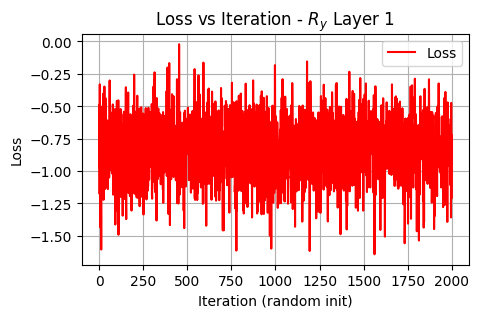

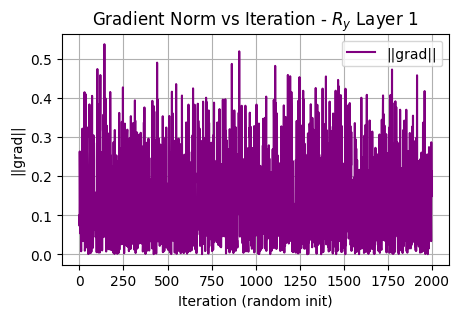

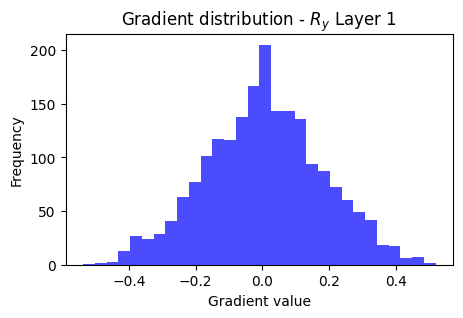


--- Layer 2 ---
Layer 2 | mean_grad=1.279083e-01, var_grad=2.613920e-02, error=8.974300e-01 Hartree


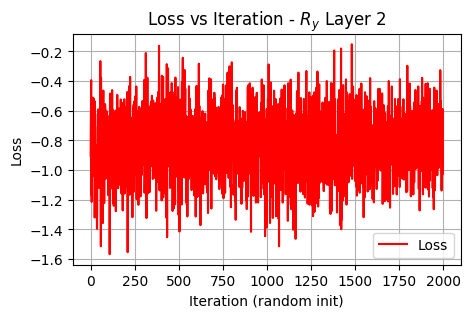

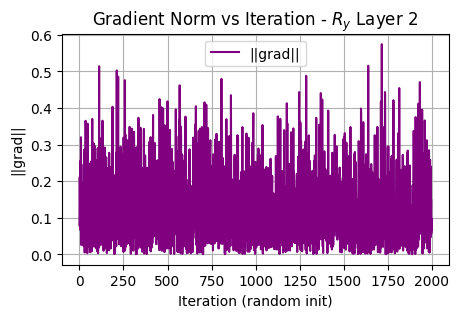

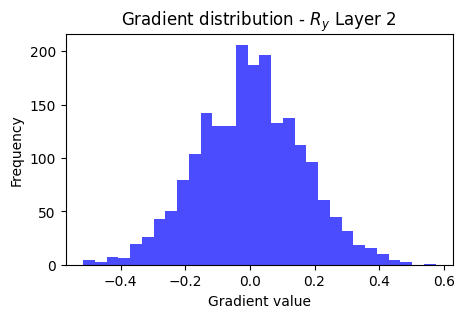


--- Layer 3 ---
Layer 3 | mean_grad=1.168019e-01, var_grad=2.187206e-02, error=1.066173e+00 Hartree


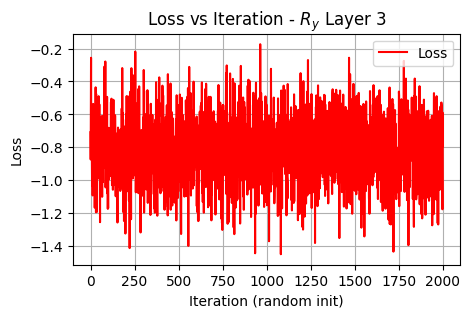

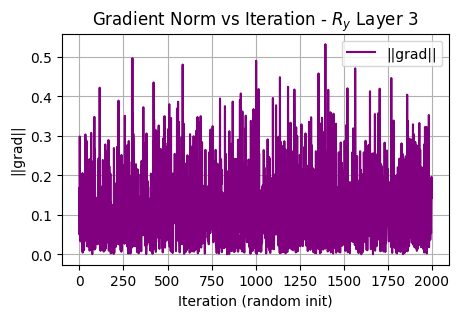

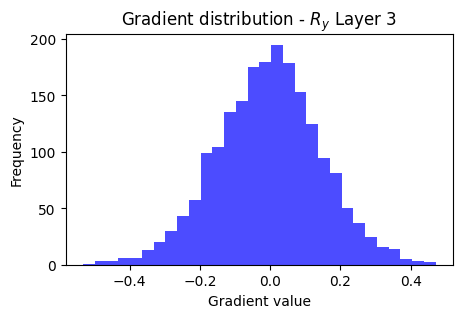


--- Layer 4 ---
Layer 4 | mean_grad=1.169217e-01, var_grad=2.136538e-02, error=1.315133e+00 Hartree


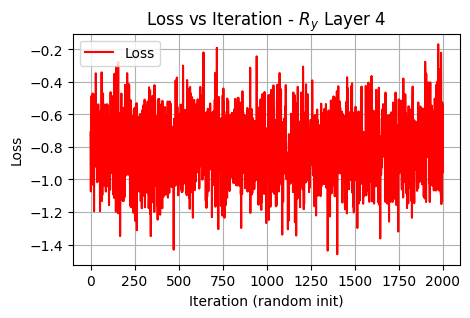

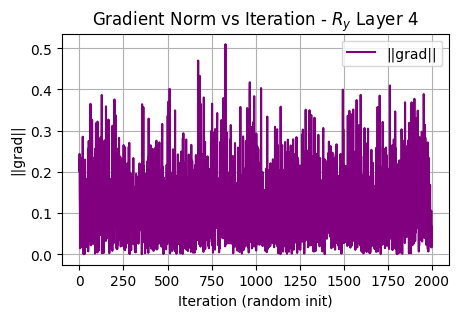

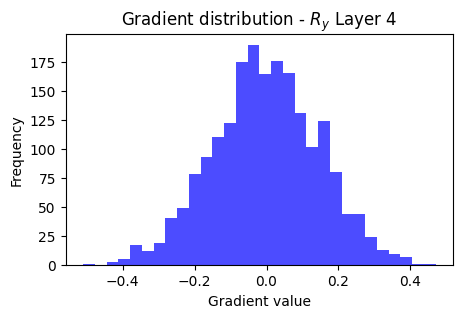


--- Layer 5 ---
Layer 5 | mean_grad=1.105938e-01, var_grad=1.908429e-02, error=1.061201e+00 Hartree


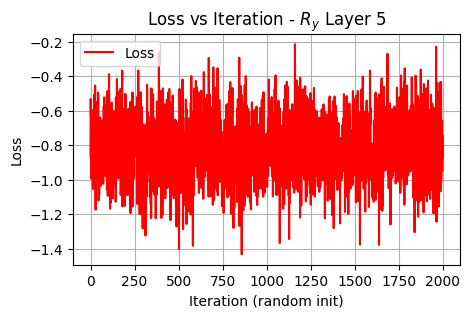

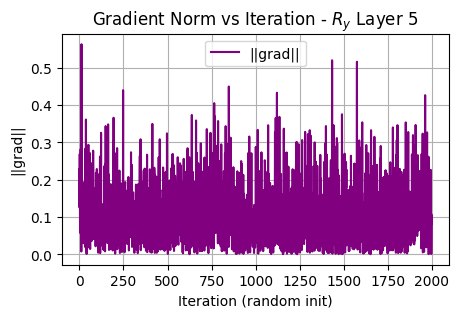

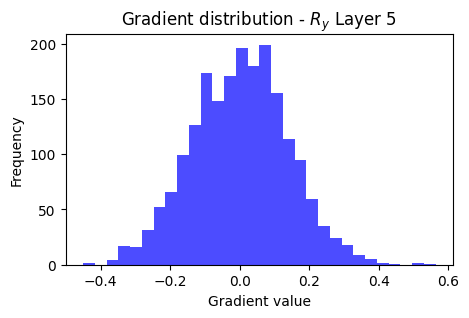


 Mean Gradient vs. Layers

[0.13891143949486862, 0.127908347100568, 0.11680190389003597, 0.1169217160905261, 0.11059381347980861]

Variance Gradient vs. Layers

[0.030722279596717774, 0.026139201592181697, 0.02187205835051266, 0.021365377721750504, 0.01908429439231094]


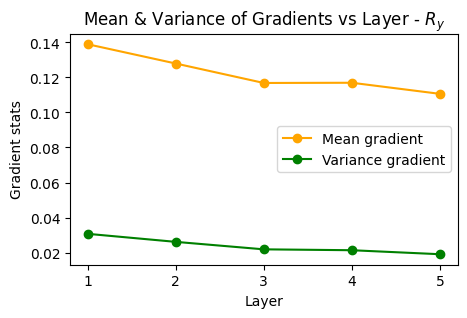


=== Barren Plateau Analysis for Ansatz $R_y R_x$ ===

--- Layer 1 ---
Layer 1 | mean_grad=9.496128e-02, var_grad=1.441439e-02, error=1.314390e+00 Hartree


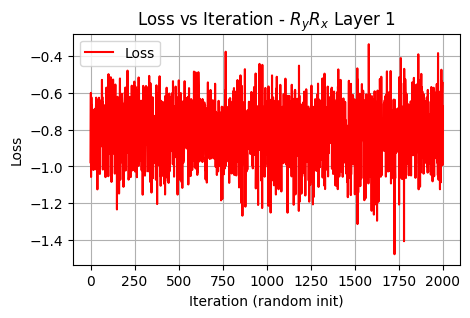

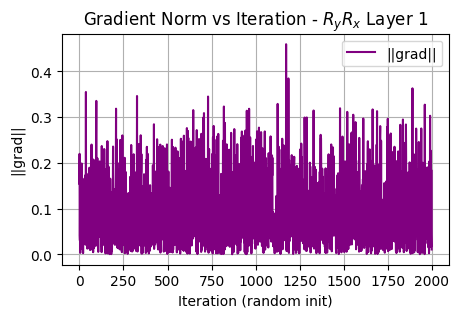

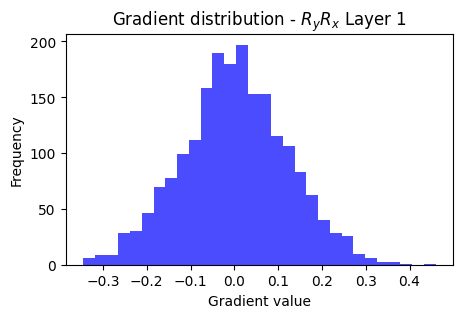


--- Layer 2 ---
Layer 2 | mean_grad=9.017474e-02, var_grad=1.279772e-02, error=1.003695e+00 Hartree


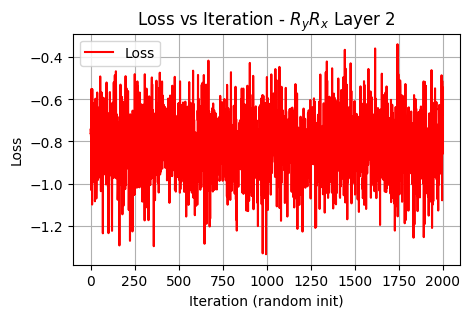

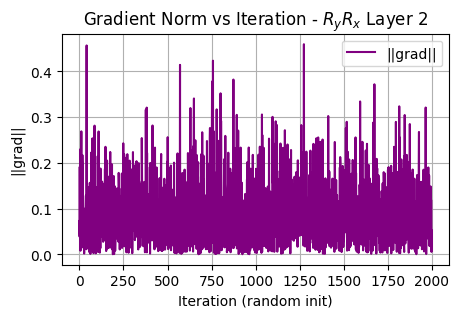

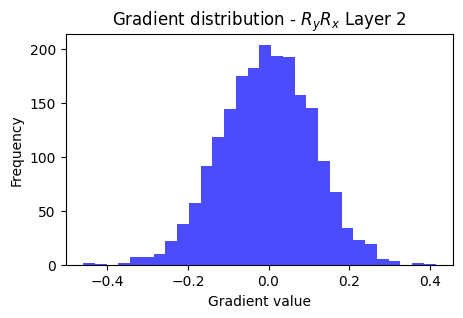


--- Layer 3 ---
Layer 3 | mean_grad=8.349577e-02, var_grad=1.101425e-02, error=1.242073e+00 Hartree


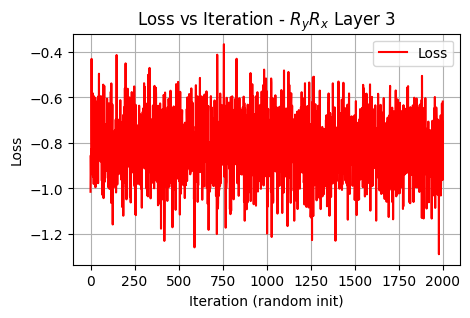

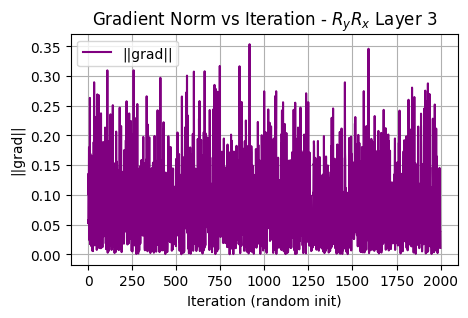

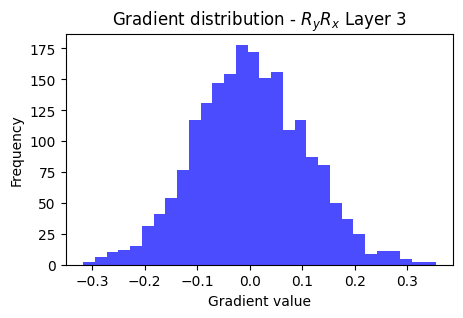


--- Layer 4 ---
Layer 4 | mean_grad=8.043141e-02, var_grad=1.013372e-02, error=1.001766e+00 Hartree


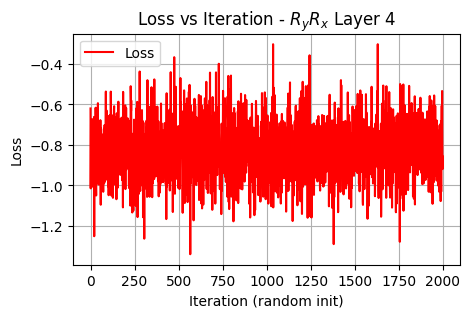

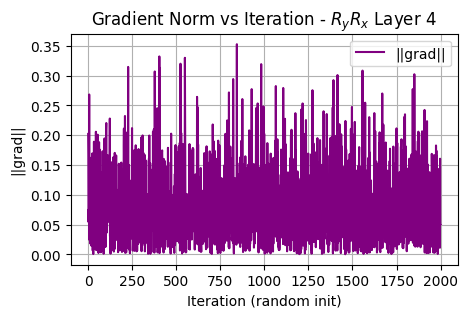

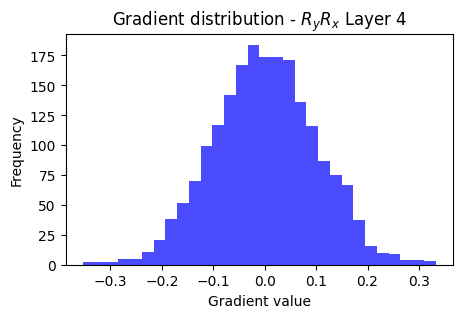


--- Layer 5 ---
Layer 5 | mean_grad=7.962146e-02, var_grad=9.834909e-03, error=9.104536e-01 Hartree


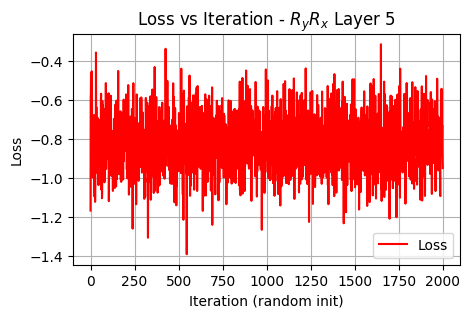

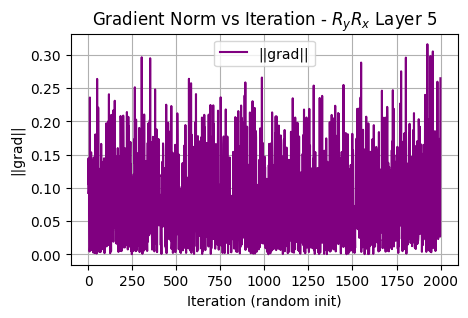

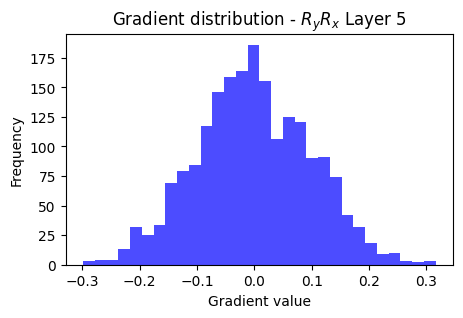


 Mean Gradient vs. Layers

[0.09496128029834293, 0.09017473548640693, 0.08349576843770944, 0.08043141205452126, 0.07962145574116272]

Variance Gradient vs. Layers

[0.014414389989499508, 0.012797719080772502, 0.011014248078041277, 0.0101337223773712, 0.009834909019360497]


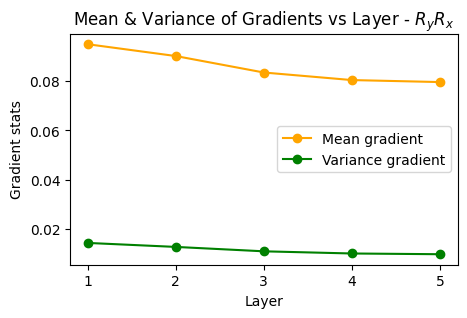


=== Barren Plateau Analysis for Ansatz $R_y R_z$ ===

--- Layer 1 ---
Layer 1 | mean_grad=1.118907e-01, var_grad=2.054129e-02, error=1.007008e+00 Hartree


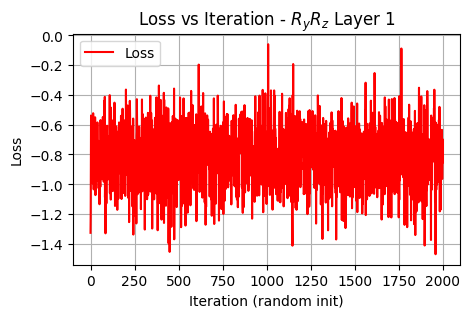

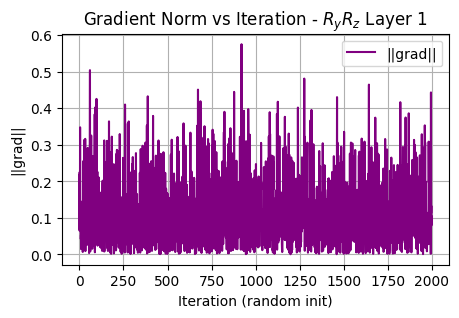

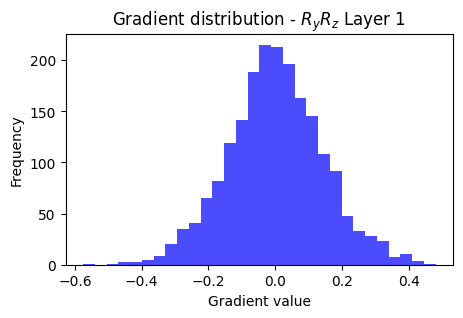


--- Layer 2 ---
Layer 2 | mean_grad=9.368103e-02, var_grad=1.416669e-02, error=9.173784e-01 Hartree


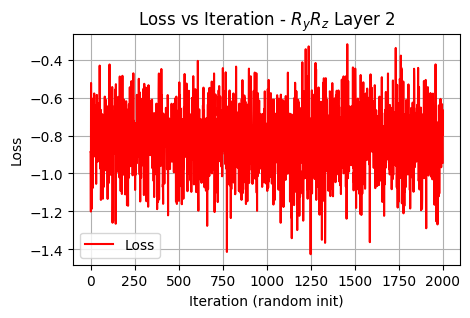

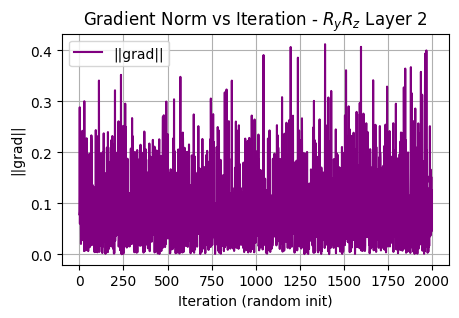

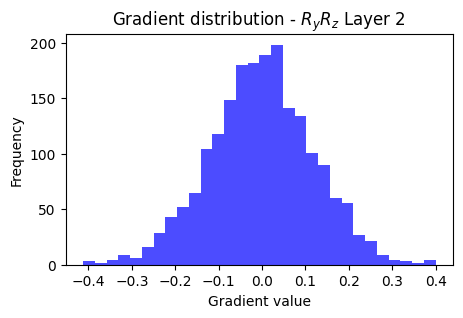


--- Layer 3 ---
Layer 3 | mean_grad=8.268982e-02, var_grad=1.099273e-02, error=1.134450e+00 Hartree


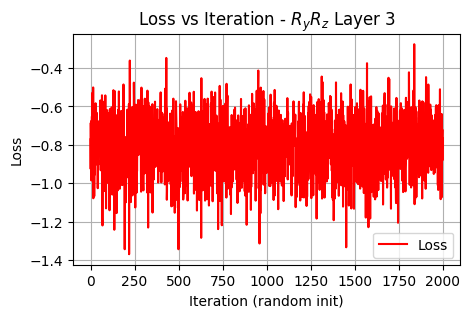

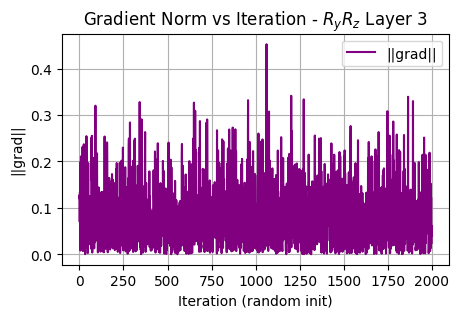

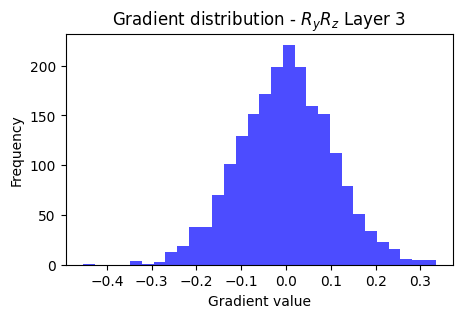


--- Layer 4 ---
Layer 4 | mean_grad=8.354553e-02, var_grad=1.098720e-02, error=9.575558e-01 Hartree


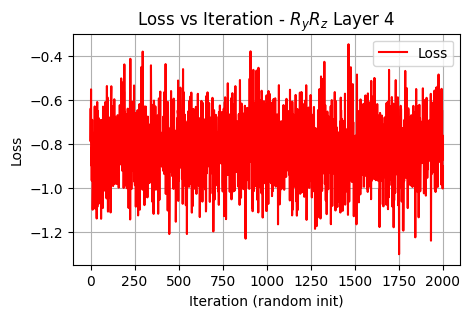

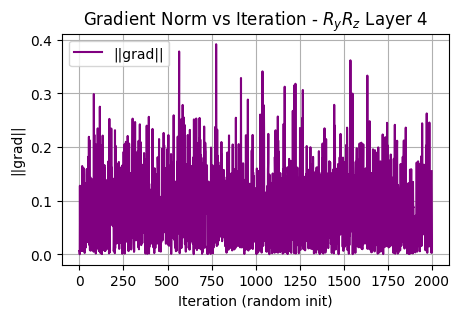

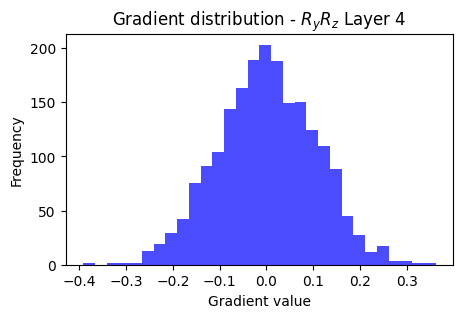


--- Layer 5 ---
Layer 5 | mean_grad=7.847294e-02, var_grad=9.686382e-03, error=1.154793e+00 Hartree


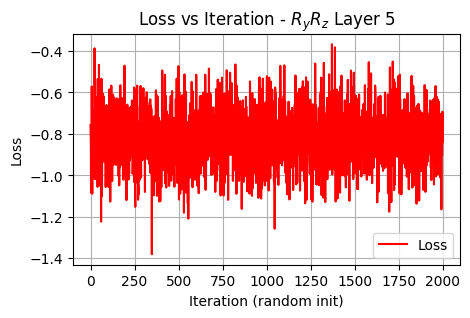

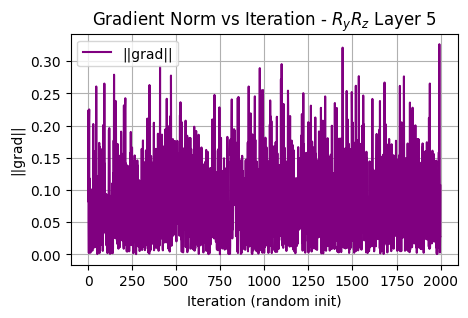

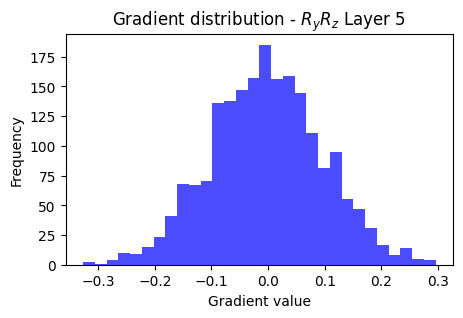


 Mean Gradient vs. Layers

[0.11189069808177467, 0.09368102896591814, 0.0826898169686001, 0.08354552549879776, 0.07847293776712537]

Variance Gradient vs. Layers

[0.020541287160771738, 0.01416669162114635, 0.010992725516697324, 0.010987200338150966, 0.009686382264962698]


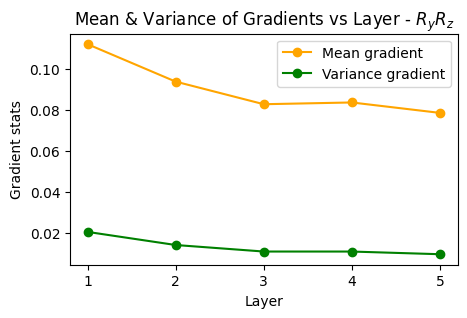


=== Barren Plateau Analysis for Ansatz $H R_y$ ===

--- Layer 1 ---
Layer 1 | mean_grad=1.387421e-01, var_grad=3.138607e-02, error=1.225316e+00 Hartree


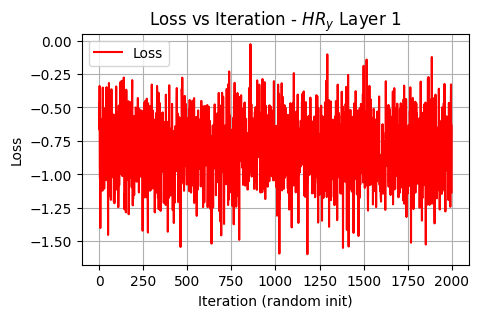

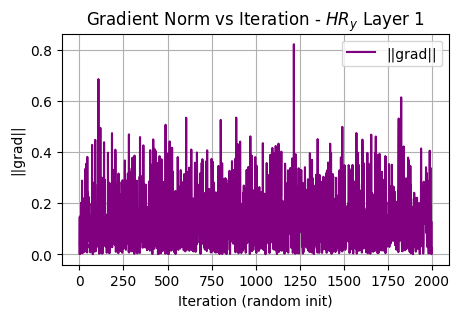

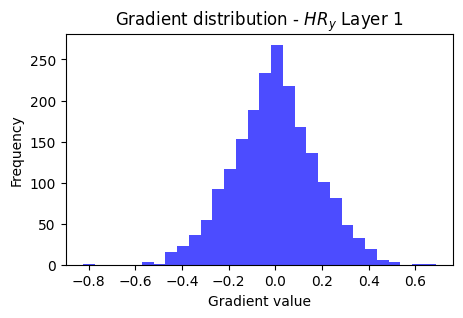


--- Layer 2 ---
Layer 2 | mean_grad=1.298181e-01, var_grad=2.616091e-02, error=9.932885e-01 Hartree


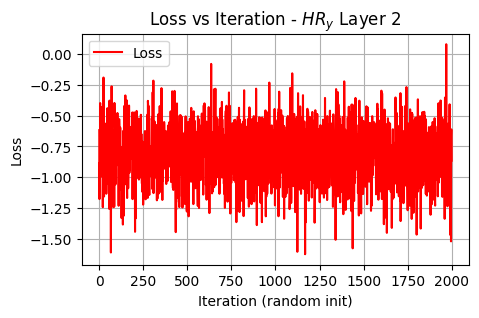

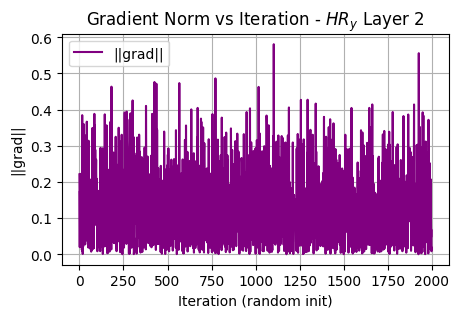

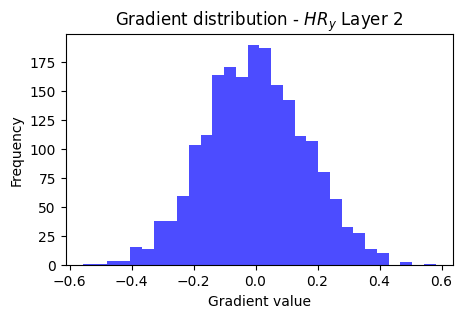


--- Layer 3 ---
Layer 3 | mean_grad=1.159712e-01, var_grad=2.121376e-02, error=1.015383e+00 Hartree


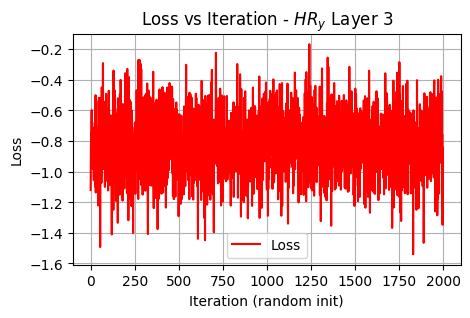

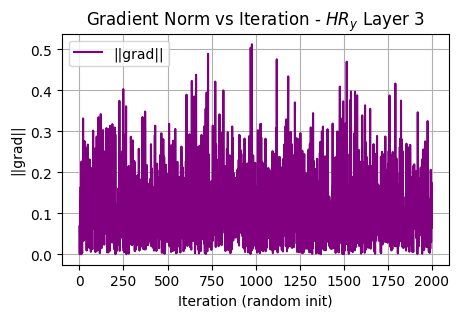

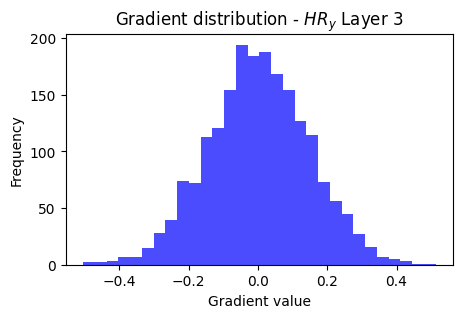


--- Layer 4 ---
Layer 4 | mean_grad=1.134538e-01, var_grad=2.051016e-02, error=1.204710e+00 Hartree


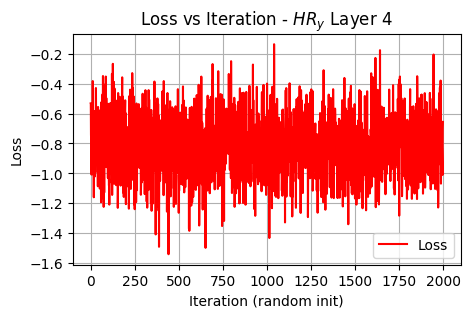

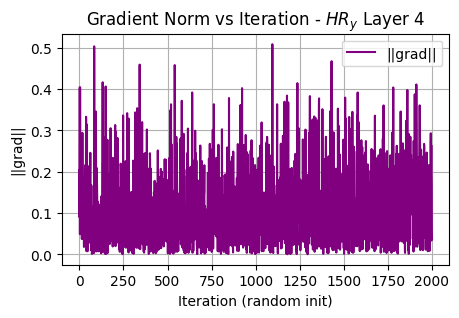

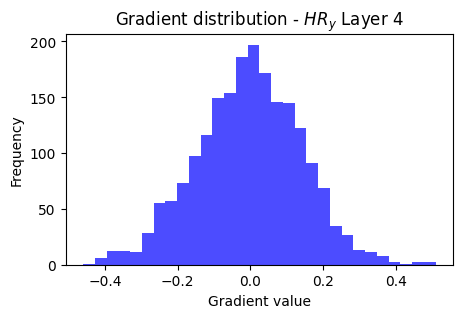


--- Layer 5 ---
Layer 5 | mean_grad=1.132735e-01, var_grad=1.967706e-02, error=1.040556e+00 Hartree


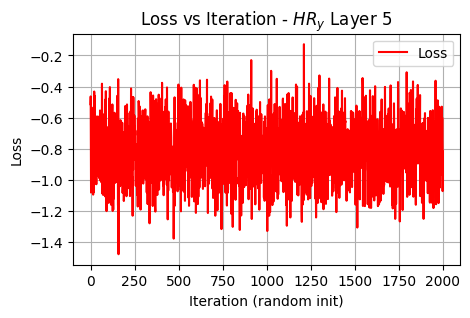

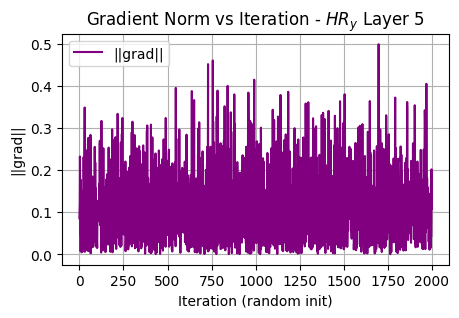

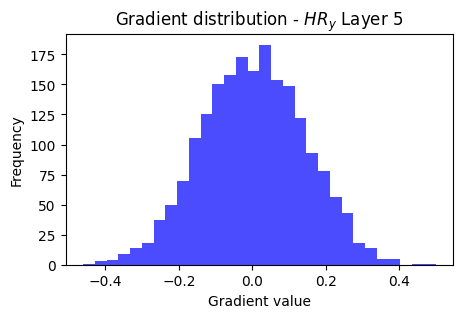


 Mean Gradient vs. Layers

[0.1387420600151141, 0.12981806472215004, 0.11597120879167597, 0.11345382935524233, 0.1132735159139366]

Variance Gradient vs. Layers

[0.0313860652107174, 0.02616090593748221, 0.021213759744794752, 0.020510156067565042, 0.019677060413508633]


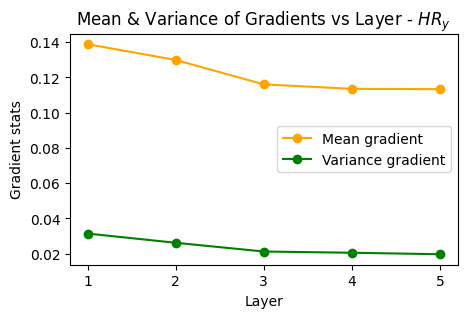


=== Barren Plateau Analysis for Ansatz $S R_y$ ===

--- Layer 1 ---
Layer 1 | mean_grad=9.964098e-02, var_grad=1.718634e-02, error=1.019466e+00 Hartree


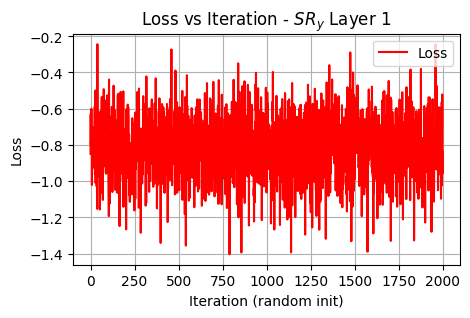

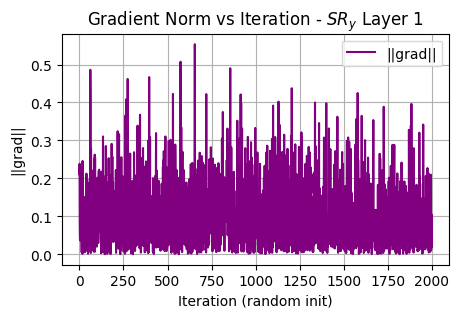

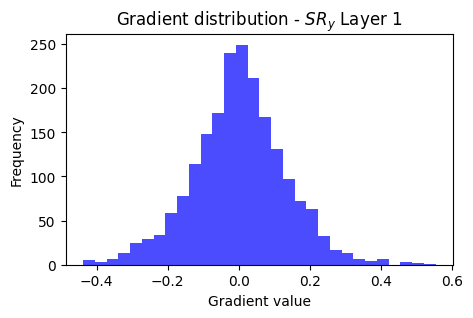


--- Layer 2 ---
Layer 2 | mean_grad=8.462029e-02, var_grad=1.171011e-02, error=8.590231e-01 Hartree


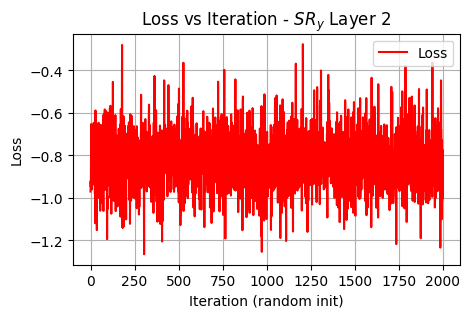

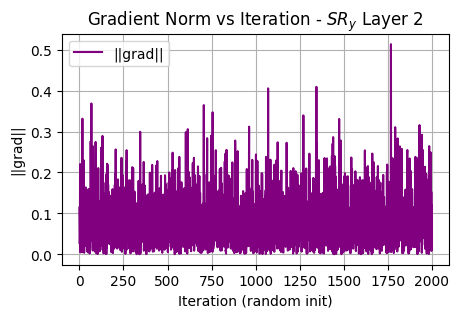

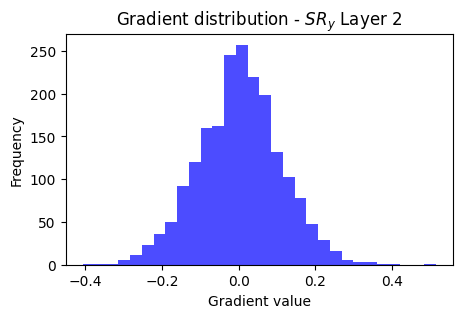


--- Layer 3 ---
Layer 3 | mean_grad=8.124317e-02, var_grad=1.069493e-02, error=1.109870e+00 Hartree


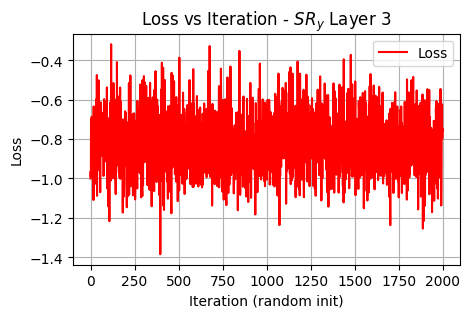

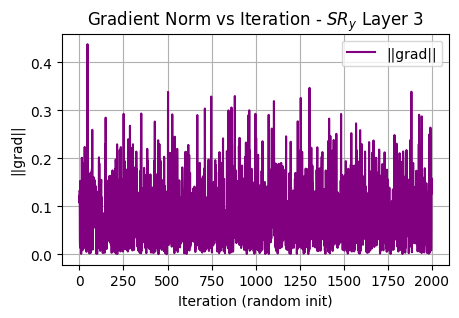

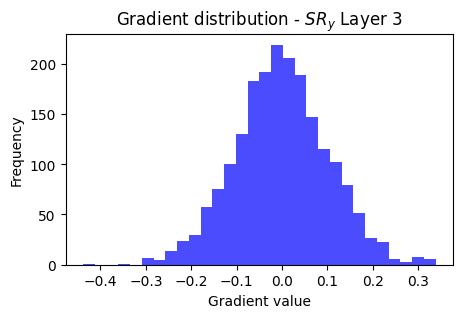


--- Layer 4 ---
Layer 4 | mean_grad=7.956164e-02, var_grad=1.011967e-02, error=1.206104e+00 Hartree


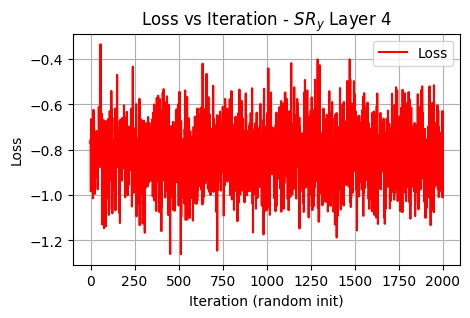

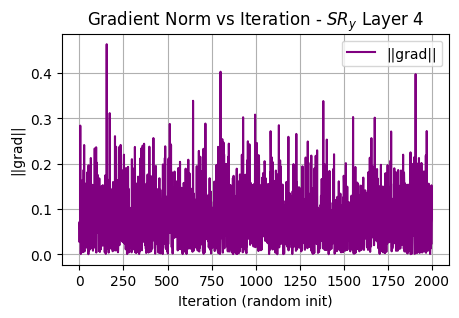

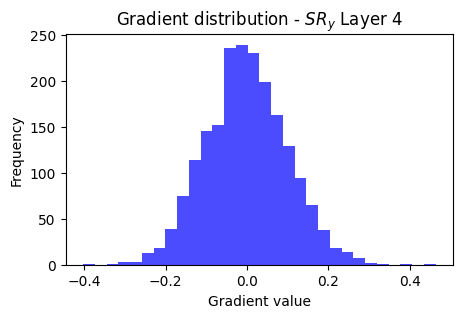


--- Layer 5 ---
Layer 5 | mean_grad=7.691474e-02, var_grad=9.435820e-03, error=9.337083e-01 Hartree


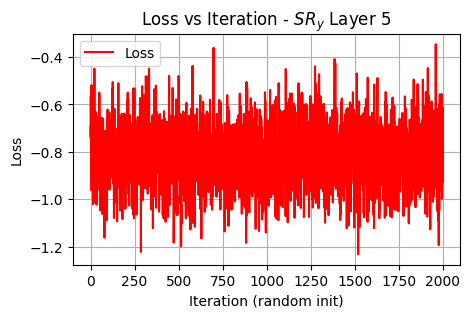

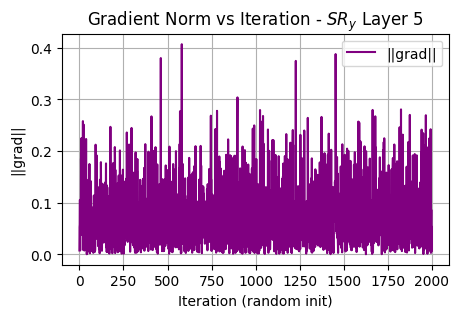

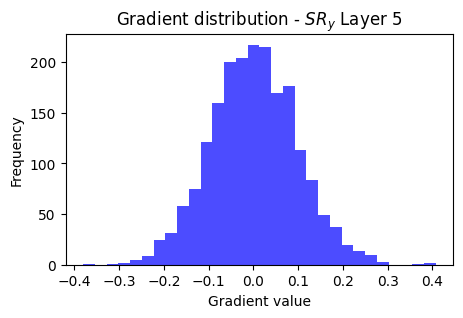


 Mean Gradient vs. Layers

[0.09964098137707537, 0.08462028869928917, 0.08124316927403281, 0.07956163503986792, 0.0769147382257961]

Variance Gradient vs. Layers

[0.017186338099711408, 0.011710114116591834, 0.010694932887795007, 0.010119674250155681, 0.009435820110775726]


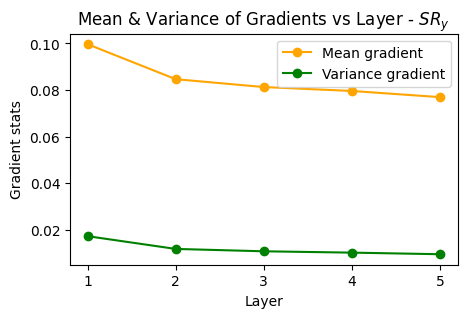


=== Barren Plateau Analysis for Ansatz $T R_y$ ===

--- Layer 1 ---
Layer 1 | mean_grad=1.086432e-01, var_grad=2.023517e-02, error=7.527947e-01 Hartree


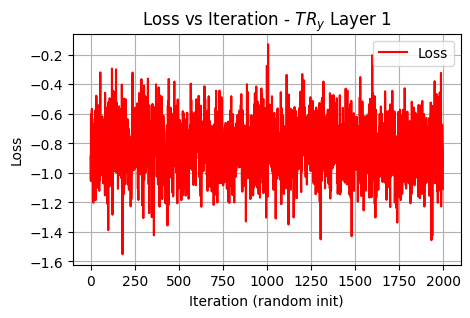

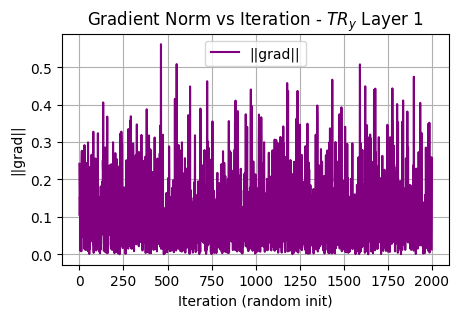

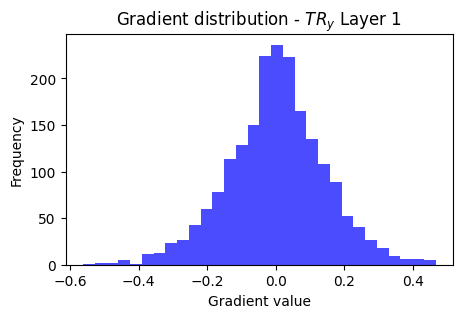


--- Layer 2 ---
Layer 2 | mean_grad=9.667859e-02, var_grad=1.493737e-02, error=1.325462e+00 Hartree


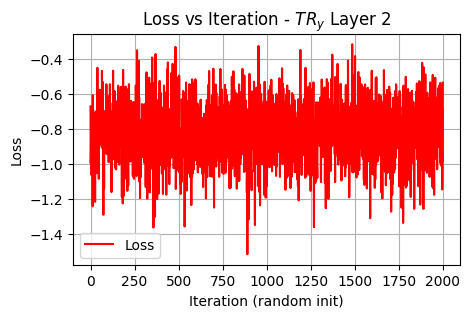

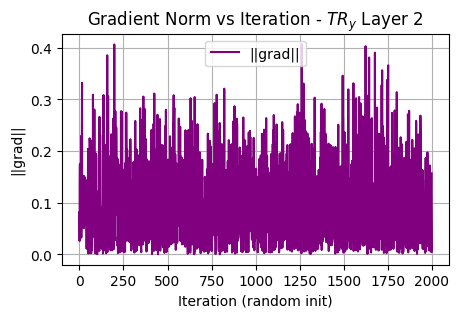

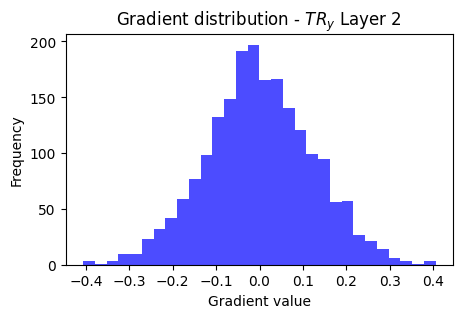


--- Layer 3 ---
Layer 3 | mean_grad=8.748900e-02, var_grad=1.223327e-02, error=9.435614e-01 Hartree


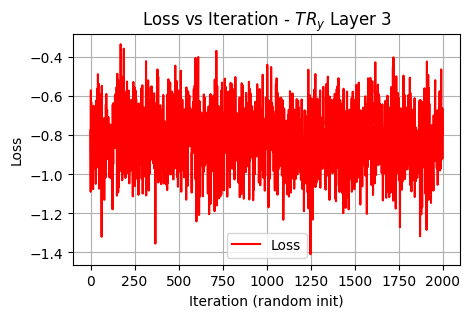

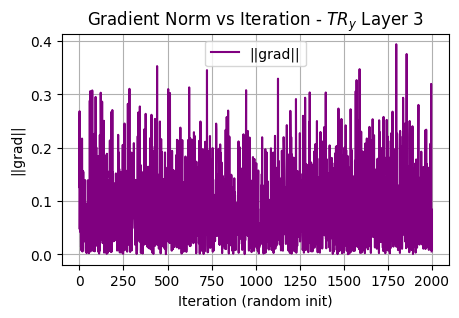

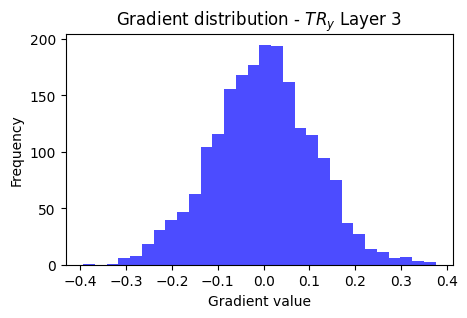


--- Layer 4 ---
Layer 4 | mean_grad=8.239487e-02, var_grad=1.079202e-02, error=1.030557e+00 Hartree


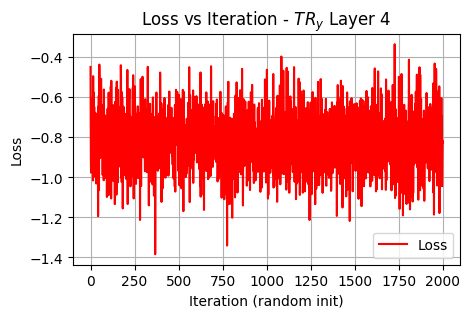

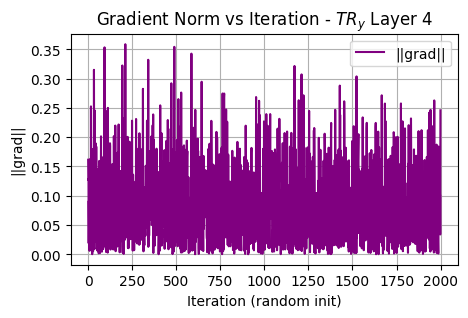

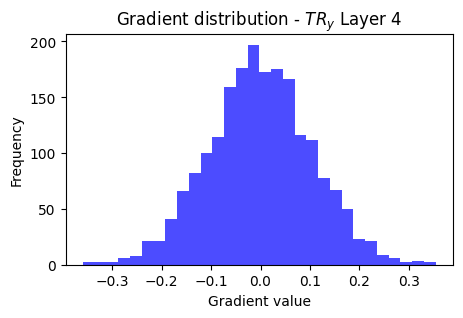


--- Layer 5 ---
Layer 5 | mean_grad=7.982504e-02, var_grad=1.022382e-02, error=1.131613e+00 Hartree


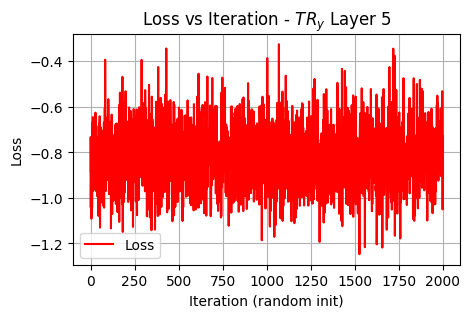

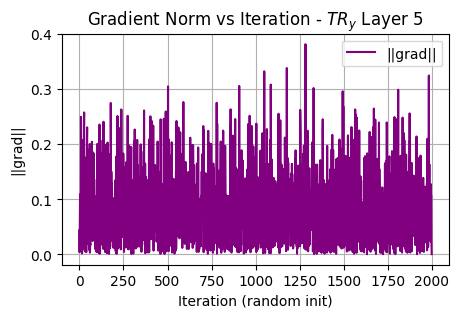

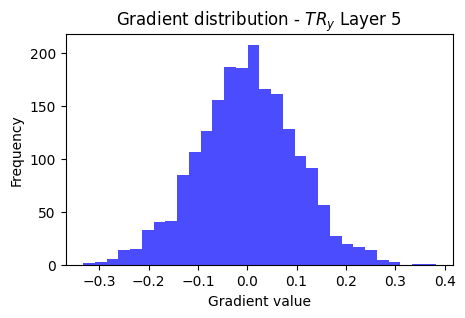


 Mean Gradient vs. Layers

[0.1086432312790626, 0.0966785872489179, 0.08748899760757027, 0.0823948720687313, 0.07982503879541908]

Variance Gradient vs. Layers

[0.020235167208919554, 0.014937371354775904, 0.01223326609651282, 0.010792016711930802, 0.010223821182130097]


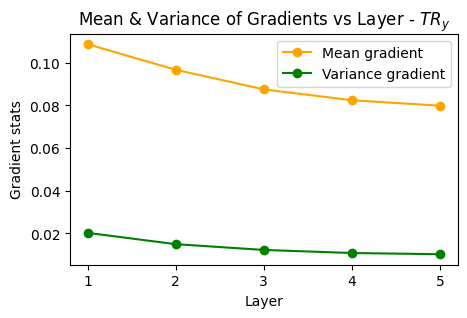


=== Barren Plateau Analysis for Ansatz $X R_y$ ===

--- Layer 1 ---
Layer 1 | mean_grad=1.400460e-01, var_grad=3.169668e-02, error=9.775611e-01 Hartree


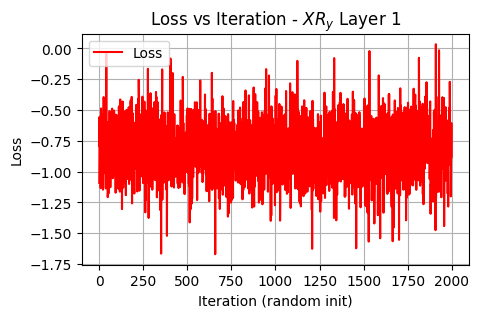

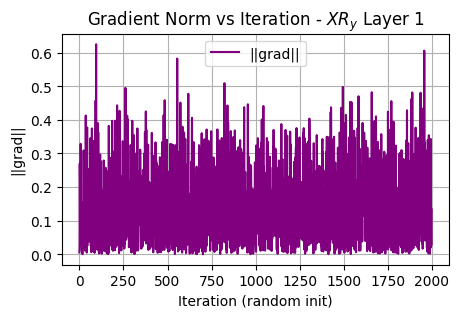

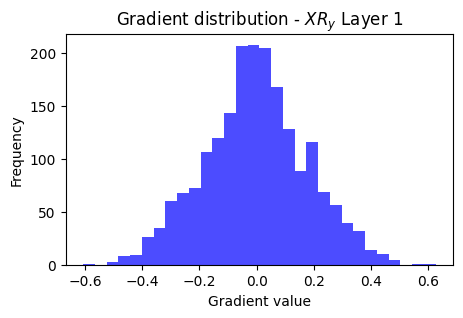


--- Layer 2 ---
Layer 2 | mean_grad=1.289615e-01, var_grad=2.581383e-02, error=1.396573e+00 Hartree


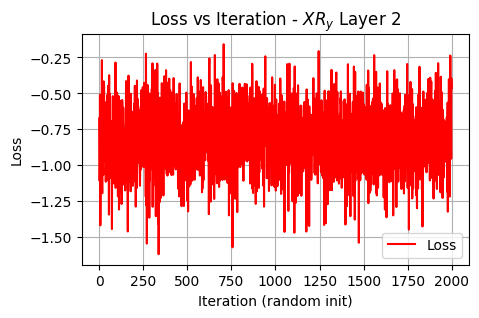

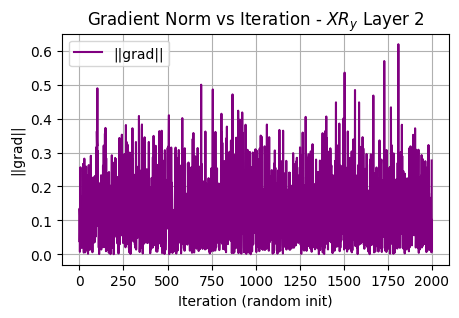

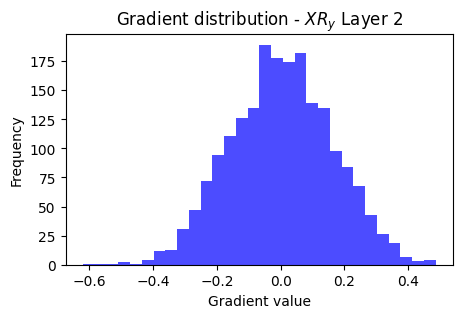


--- Layer 3 ---
Layer 3 | mean_grad=1.179505e-01, var_grad=2.201500e-02, error=1.297171e+00 Hartree


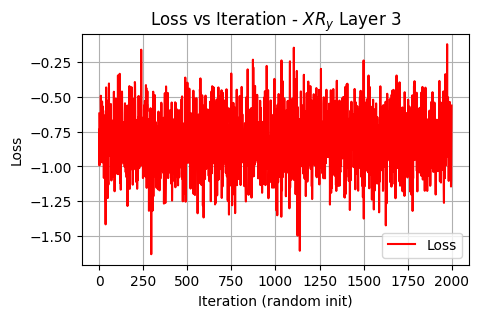

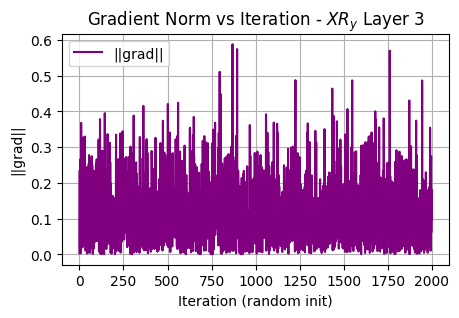

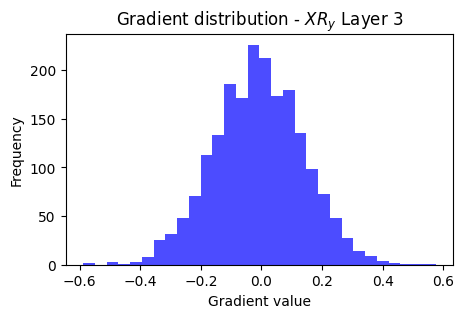


--- Layer 4 ---
Layer 4 | mean_grad=1.153396e-01, var_grad=2.052050e-02, error=9.564402e-01 Hartree


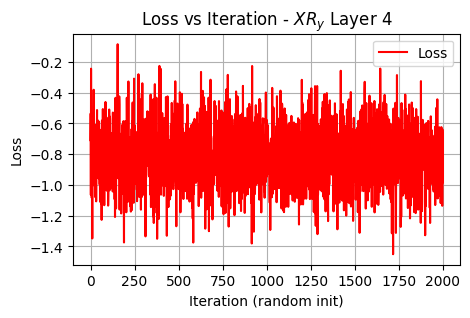

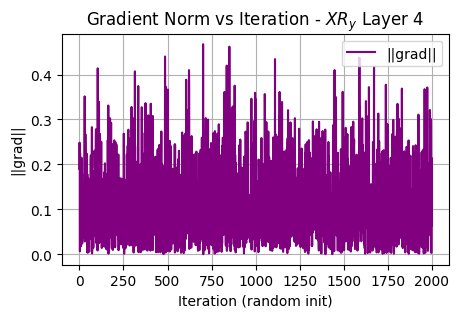

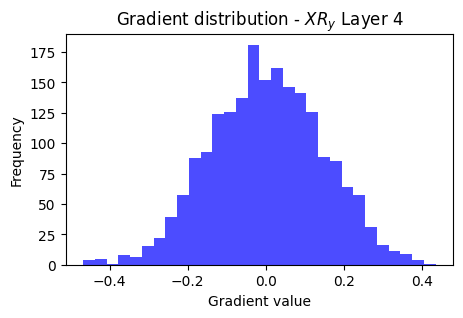


--- Layer 5 ---
Layer 5 | mean_grad=1.116165e-01, var_grad=1.957176e-02, error=8.599606e-01 Hartree


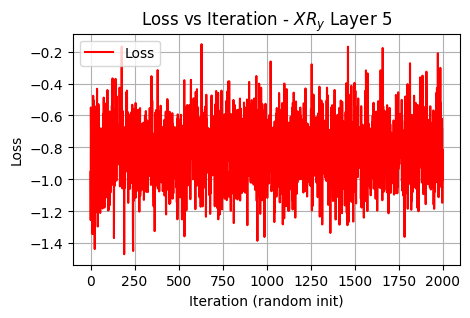

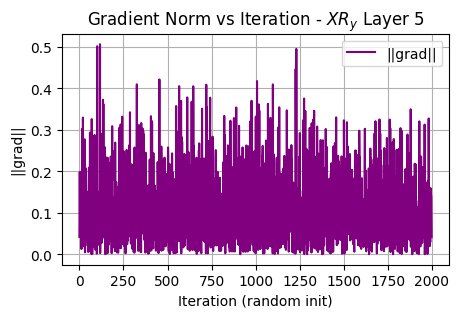

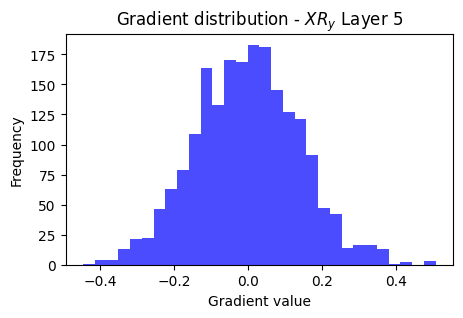


 Mean Gradient vs. Layers

[0.14004599893925326, 0.12896153011782974, 0.11795053438078991, 0.11533964810604948, 0.11161649757037355]

Variance Gradient vs. Layers

[0.031696680915822596, 0.025813828704386216, 0.022015001221743304, 0.020520497385116045, 0.01957176285490632]


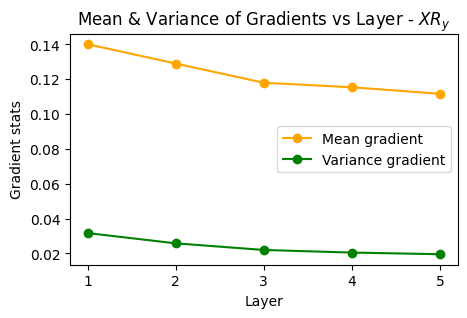


=== Barren Plateau Analysis for Ansatz $Y R_y$ ===

--- Layer 1 ---
Layer 1 | mean_grad=1.370454e-01, var_grad=3.010016e-02, error=1.476977e+00 Hartree


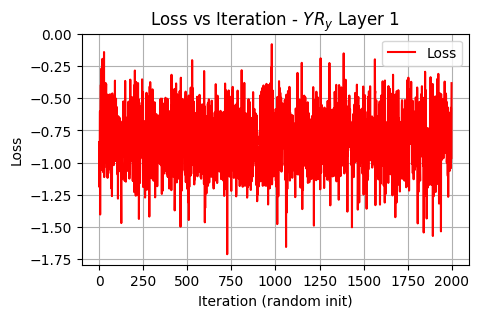

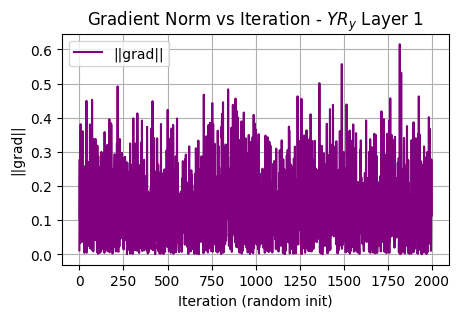

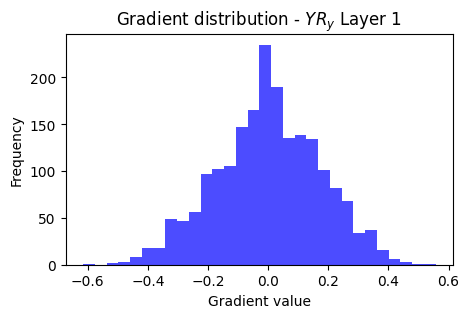


--- Layer 2 ---
Layer 2 | mean_grad=1.249862e-01, var_grad=2.469568e-02, error=8.966160e-01 Hartree


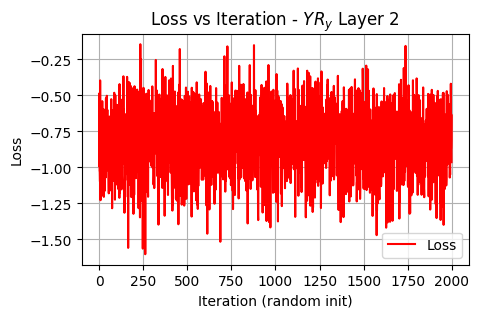

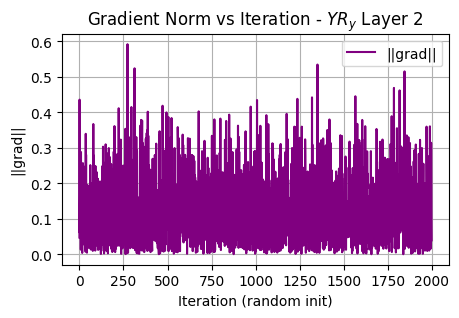

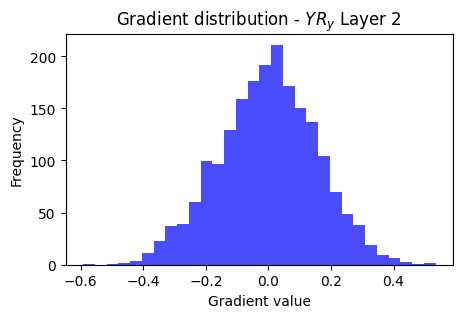


--- Layer 3 ---
Layer 3 | mean_grad=1.176611e-01, var_grad=2.137501e-02, error=4.989201e-01 Hartree


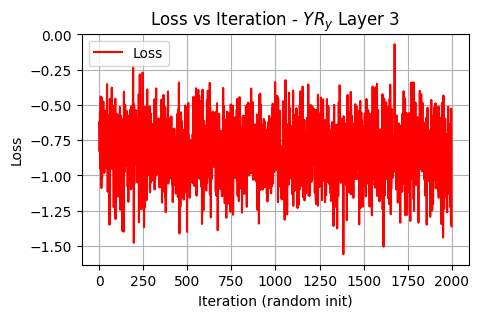

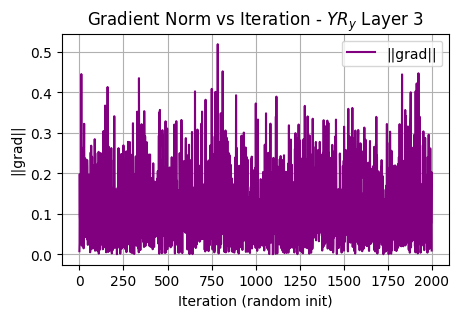

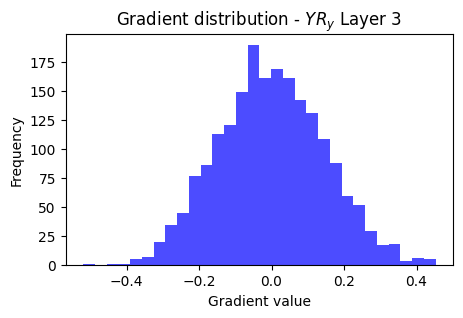


--- Layer 4 ---
Layer 4 | mean_grad=1.095882e-01, var_grad=1.918617e-02, error=1.215423e+00 Hartree


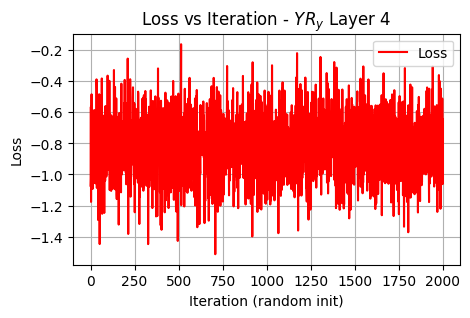

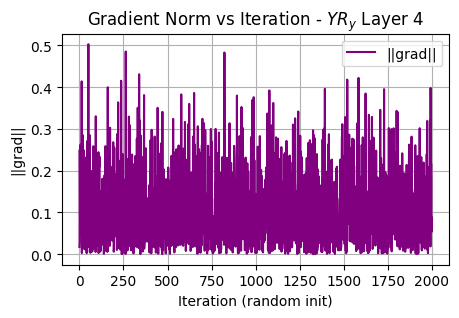

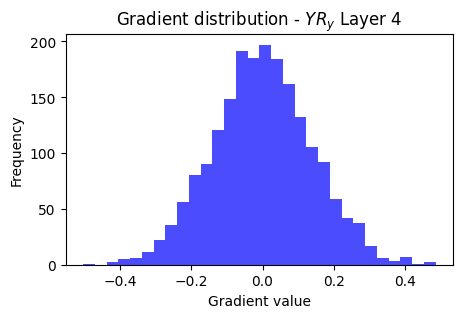


--- Layer 5 ---
Layer 5 | mean_grad=1.116647e-01, var_grad=1.952377e-02, error=8.043699e-01 Hartree


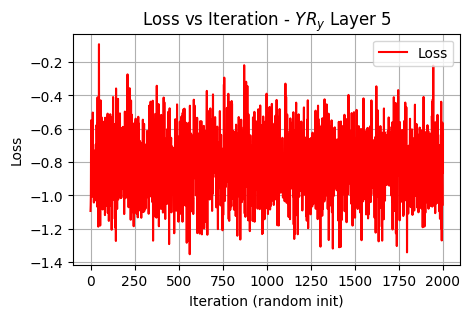

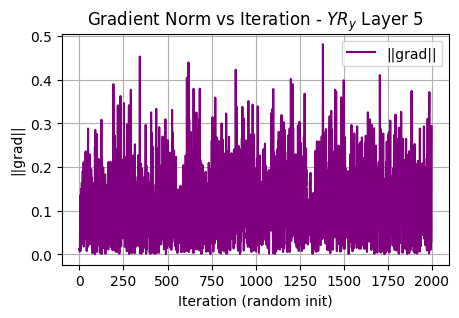

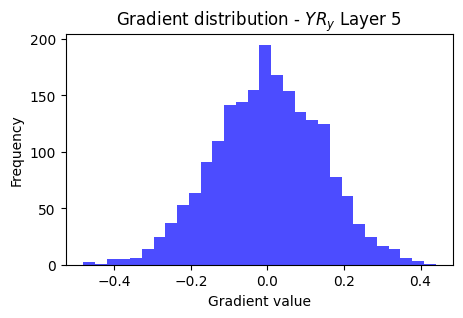


 Mean Gradient vs. Layers

[0.13704539913743172, 0.12498622213619226, 0.11766113050643068, 0.10958822692595213, 0.11166466771376832]

Variance Gradient vs. Layers

[0.03010015821105691, 0.024695682442372253, 0.021375006936577356, 0.019186172518464717, 0.01952376949339286]


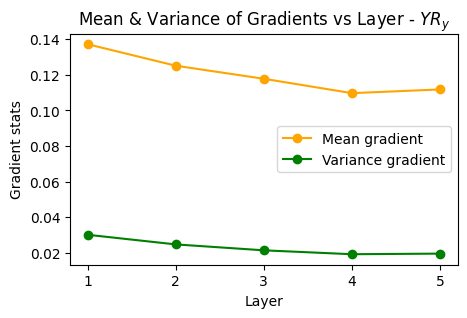


=== Barren Plateau Analysis for Ansatz $Z R_y$ ===

--- Layer 1 ---
Layer 1 | mean_grad=1.401260e-01, var_grad=3.145268e-02, error=1.092177e+00 Hartree


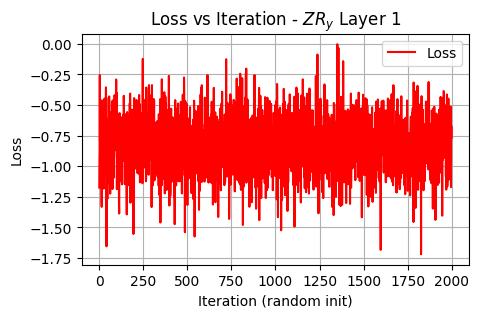

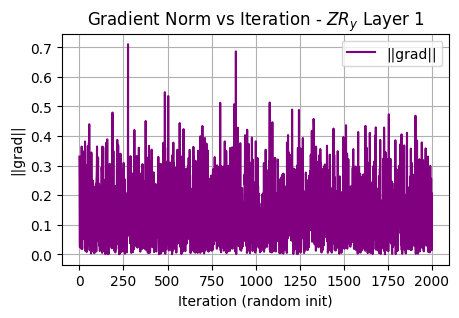

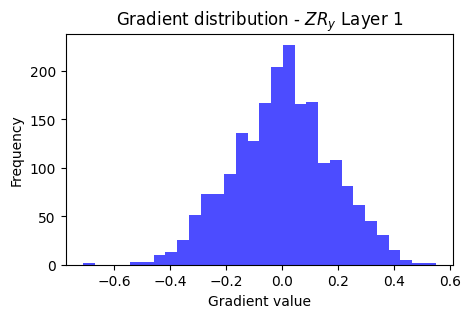


--- Layer 2 ---
Layer 2 | mean_grad=1.264488e-01, var_grad=2.511862e-02, error=1.268581e+00 Hartree


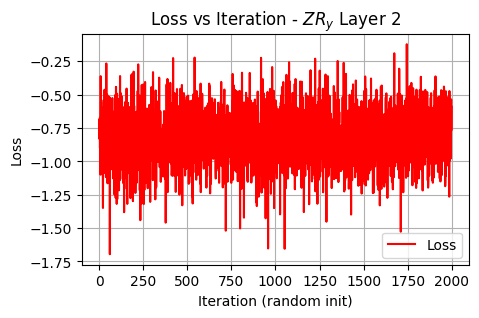

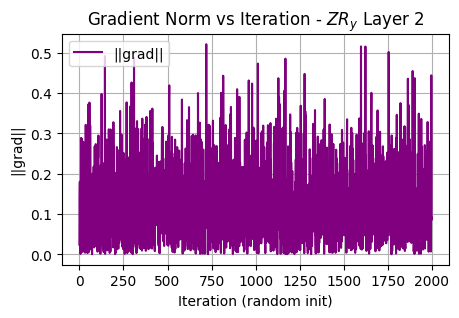

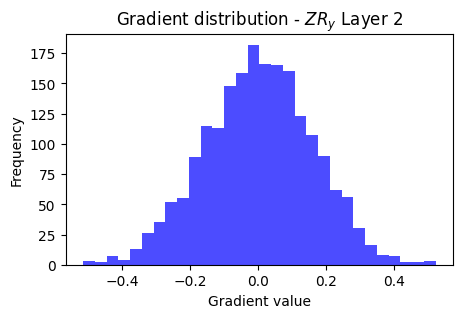


--- Layer 3 ---
Layer 3 | mean_grad=1.150110e-01, var_grad=2.079862e-02, error=1.151174e+00 Hartree


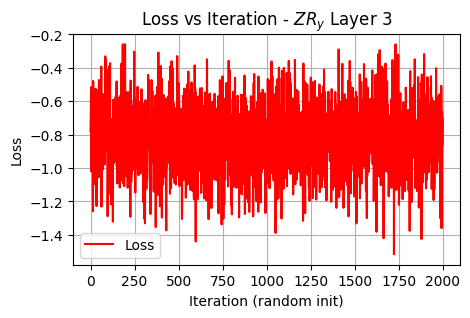

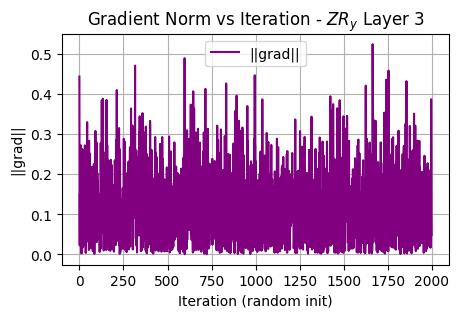

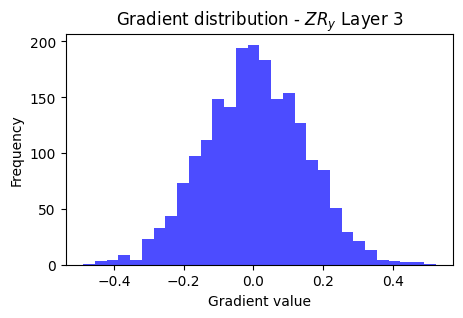


--- Layer 4 ---
Layer 4 | mean_grad=1.148808e-01, var_grad=2.090087e-02, error=1.143787e+00 Hartree


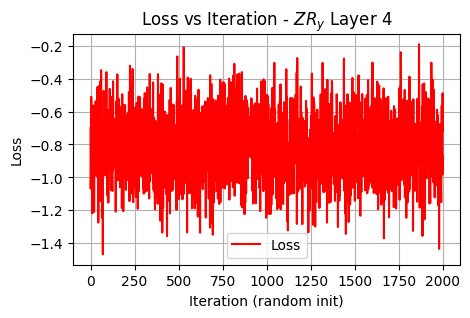

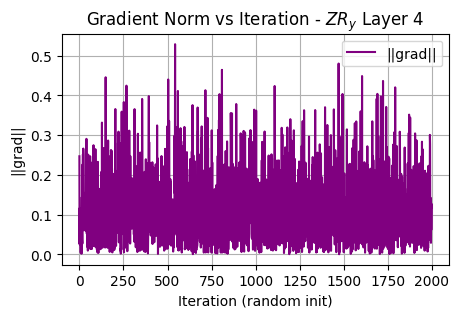

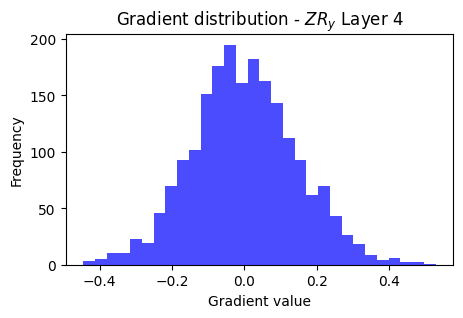


--- Layer 5 ---
Layer 5 | mean_grad=1.117709e-01, var_grad=1.972361e-02, error=9.240153e-01 Hartree


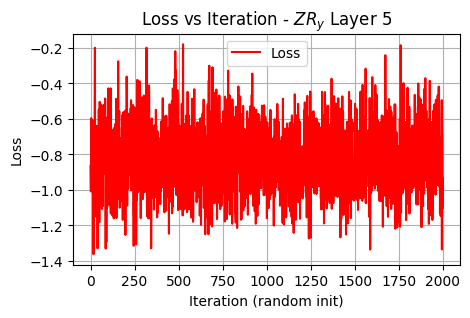

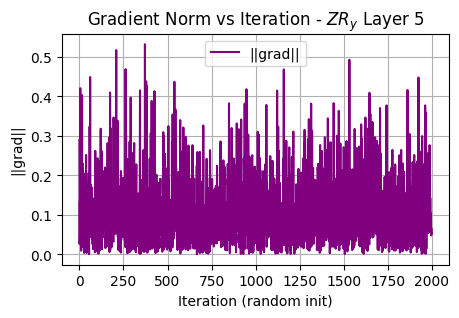

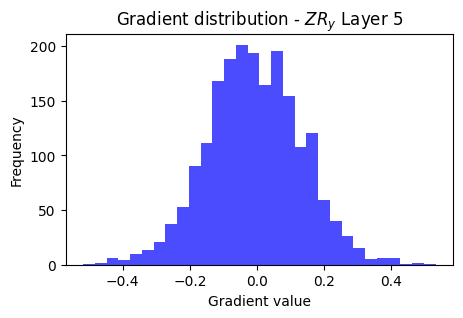


 Mean Gradient vs. Layers

[0.140125989668745, 0.1264487934781966, 0.11501103028097748, 0.11488077277318592, 0.1117708634991975]

Variance Gradient vs. Layers

[0.03145267617751097, 0.02511861625505738, 0.02079862370345414, 0.020900872911131657, 0.019723607041292616]


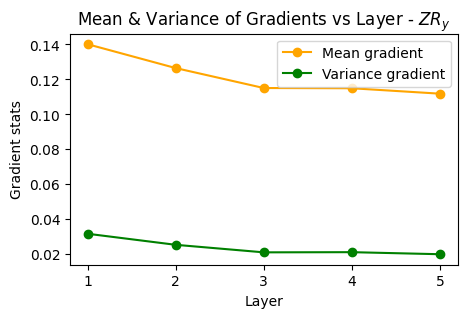

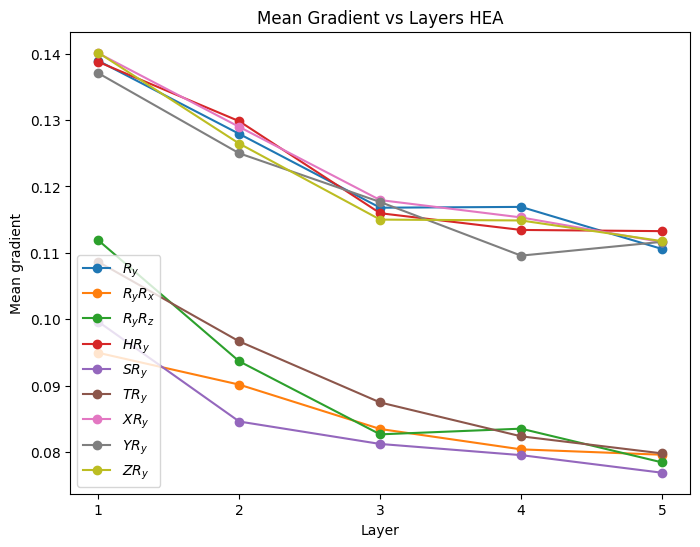

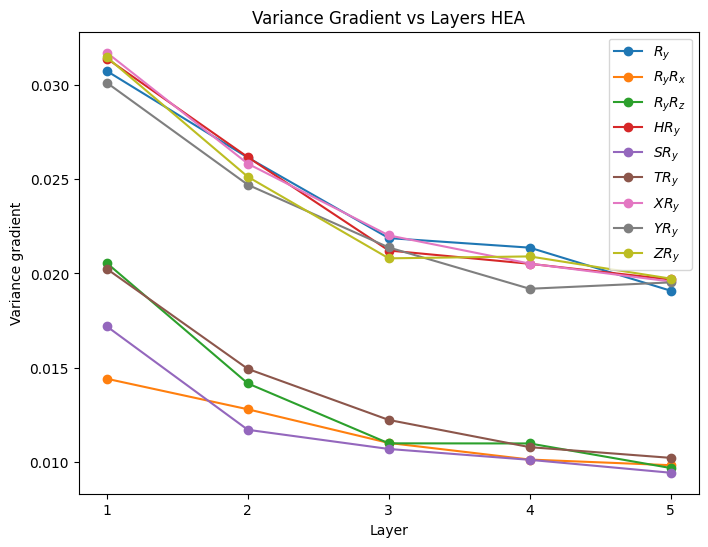

In [6]:
x_theta0 = np.linspace(0.0, 2*np.pi, samples)
N_qubits = 4
layers = [1, 2, 3, 4, 5]  # variasi jumlah layer

def loss_func_hamiltonian(num_qubits, ansatz, hamiltonian_op, param_list, param_values):
    bind_dict = {p: float(val) for p, val in zip(param_list, param_values)}
    circuit = ansatz.assign_parameters(bind_dict)
    state = Statevector.from_label('0' * num_qubits).evolve(circuit).data
    energy = np.real(np.dot(np.conjugate(state), np.dot(hamiltonian_op, state)))
    return energy

def compute_ansatz_gradient(num_qubits, ansatz, hamiltonian, param_list, theta, param_indices, shift=np.pi/2):
    grads = []
    for idx in param_indices:
        tp = theta.copy()
        tm = theta.copy()
        tp[idx] += shift
        tm[idx] -= shift
        Ep = loss_func_hamiltonian(num_qubits, ansatz, hamiltonian, param_list, tp)
        Em = loss_func_hamiltonian(num_qubits, ansatz, hamiltonian, param_list, tm)
        grads.append(0.5 * (Ep - Em))
    return np.array(grads)

results_grad = {}

for gate_label, gate in gates_counts:
    print(f"\n=== Barren Plateau Analysis for Ansatz {gate_label} ===")
    mean_grads_layer = []
    var_grads_layer = []

    for l in layers:
        print(f"\n--- Layer {l} ---")
        algorithm_globals.random_seed = 50

        ansatz = hea_custom(N_qubits, l, gate)
        param_list = list(ansatz.parameters)
        param_indices = [0]
        grad_history = {idx: [] for idx in param_indices}
        loss_history = []
        grad_norm_history = []

        for it in range(samples):
            theta = np.random.uniform(0, 2*np.pi, len(param_list)).astype(float)
            grad_vals = compute_ansatz_gradient(N_qubits, ansatz, hamiltonian_operator,
                                                param_list, theta, param_indices)
            loss = loss_func_hamiltonian(N_qubits, ansatz, hamiltonian_operator, param_list, theta)
            loss_history.append(loss)
            grad_norm_history.append(np.linalg.norm(grad_vals))

            for idx, g in zip(param_indices, grad_vals):
                grad_history[idx].append(g)

        grads_all = np.concatenate([grad_history[idx] for idx in param_indices])
        mean_grad = np.mean(np.abs(grads_all))
        var_grad = np.var(grads_all)
        mean_grads_layer.append(mean_grad)
        var_grads_layer.append(var_grad)

        loss_last = loss_history[-1]
        print(f"Layer {l} | mean_grad={mean_grad:.6e}, var_grad={var_grad:.6e}, error={abs(loss_last - electronic_energy):.6e} Hartree")

        # === Plot per layer ===
        plt.figure(figsize=(5,3))
        plt.plot(loss_history, color="red", label="Loss")
        plt.xlabel("Iteration (random init)")
        plt.ylabel("Loss")
        plt.title(f"Loss vs Iteration - {gate_label} Layer {l}")
        plt.grid(True)
        plt.legend()
        plt.show()

        plt.figure(figsize=(5,3))
        plt.plot(grad_norm_history, color="purple", label="||grad||")
        plt.xlabel("Iteration (random init)")
        plt.ylabel("||grad||")
        plt.title(f"Gradient Norm vs Iteration - {gate_label} Layer {l}")
        plt.grid(True)
        plt.legend()
        plt.show()

        plt.figure(figsize=(5,3))
        plt.hist(grads_all, bins=30, color="blue", alpha=0.7)
        plt.xlabel("Gradient value")
        plt.ylabel("Frequency")
        plt.title(f"Gradient distribution - {gate_label} Layer {l}")
        plt.show()
    
    results_grad[gate_label] = (mean_grads_layer, var_grads_layer)

    print("\n Mean Gradient vs. Layers\n")
    print(mean_grads_layer)
    print("\nVariance Gradient vs. Layers\n")
    print(var_grads_layer)

    plt.figure(figsize=(5,3))
    plt.plot(layers, mean_grads_layer, "o-", color="orange", label="Mean gradient")
    plt.plot(layers, var_grads_layer, "o-", color="green", label="Variance gradient")
    plt.xlabel("Layer")
    plt.ylabel("Gradient stats")
    plt.xticks(layers)
    plt.title(f"Mean & Variance of Gradients vs Layer - {gate_label}")
    plt.legend()
    plt.show()

    print("="*100)

plt.figure(figsize=(8,6))
for gate_label, (mean_vals, var_vals) in results_grad.items():
    plt.plot(layers, mean_vals, "o-", label=f"{gate_label}")
plt.xlabel("Layer")
plt.ylabel("Mean gradient")
plt.xticks(layers)
plt.title("Mean Gradient vs Layers HEA")
plt.legend()
plt.show()

# === Plot Variance Gradients per Gate ===
plt.figure(figsize=(8,6))
for gate_label, (mean_vals, var_vals) in results_grad.items():
    plt.plot(layers, var_vals, "o-", label=f"{gate_label}")
plt.xlabel("Layer")
plt.ylabel("Variance gradient")
plt.xticks(layers)
plt.title("Variance Gradient vs Layers HEA")
plt.legend()
plt.show()


=== Barren Plateau Analysis for Ansatz $R_y$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=3.188238e-01, var_grad=1.256095e-01


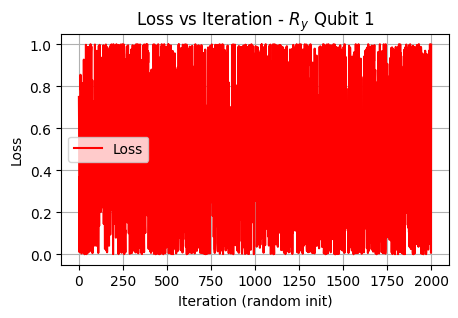

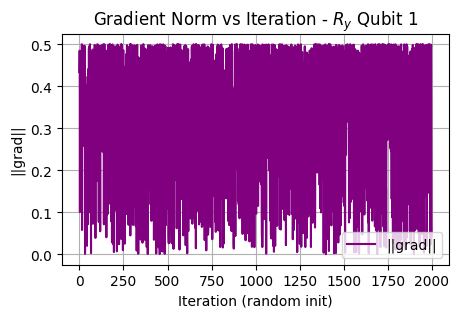

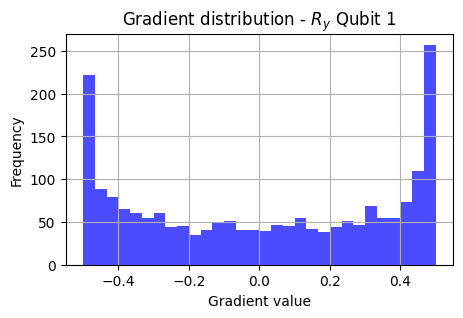


--- Qubit 2 ---
Qubit 2 | mean_grad=1.559351e-01, var_grad=4.093699e-02


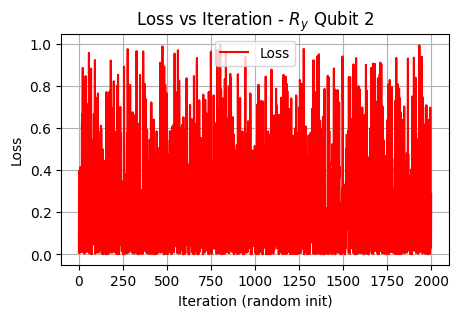

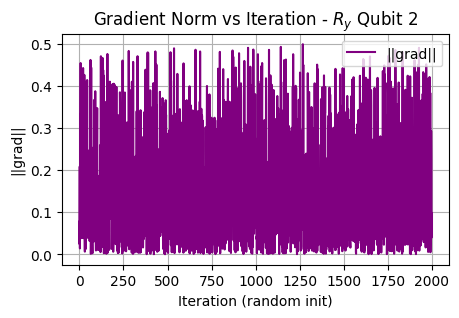

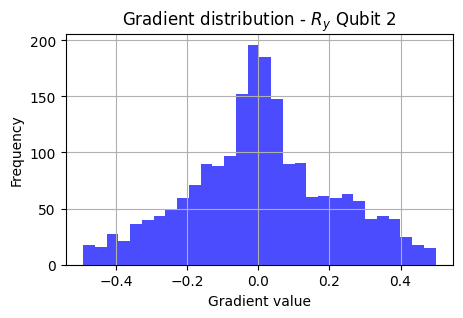


--- Qubit 3 ---
Qubit 3 | mean_grad=7.807955e-02, var_grad=1.300997e-02


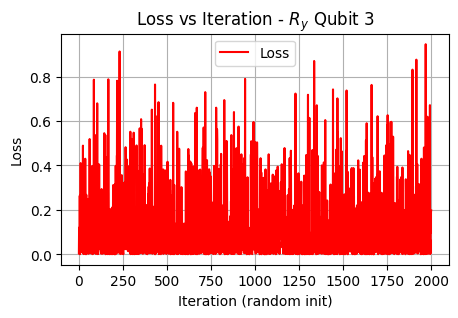

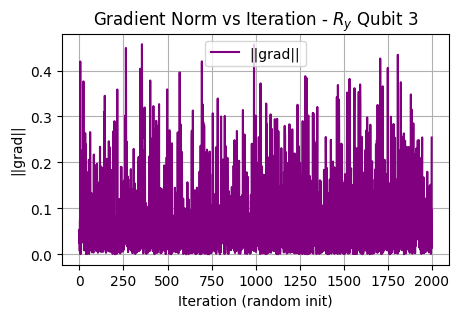

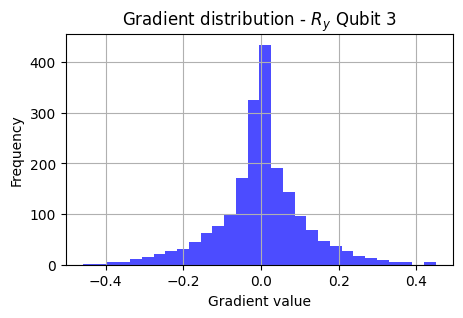


--- Qubit 4 ---
Qubit 4 | mean_grad=3.967503e-02, var_grad=4.403871e-03


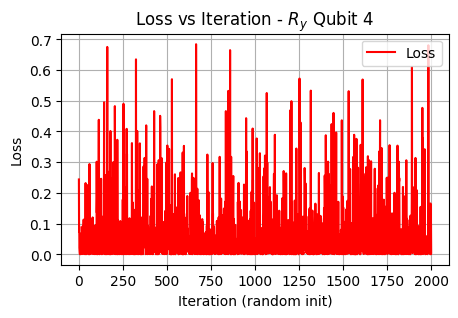

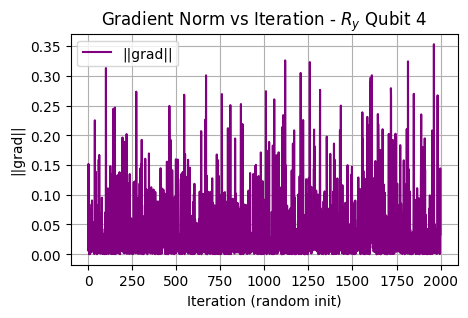

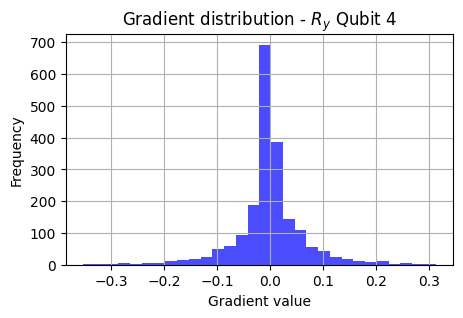


--- Qubit 5 ---
Qubit 5 | mean_grad=2.015531e-02, var_grad=1.408802e-03


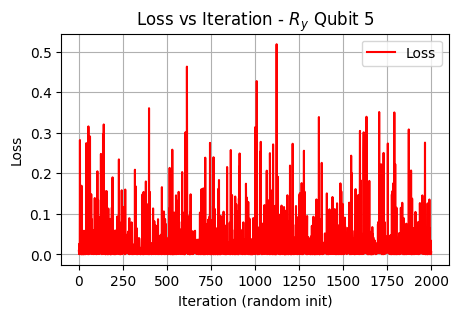

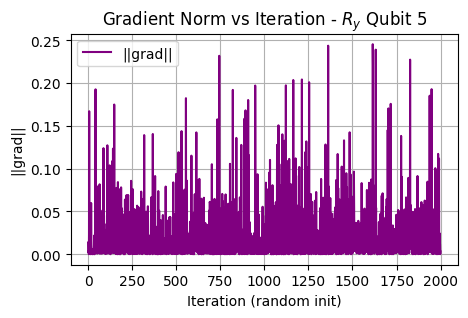

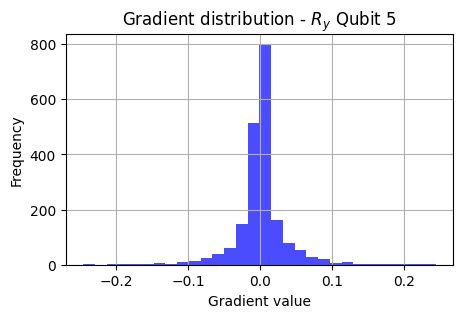


--- Qubit 6 ---
Qubit 6 | mean_grad=9.733937e-03, var_grad=3.571988e-04


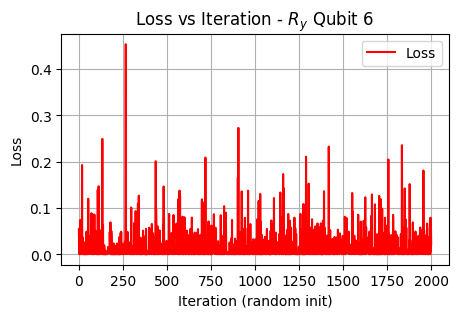

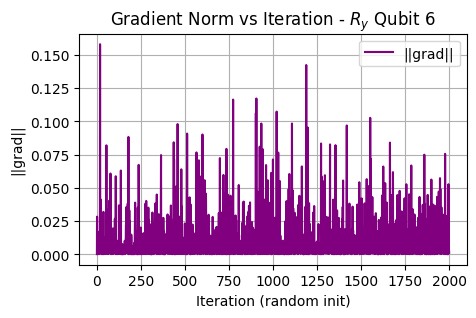

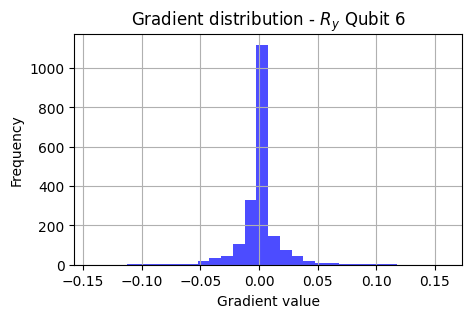


--- Qubit 7 ---
Qubit 7 | mean_grad=4.978906e-03, var_grad=1.395639e-04


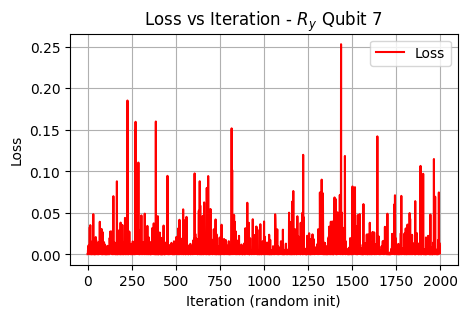

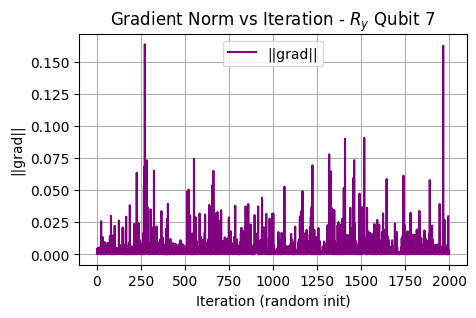

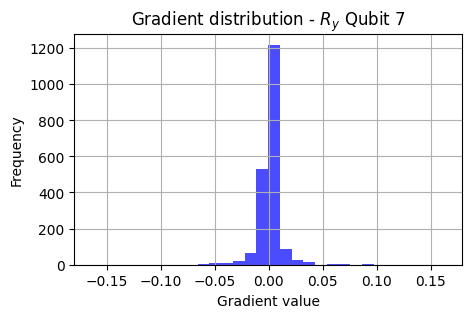


--- Qubit 8 ---
Qubit 8 | mean_grad=2.390514e-03, var_grad=3.782416e-05


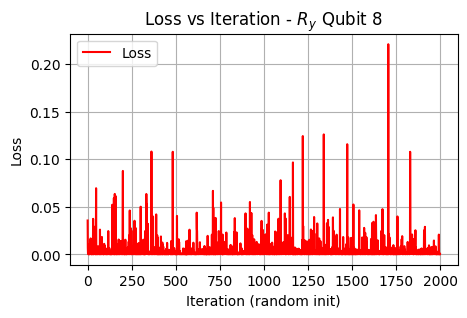

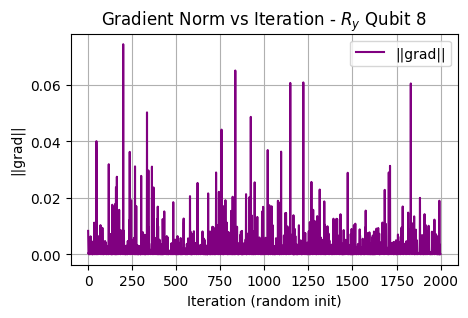

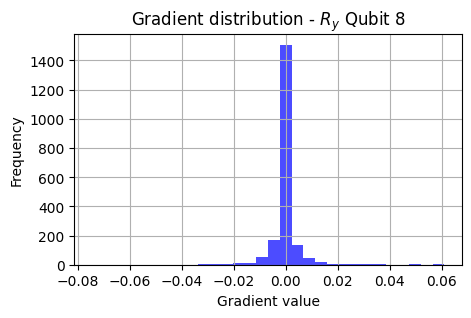


 Mean Gradient vs. Qubits

['3.188238e-01', '1.559351e-01', '7.807955e-02', '3.967503e-02', '2.015531e-02', '9.733937e-03', '4.978906e-03', '2.390514e-03']

Variance Gradient vs. Qubits

['1.256095e-01', '4.093699e-02', '1.300997e-02', '4.403871e-03', '1.408802e-03', '3.571988e-04', '1.395639e-04', '3.782416e-05']
Time taken for $R_y$: 86.07 seconds


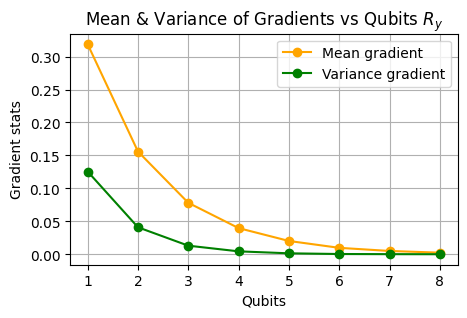


=== Barren Plateau Analysis for Ansatz $R_y R_x$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=2.457020e-01, var_grad=8.084982e-02


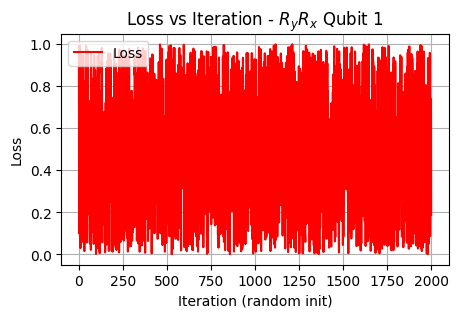

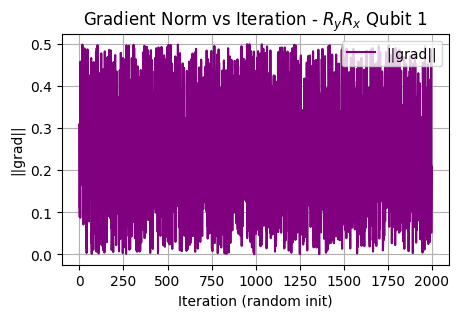

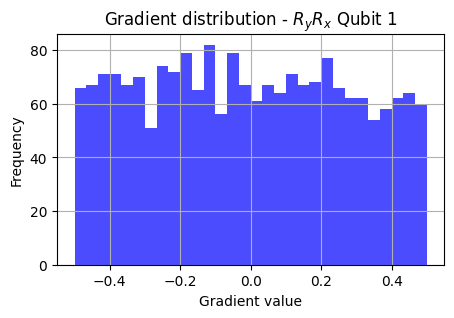


--- Qubit 2 ---
Qubit 2 | mean_grad=1.312758e-01, var_grad=2.671402e-02


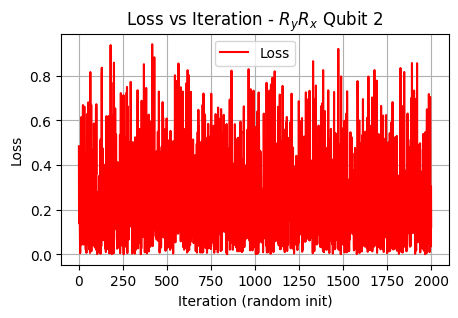

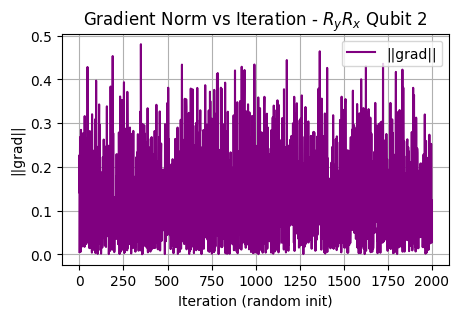

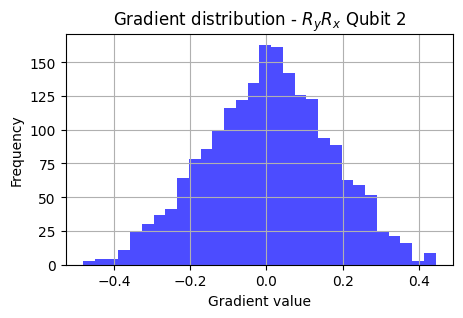


--- Qubit 3 ---
Qubit 3 | mean_grad=6.479388e-02, var_grad=7.764226e-03


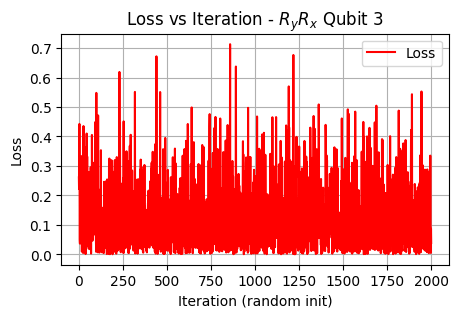

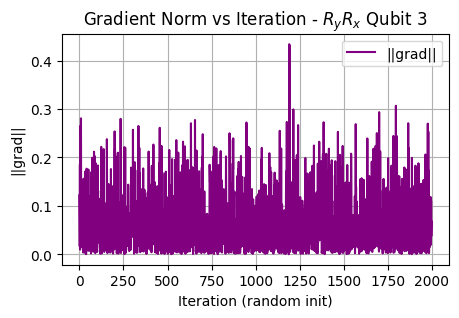

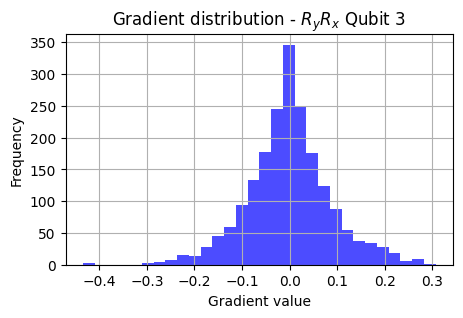


--- Qubit 4 ---
Qubit 4 | mean_grad=3.154407e-02, var_grad=2.066850e-03


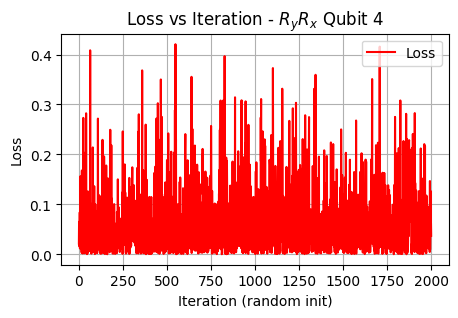

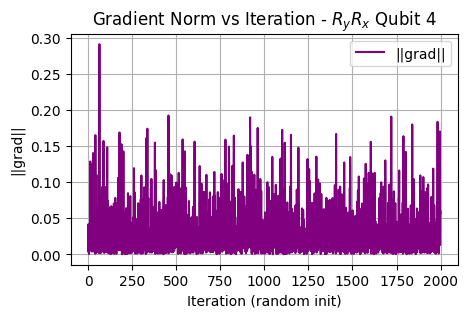

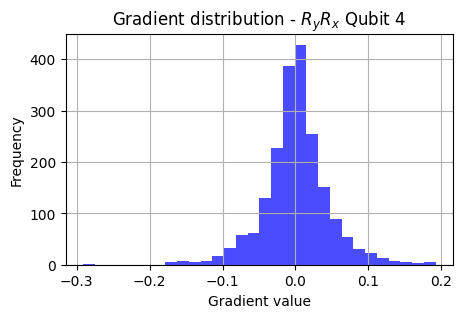


--- Qubit 5 ---
Qubit 5 | mean_grad=1.567418e-02, var_grad=6.090926e-04


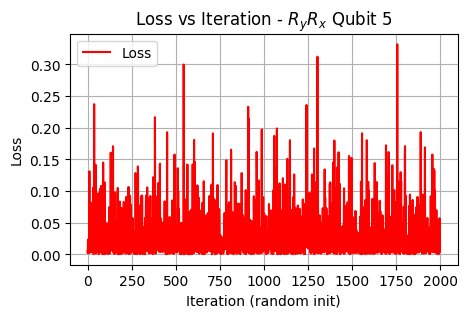

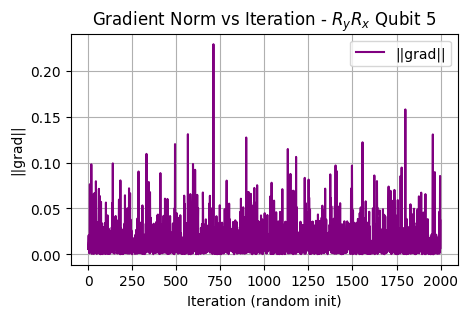

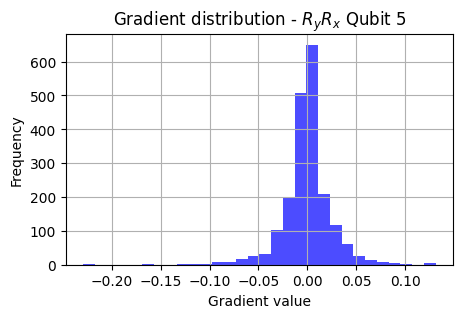


--- Qubit 6 ---
Qubit 6 | mean_grad=7.482818e-03, var_grad=1.582311e-04


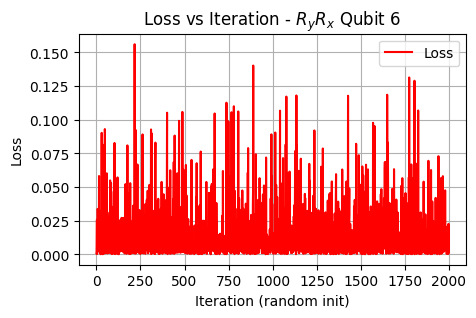

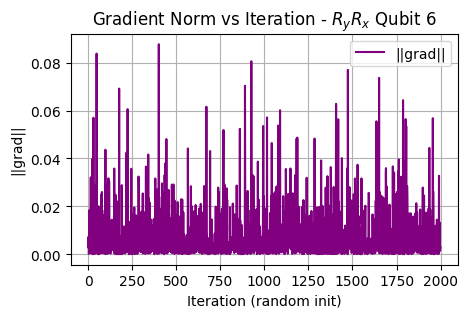

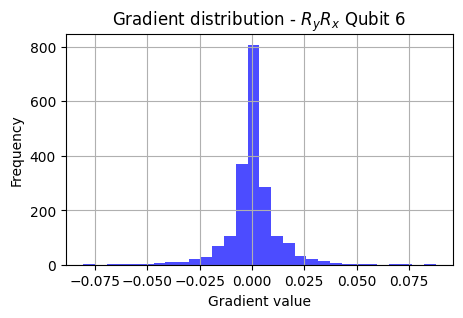


--- Qubit 7 ---
Qubit 7 | mean_grad=3.909399e-03, var_grad=4.786801e-05


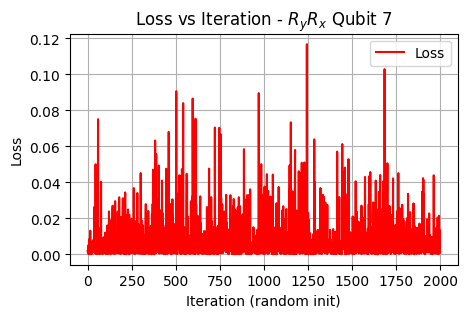

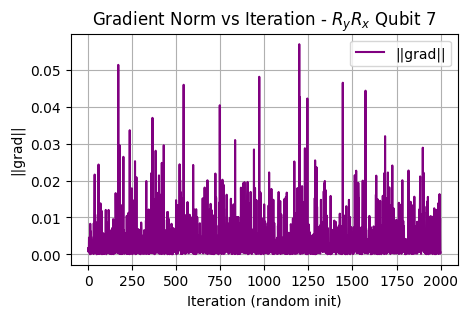

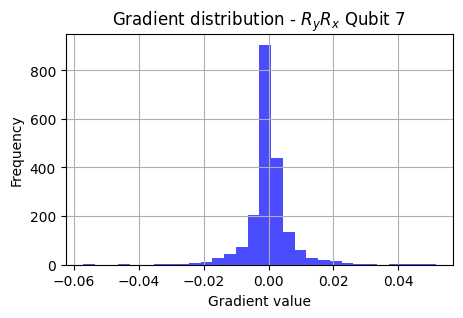


--- Qubit 8 ---
Qubit 8 | mean_grad=2.092717e-03, var_grad=1.585980e-05


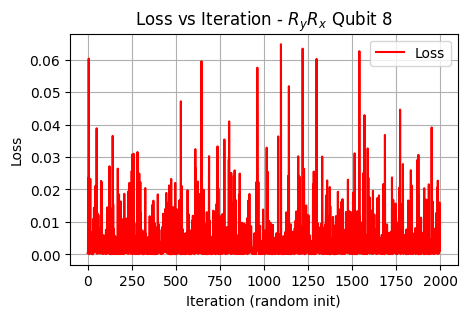

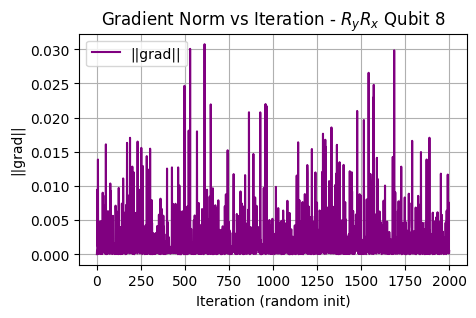

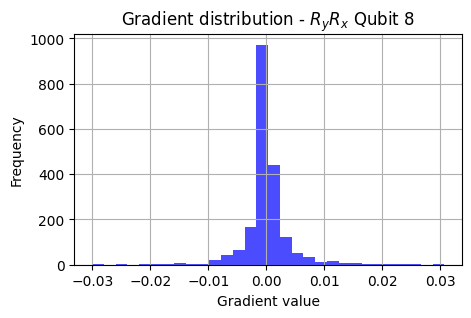


 Mean Gradient vs. Qubits

['2.457020e-01', '1.312758e-01', '6.479388e-02', '3.154407e-02', '1.567418e-02', '7.482818e-03', '3.909399e-03', '2.092717e-03']

Variance Gradient vs. Qubits

['8.084982e-02', '2.671402e-02', '7.764226e-03', '2.066850e-03', '6.090926e-04', '1.582311e-04', '4.786801e-05', '1.585980e-05']
Time taken for $R_y R_x$: 130.09 seconds


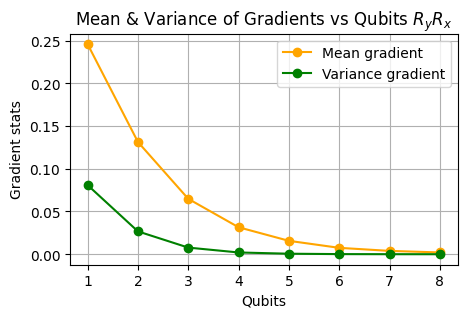


=== Barren Plateau Analysis for Ansatz $R_y R_z$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=2.536133e-01, var_grad=8.601753e-02


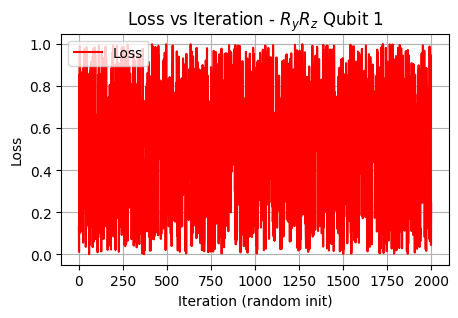

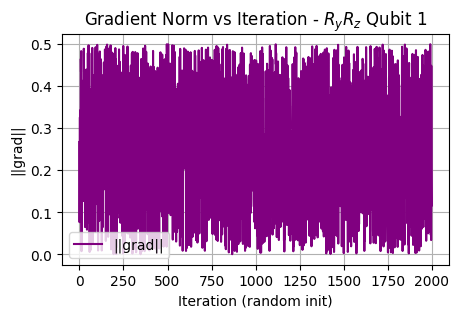

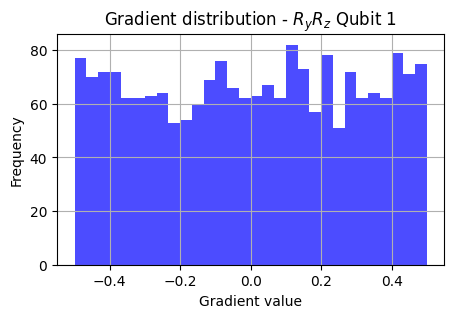


--- Qubit 2 ---
Qubit 2 | mean_grad=1.276348e-01, var_grad=2.638829e-02


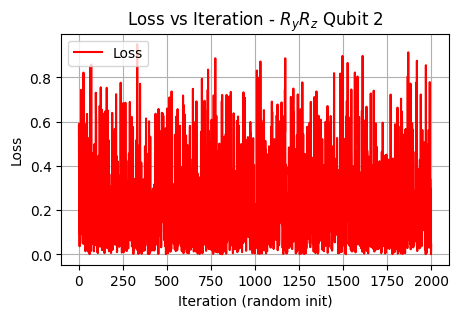

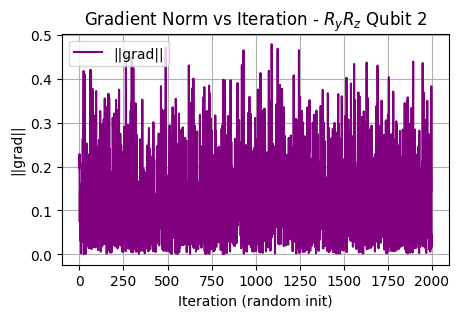

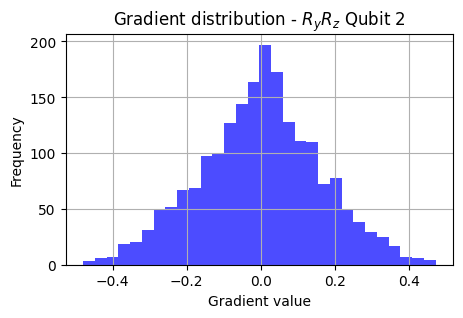


--- Qubit 3 ---
Qubit 3 | mean_grad=6.419181e-02, var_grad=7.700335e-03


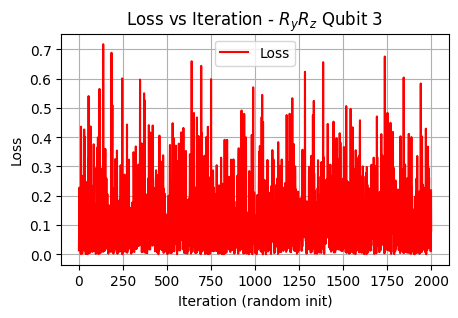

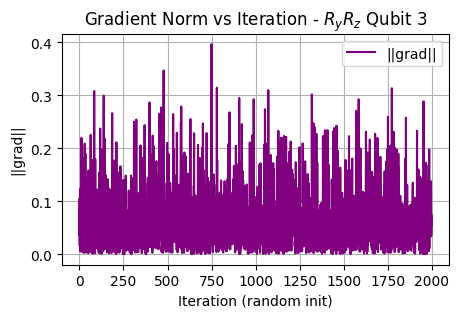

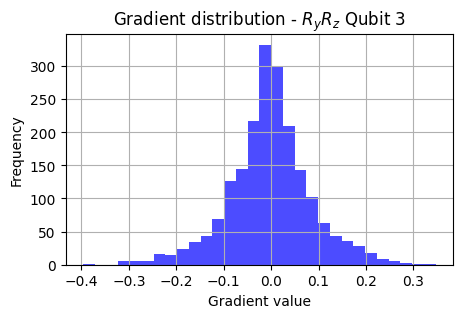


--- Qubit 4 ---
Qubit 4 | mean_grad=3.249928e-02, var_grad=2.312958e-03


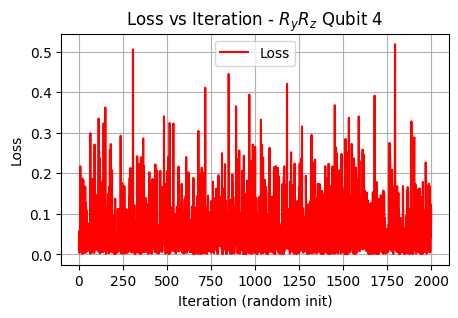

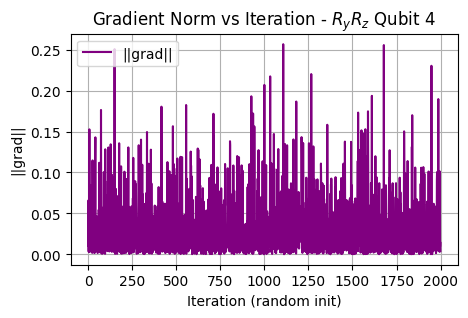

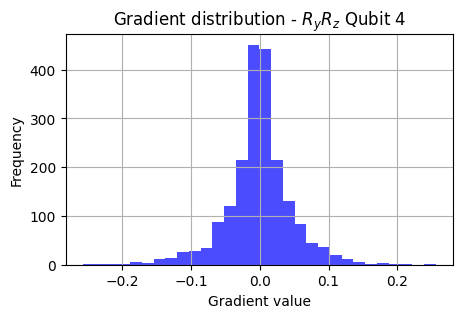


--- Qubit 5 ---
Qubit 5 | mean_grad=1.601993e-02, var_grad=6.236444e-04


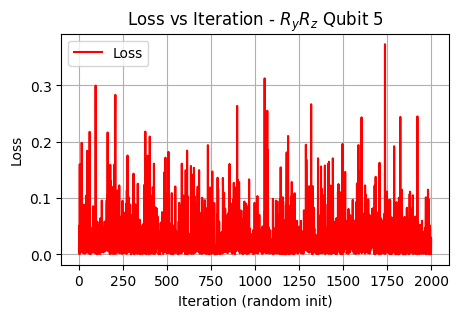

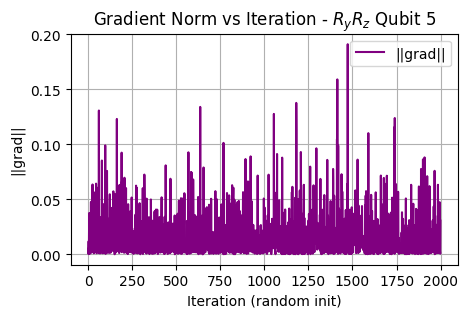

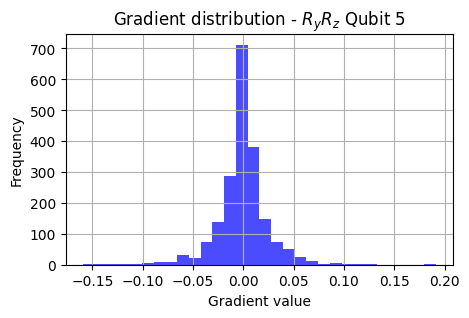


--- Qubit 6 ---
Qubit 6 | mean_grad=8.269000e-03, var_grad=1.897253e-04


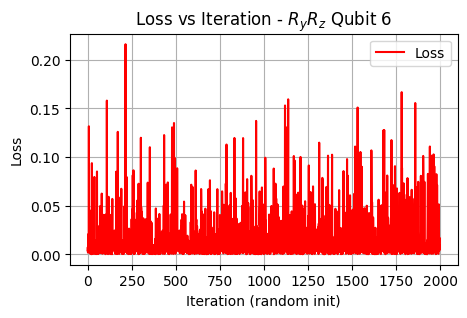

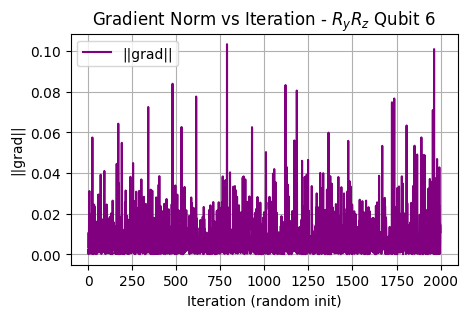

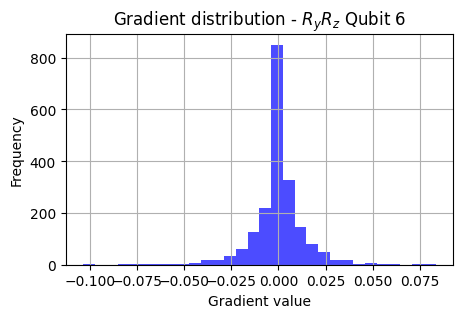


--- Qubit 7 ---
Qubit 7 | mean_grad=3.899657e-03, var_grad=5.506107e-05


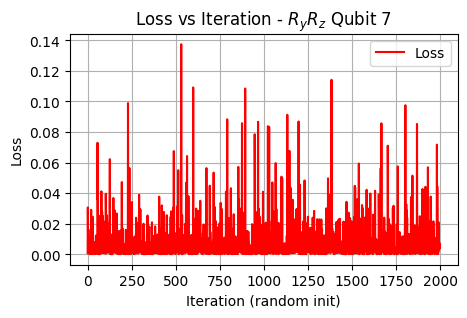

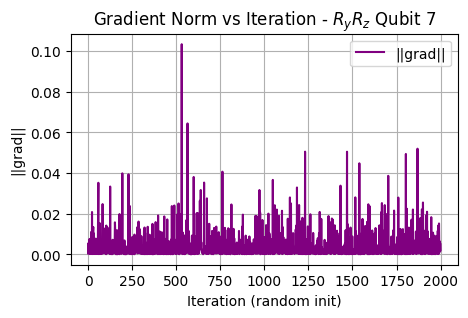

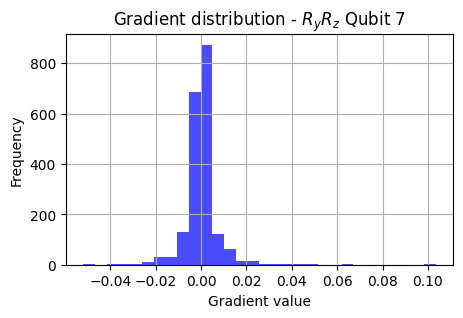


--- Qubit 8 ---
Qubit 8 | mean_grad=2.091742e-03, var_grad=1.612815e-05


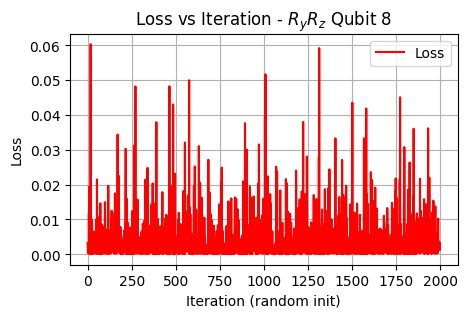

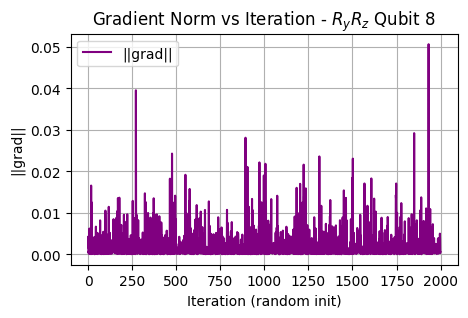

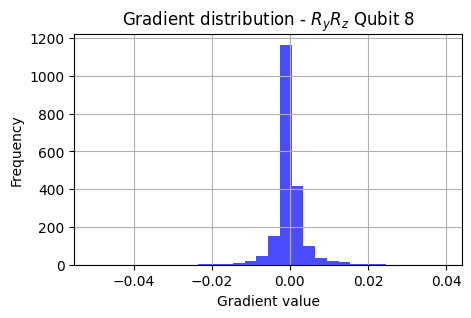


 Mean Gradient vs. Qubits

['2.536133e-01', '1.276348e-01', '6.419181e-02', '3.249928e-02', '1.601993e-02', '8.269000e-03', '3.899657e-03', '2.091742e-03']

Variance Gradient vs. Qubits

['8.601753e-02', '2.638829e-02', '7.700335e-03', '2.312958e-03', '6.236444e-04', '1.897253e-04', '5.506107e-05', '1.612815e-05']
Time taken for $R_y R_z$: 123.97 seconds


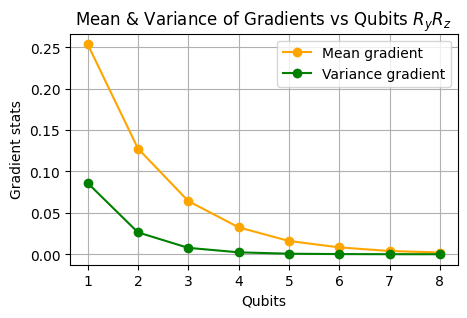


=== Barren Plateau Analysis for Ansatz $H R_y$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=3.193163e-01, var_grad=1.256968e-01


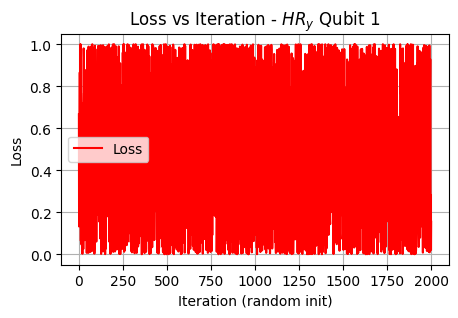

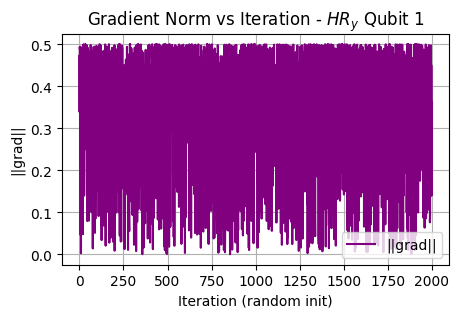

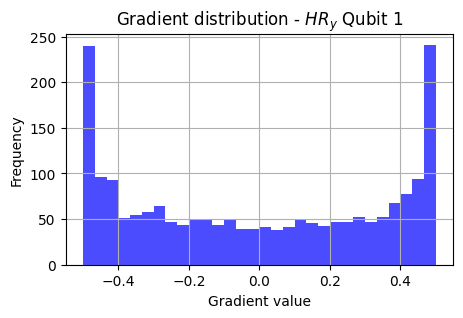


--- Qubit 2 ---
Qubit 2 | mean_grad=1.619883e-01, var_grad=4.296281e-02


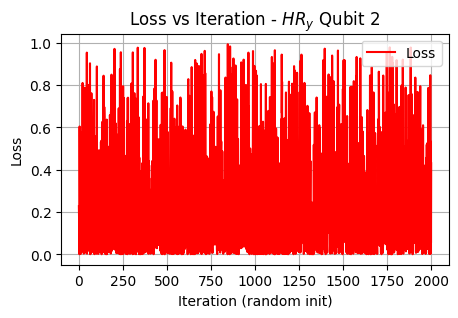

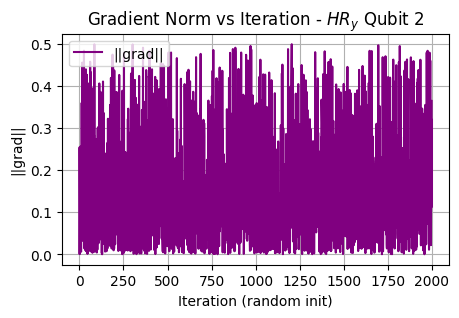

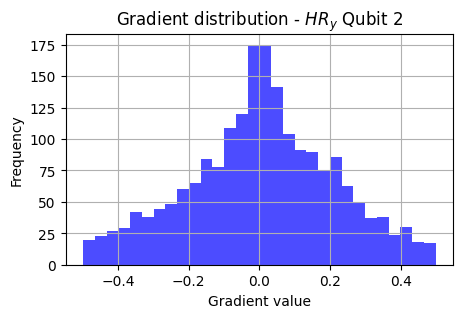


--- Qubit 3 ---
Qubit 3 | mean_grad=8.184213e-02, var_grad=1.399198e-02


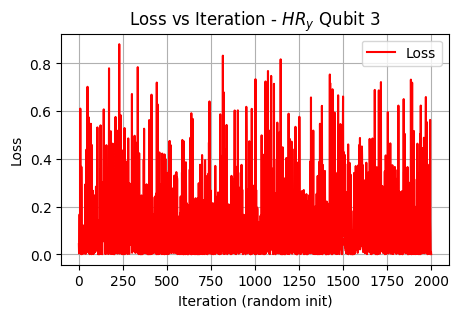

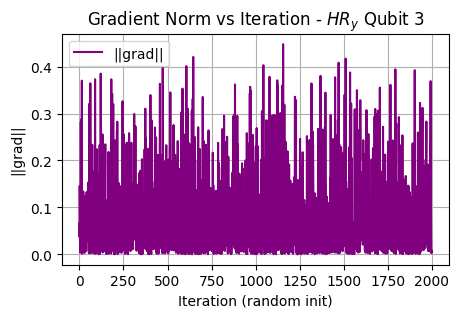

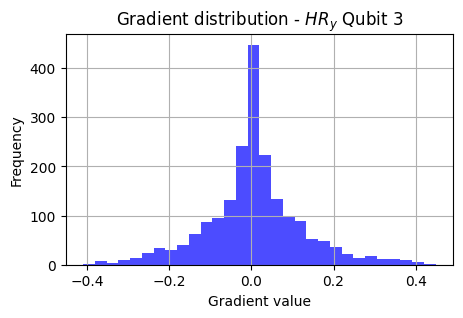


--- Qubit 4 ---
Qubit 4 | mean_grad=4.028068e-02, var_grad=4.598786e-03


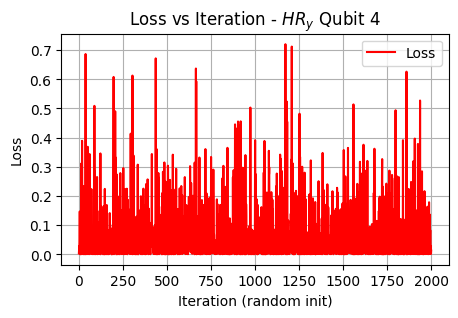

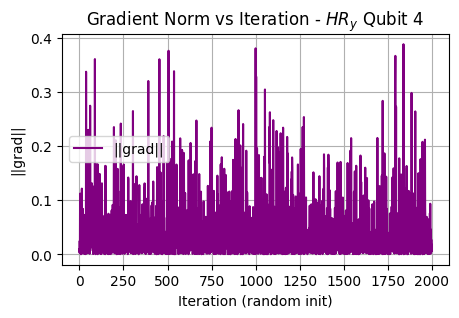

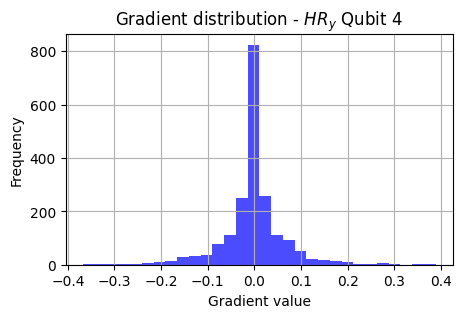


--- Qubit 5 ---
Qubit 5 | mean_grad=1.930256e-02, var_grad=1.327834e-03


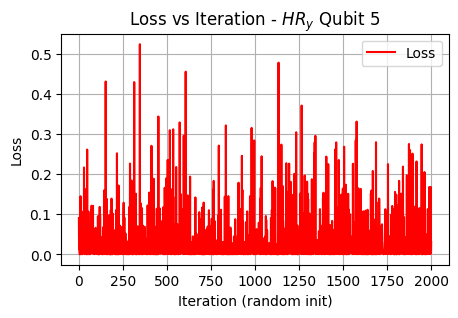

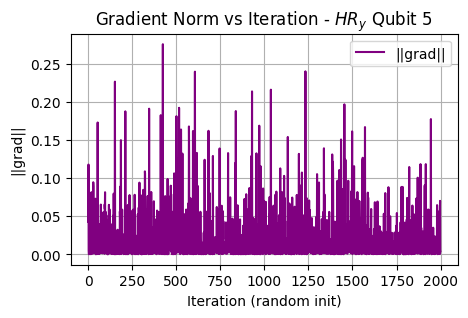

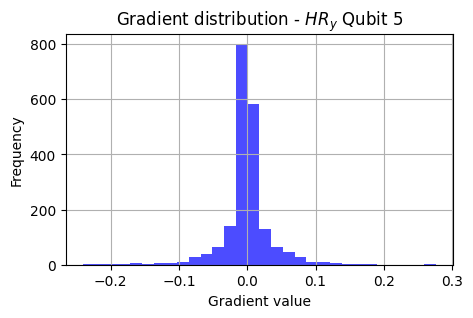


--- Qubit 6 ---
Qubit 6 | mean_grad=1.040562e-02, var_grad=4.742437e-04


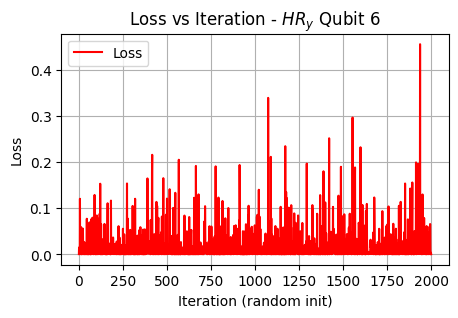

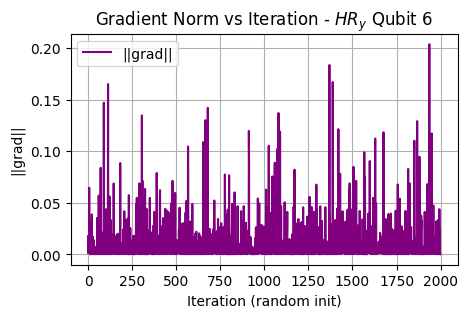

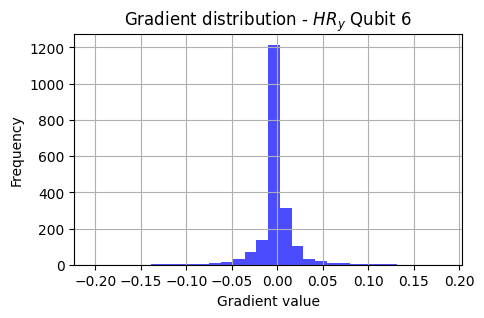


--- Qubit 7 ---
Qubit 7 | mean_grad=5.049082e-03, var_grad=1.194334e-04


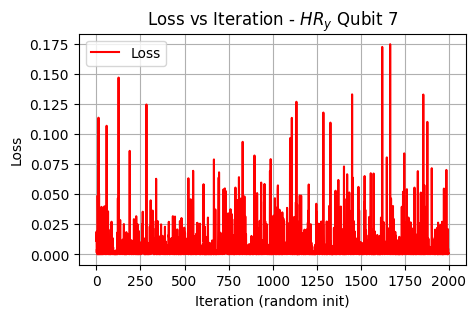

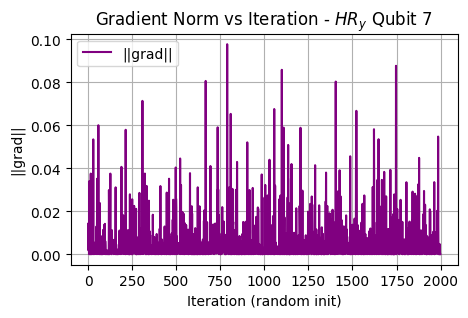

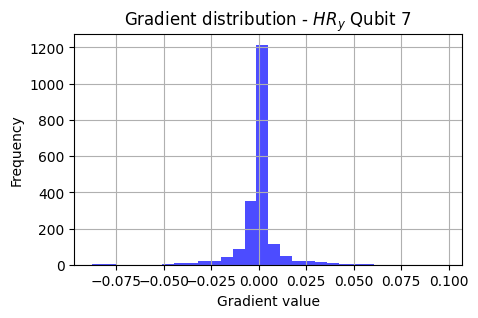


--- Qubit 8 ---
Qubit 8 | mean_grad=2.290577e-03, var_grad=3.420636e-05


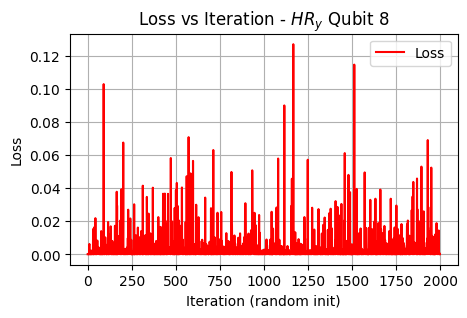

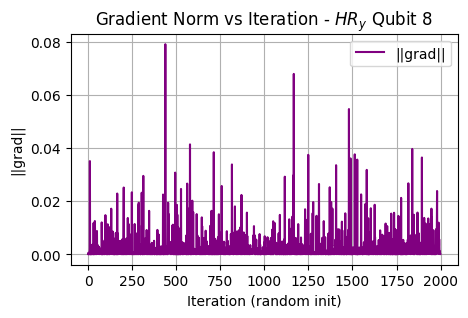

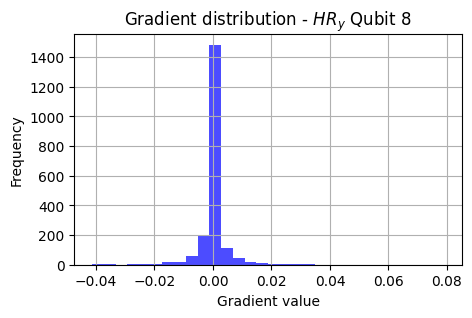


 Mean Gradient vs. Qubits

['3.193163e-01', '1.619883e-01', '8.184213e-02', '4.028068e-02', '1.930256e-02', '1.040562e-02', '5.049082e-03', '2.290577e-03']

Variance Gradient vs. Qubits

['1.256968e-01', '4.296281e-02', '1.399198e-02', '4.598786e-03', '1.327834e-03', '4.742437e-04', '1.194334e-04', '3.420636e-05']
Time taken for $H R_y$: 100.36 seconds


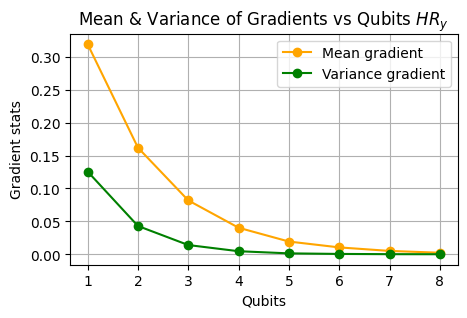


=== Barren Plateau Analysis for Ansatz $S R_y$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=2.689014e-01, var_grad=9.386937e-02


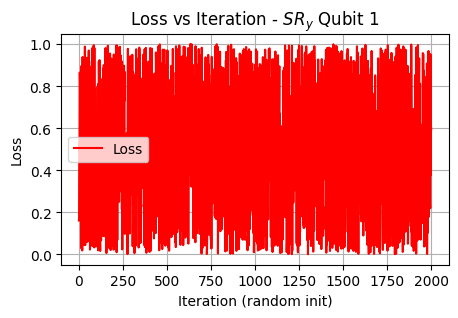

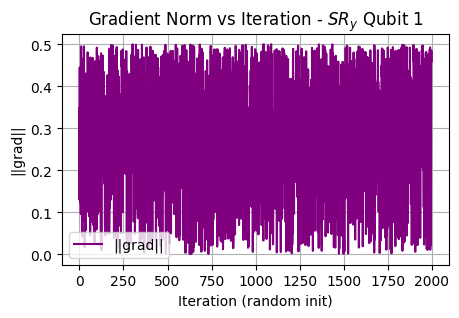

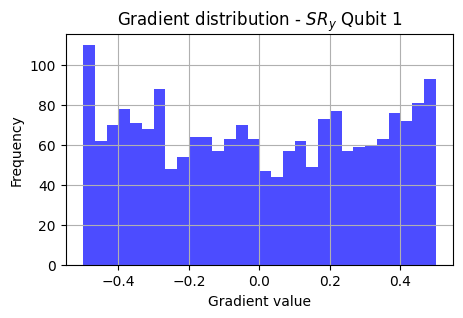


--- Qubit 2 ---
Qubit 2 | mean_grad=1.030556e-01, var_grad=1.819391e-02


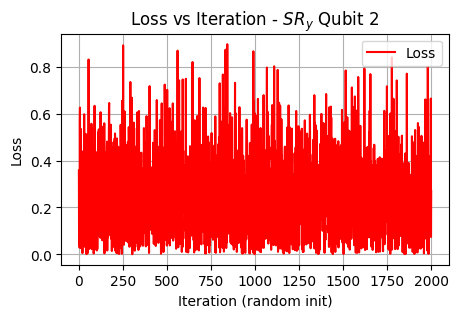

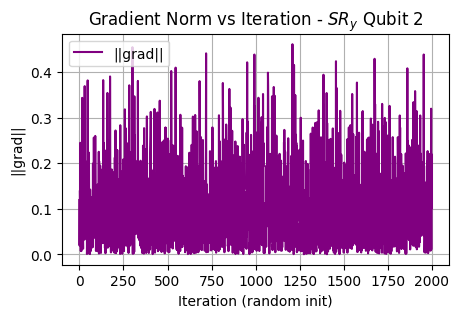

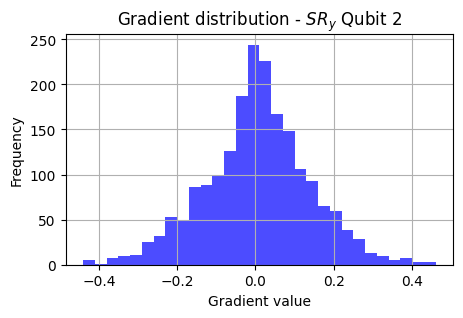


--- Qubit 3 ---
Qubit 3 | mean_grad=6.031643e-02, var_grad=6.497827e-03


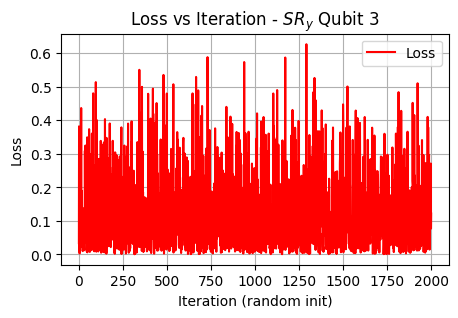

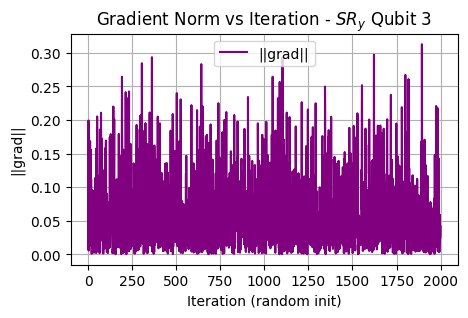

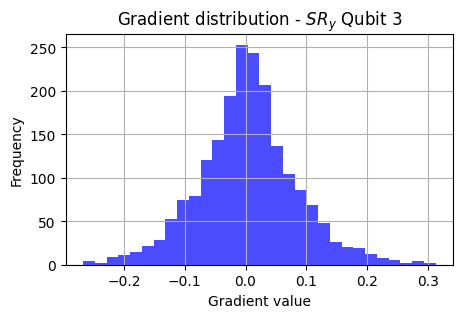


--- Qubit 4 ---
Qubit 4 | mean_grad=3.226981e-02, var_grad=2.059979e-03


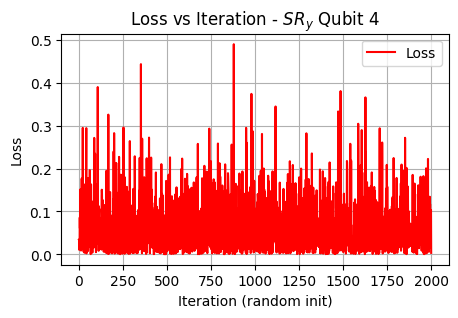

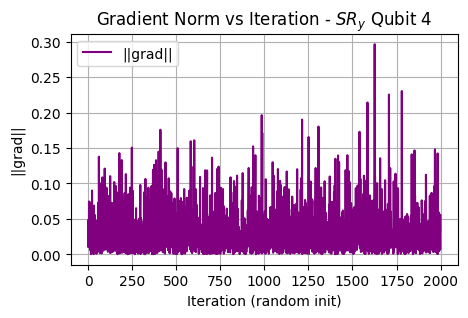

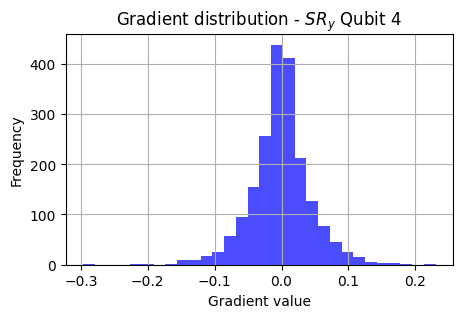


--- Qubit 5 ---
Qubit 5 | mean_grad=1.550872e-02, var_grad=5.448060e-04


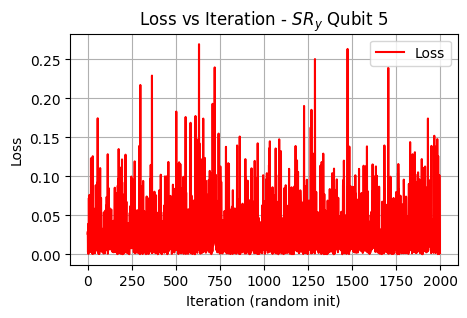

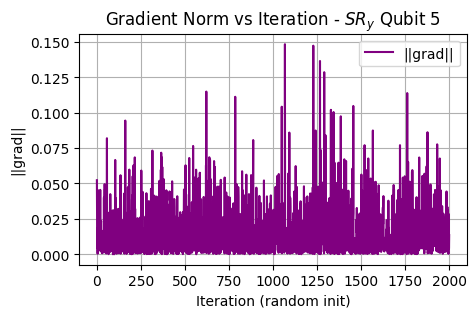

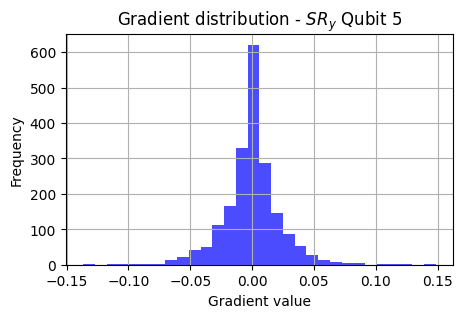


--- Qubit 6 ---
Qubit 6 | mean_grad=8.018992e-03, var_grad=1.602329e-04


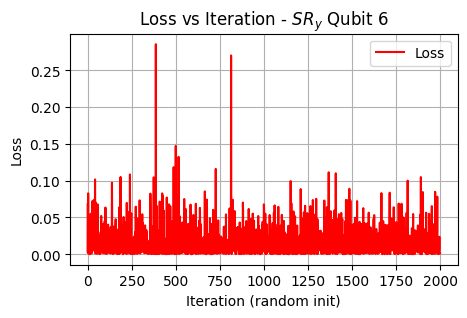

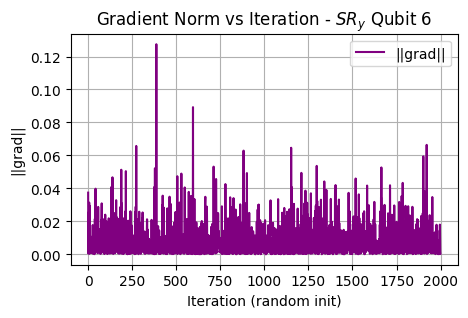

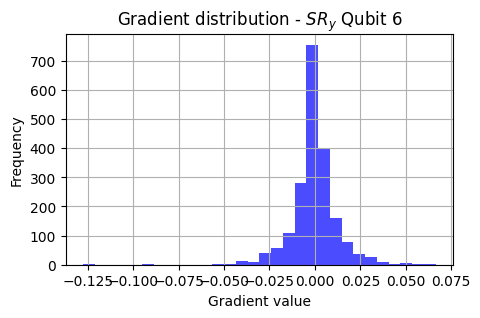


--- Qubit 7 ---
Qubit 7 | mean_grad=3.863688e-03, var_grad=4.098617e-05


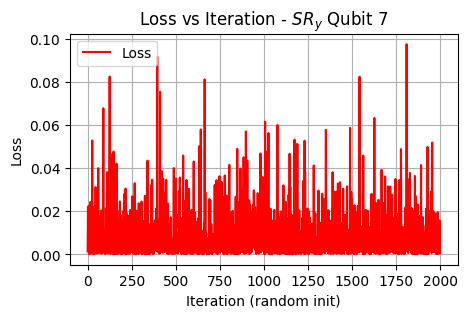

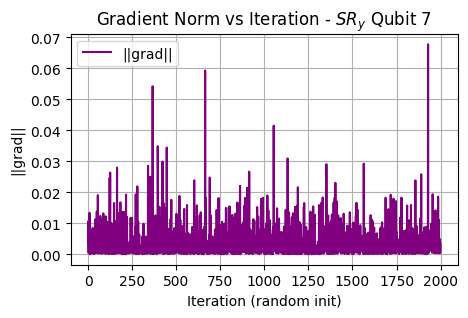

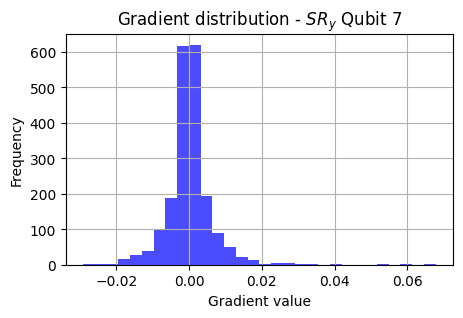


--- Qubit 8 ---
Qubit 8 | mean_grad=1.795739e-03, var_grad=9.867788e-06


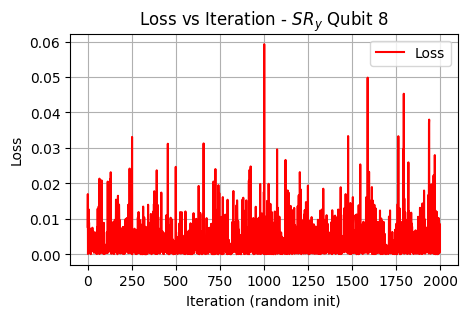

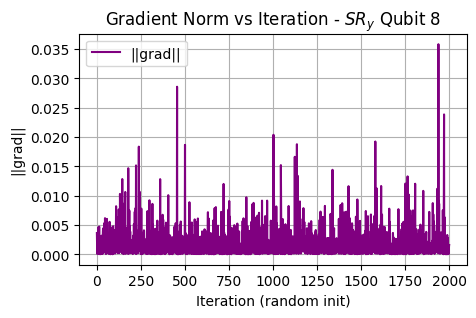

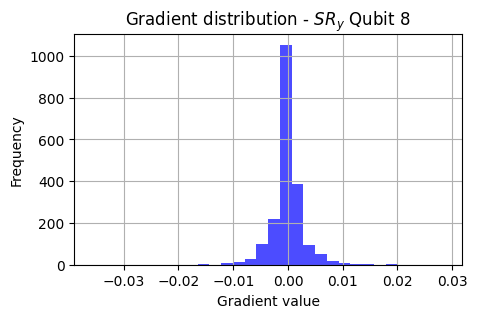


 Mean Gradient vs. Qubits

['2.689014e-01', '1.030556e-01', '6.031643e-02', '3.226981e-02', '1.550872e-02', '8.018992e-03', '3.863688e-03', '1.795739e-03']

Variance Gradient vs. Qubits

['9.386937e-02', '1.819391e-02', '6.497827e-03', '2.059979e-03', '5.448060e-04', '1.602329e-04', '4.098617e-05', '9.867788e-06']
Time taken for $S R_y$: 107.42 seconds


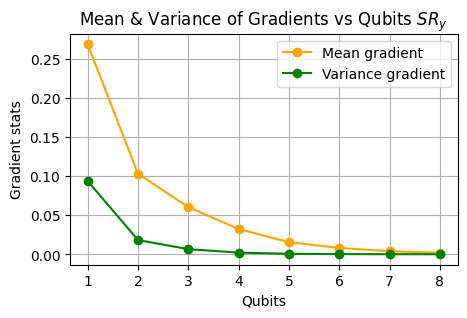


=== Barren Plateau Analysis for Ansatz $T R_y$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=2.568534e-01, var_grad=8.716728e-02


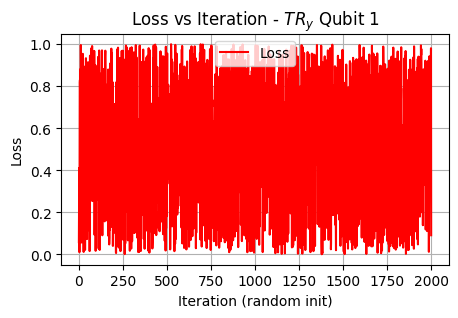

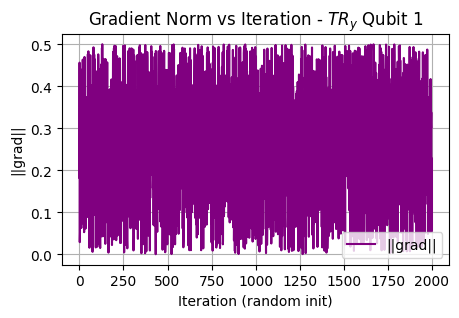

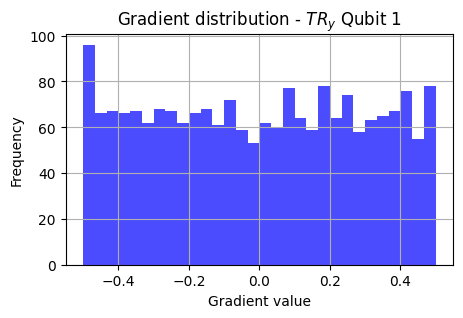


--- Qubit 2 ---
Qubit 2 | mean_grad=1.296671e-01, var_grad=2.645508e-02


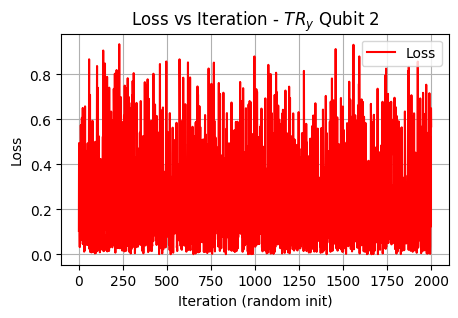

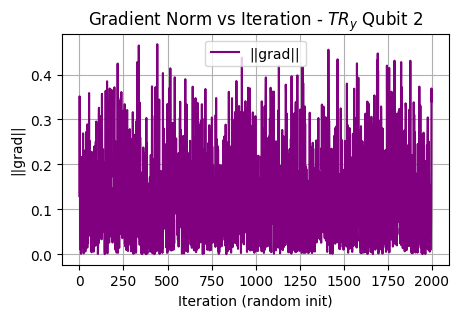

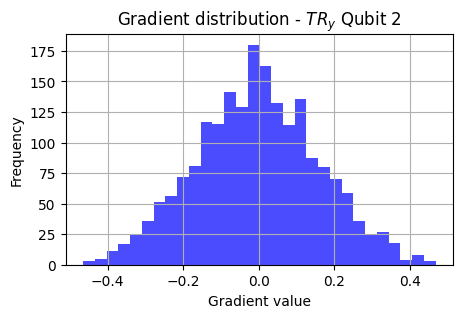


--- Qubit 3 ---
Qubit 3 | mean_grad=6.410904e-02, var_grad=7.727249e-03


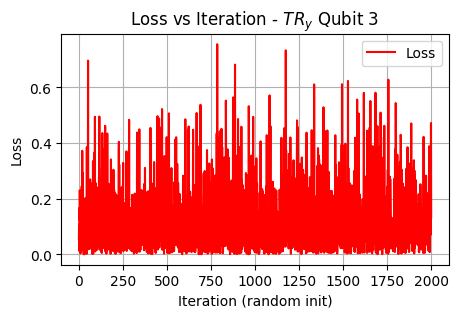

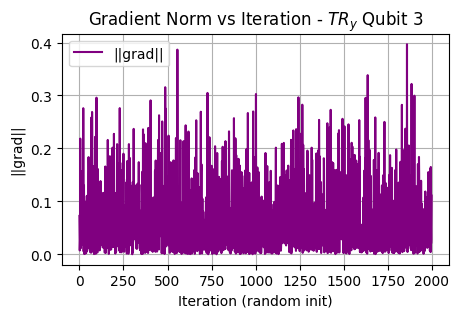

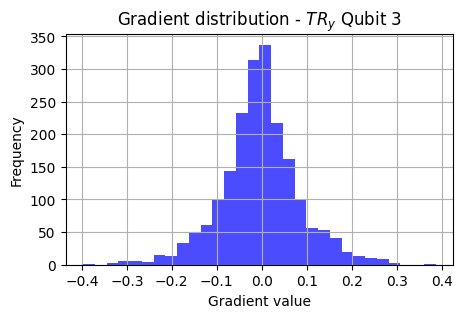


--- Qubit 4 ---
Qubit 4 | mean_grad=3.200428e-02, var_grad=2.243732e-03


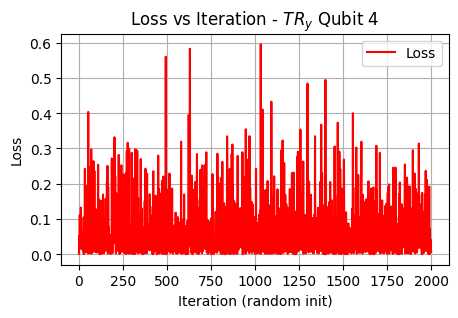

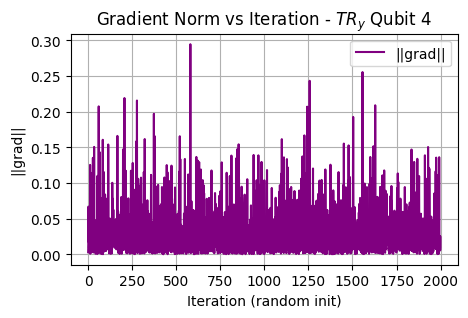

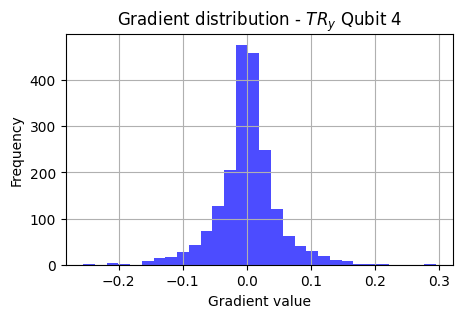


--- Qubit 5 ---
Qubit 5 | mean_grad=1.639663e-02, var_grad=7.108609e-04


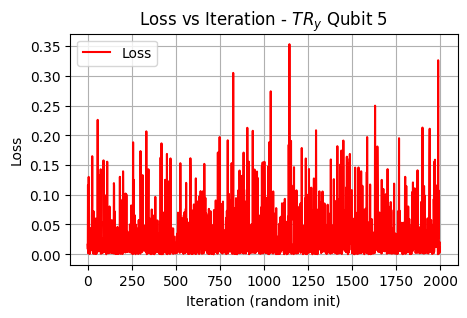

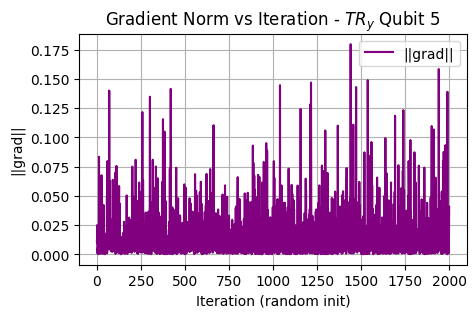

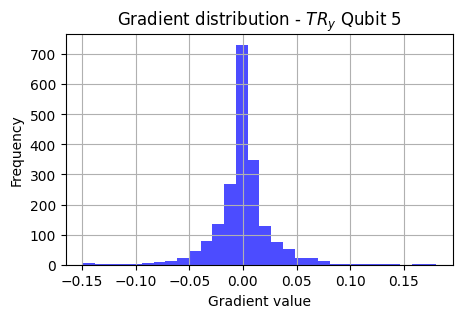


--- Qubit 6 ---
Qubit 6 | mean_grad=8.250605e-03, var_grad=2.130087e-04


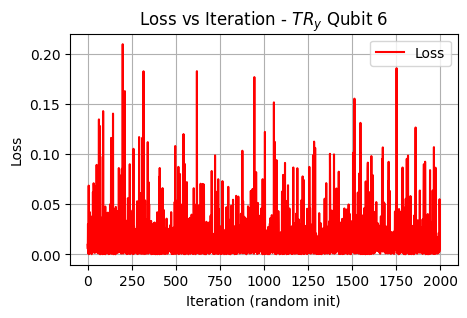

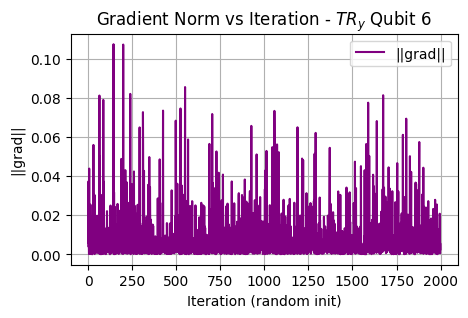

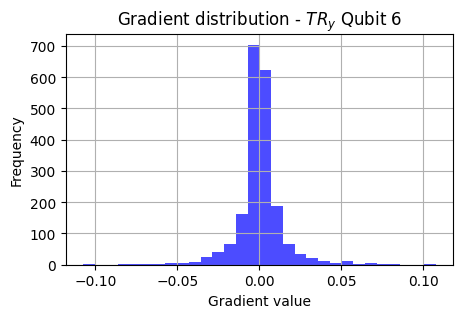


--- Qubit 7 ---
Qubit 7 | mean_grad=3.839491e-03, var_grad=5.186318e-05


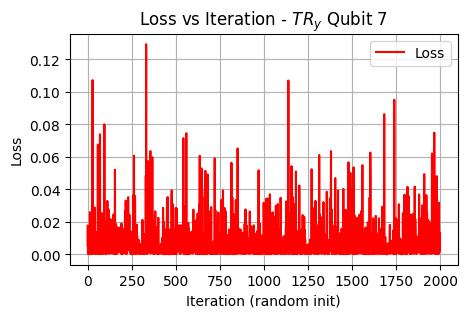

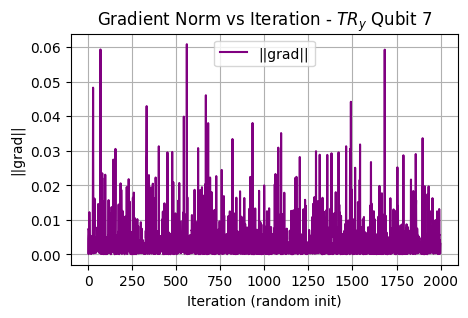

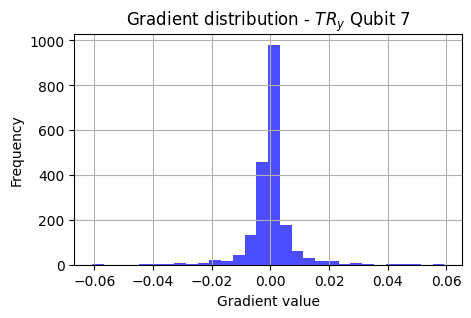


--- Qubit 8 ---
Qubit 8 | mean_grad=2.152224e-03, var_grad=1.947872e-05


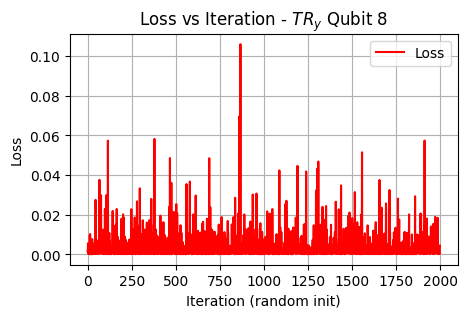

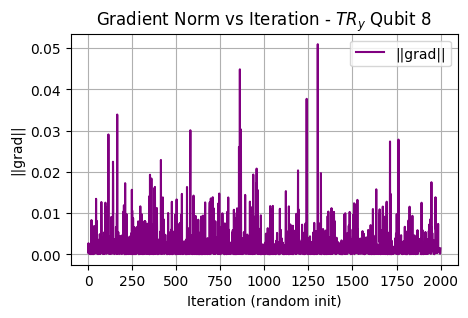

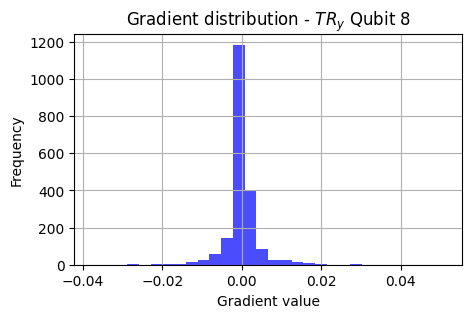


 Mean Gradient vs. Qubits

['2.568534e-01', '1.296671e-01', '6.410904e-02', '3.200428e-02', '1.639663e-02', '8.250605e-03', '3.839491e-03', '2.152224e-03']

Variance Gradient vs. Qubits

['8.716728e-02', '2.645508e-02', '7.727249e-03', '2.243732e-03', '7.108609e-04', '2.130087e-04', '5.186318e-05', '1.947872e-05']
Time taken for $T R_y$: 106.10 seconds


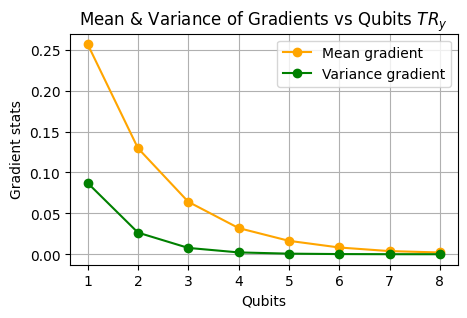


=== Barren Plateau Analysis for Ansatz $X R_y$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=3.143717e-01, var_grad=1.221753e-01


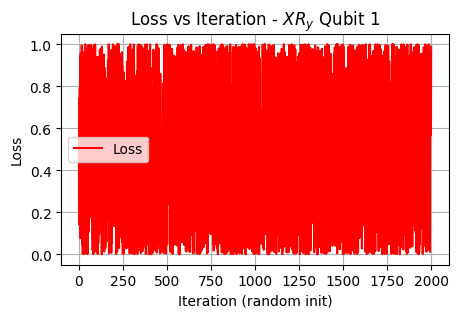

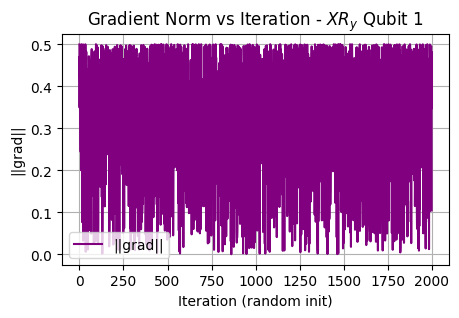

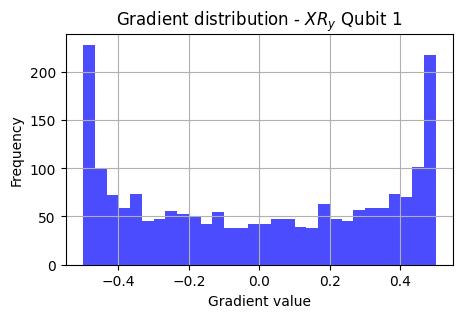


--- Qubit 2 ---
Qubit 2 | mean_grad=1.634831e-01, var_grad=4.376487e-02


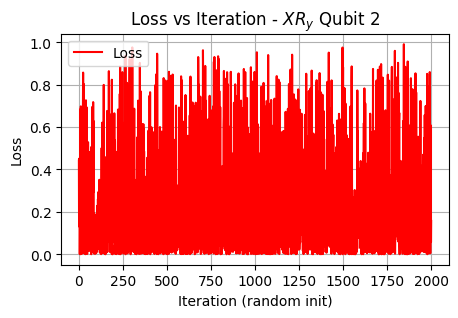

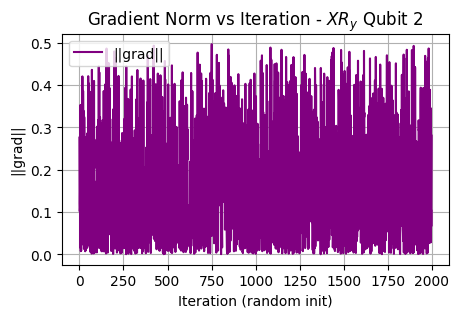

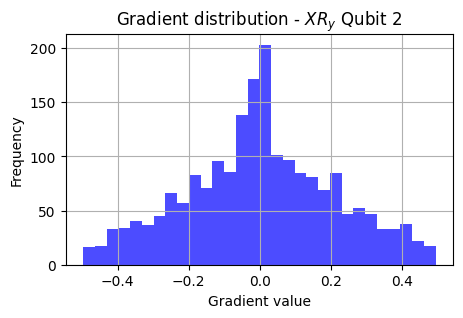


--- Qubit 3 ---
Qubit 3 | mean_grad=7.768802e-02, var_grad=1.331333e-02


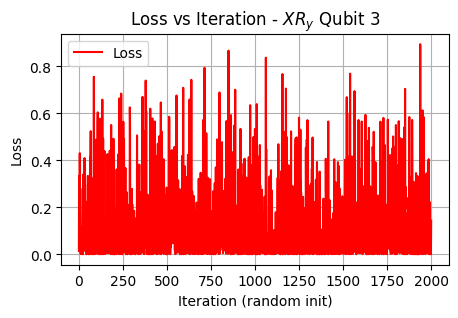

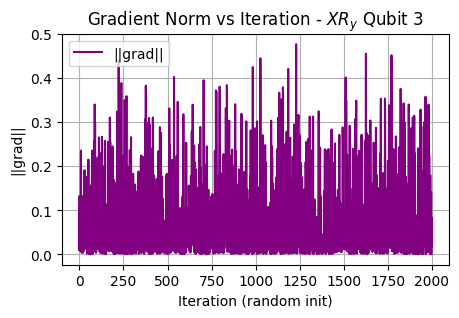

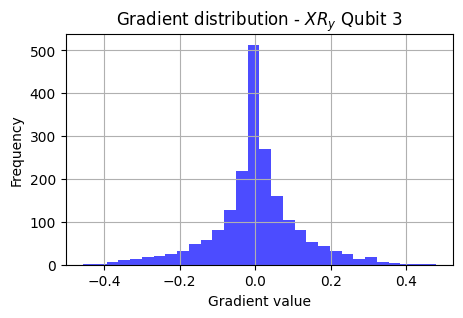


--- Qubit 4 ---
Qubit 4 | mean_grad=3.859386e-02, var_grad=4.025520e-03


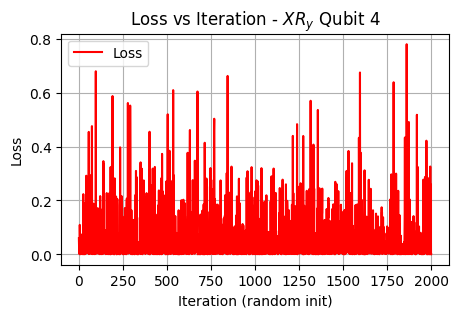

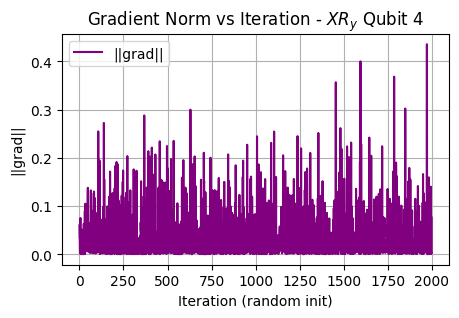

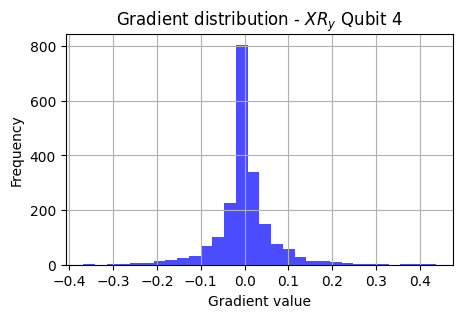


--- Qubit 5 ---
Qubit 5 | mean_grad=2.023026e-02, var_grad=1.394654e-03


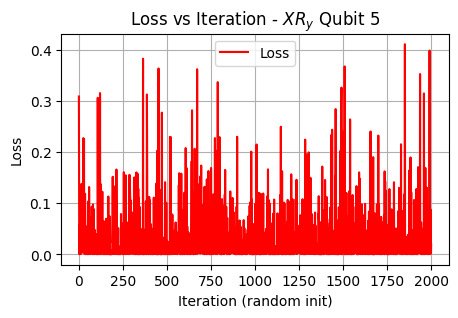

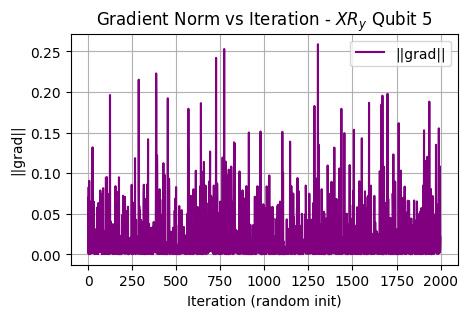

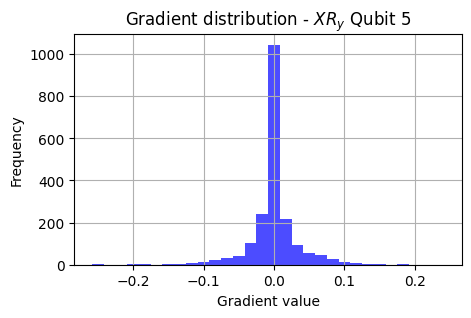


--- Qubit 6 ---
Qubit 6 | mean_grad=9.693256e-03, var_grad=4.232615e-04


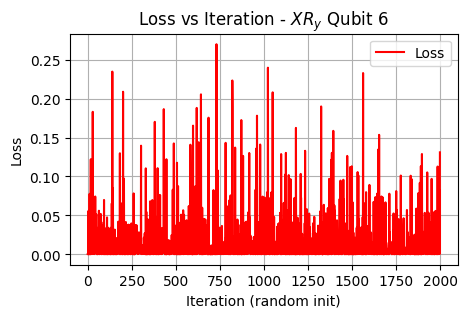

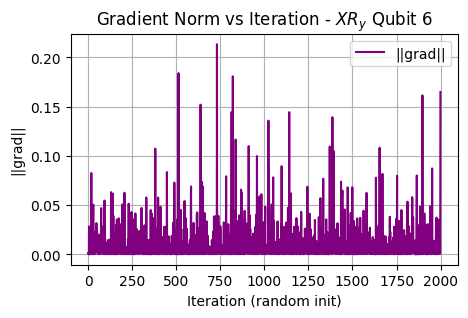

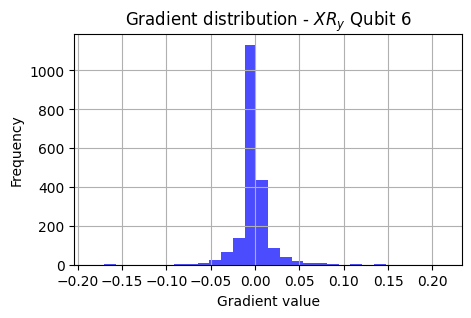


--- Qubit 7 ---
Qubit 7 | mean_grad=4.714031e-03, var_grad=1.242126e-04


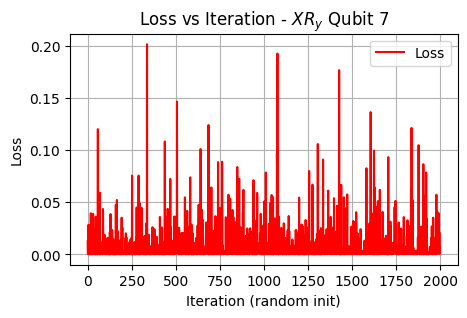

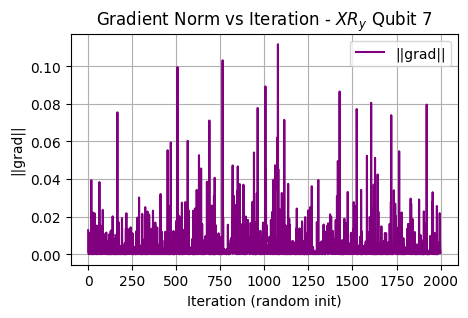

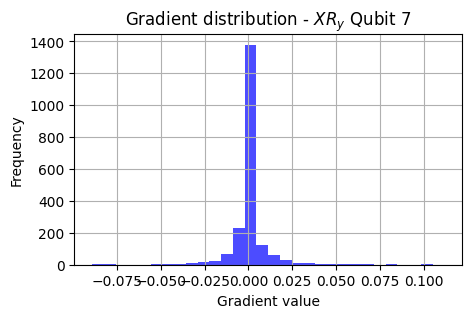


--- Qubit 8 ---
Qubit 8 | mean_grad=2.528475e-03, var_grad=4.839807e-05


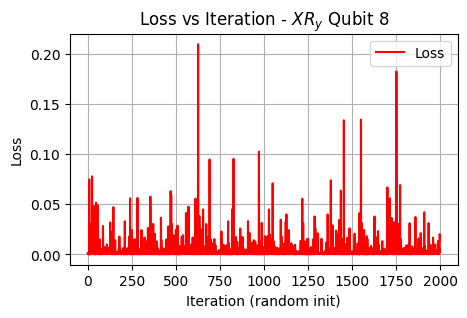

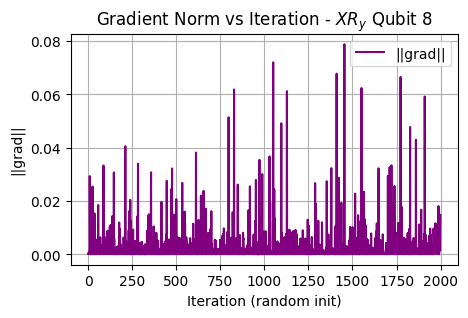

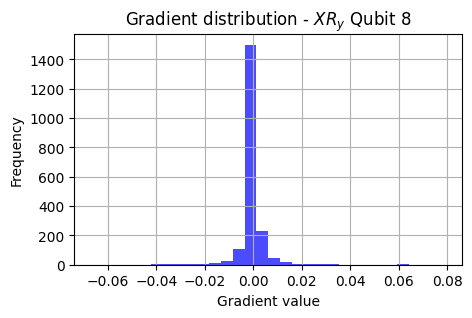


 Mean Gradient vs. Qubits

['3.143717e-01', '1.634831e-01', '7.768802e-02', '3.859386e-02', '2.023026e-02', '9.693256e-03', '4.714031e-03', '2.528475e-03']

Variance Gradient vs. Qubits

['1.221753e-01', '4.376487e-02', '1.331333e-02', '4.025520e-03', '1.394654e-03', '4.232615e-04', '1.242126e-04', '4.839807e-05']
Time taken for $X R_y$: 106.15 seconds


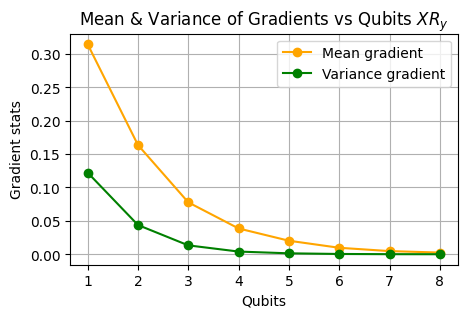


=== Barren Plateau Analysis for Ansatz $Y R_y$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=3.216523e-01, var_grad=1.269839e-01


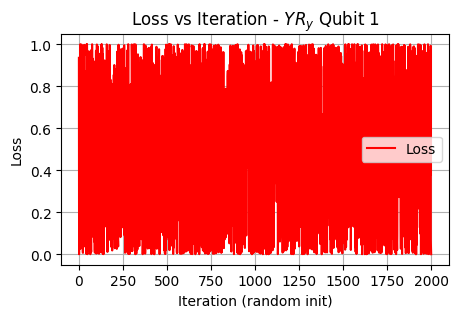

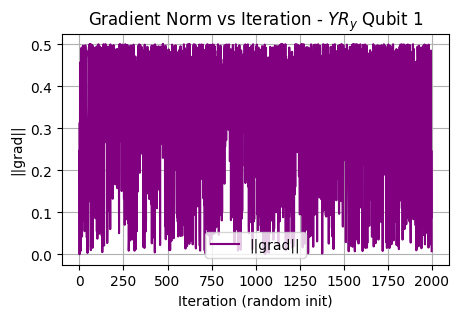

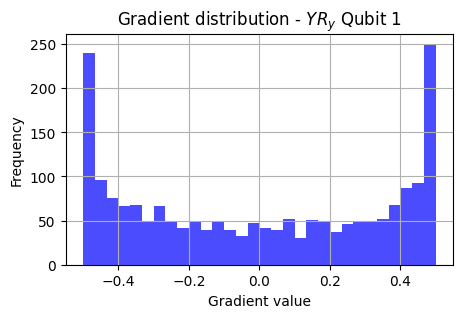


--- Qubit 2 ---
Qubit 2 | mean_grad=1.606809e-01, var_grad=4.277494e-02


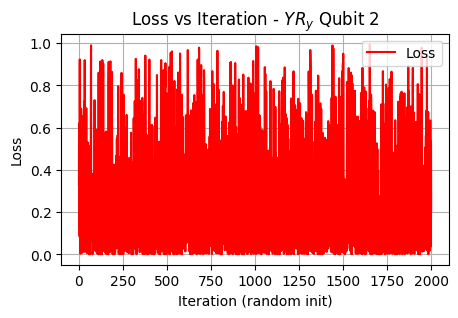

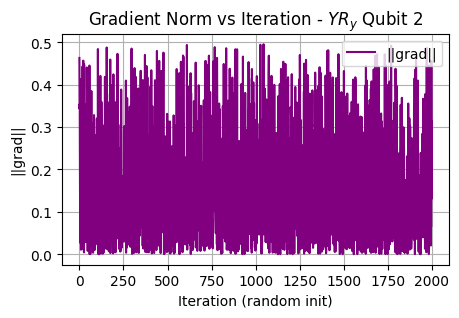

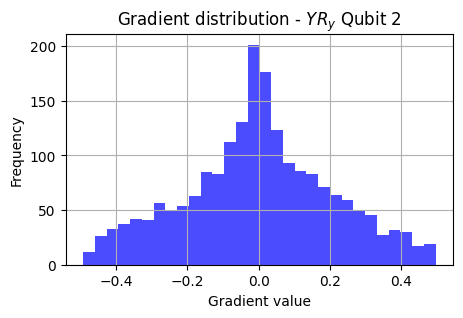


--- Qubit 3 ---
Qubit 3 | mean_grad=8.008391e-02, var_grad=1.362714e-02


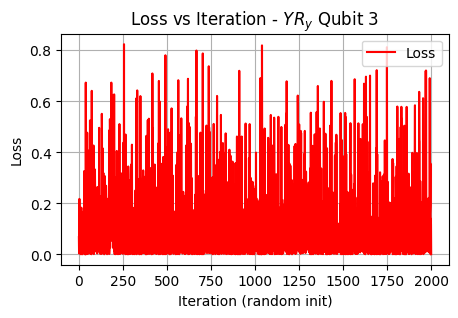

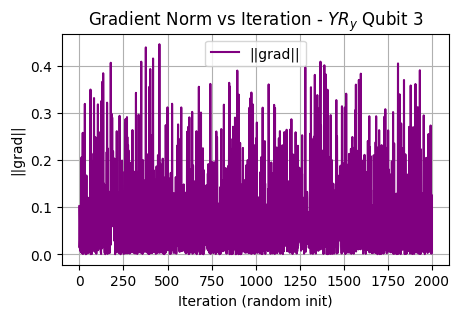

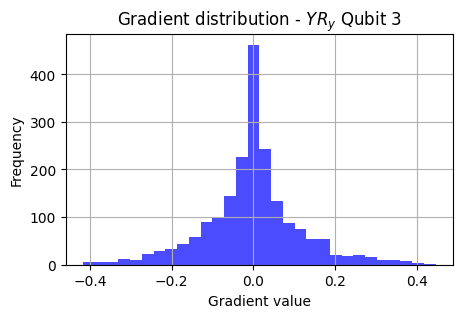


--- Qubit 4 ---
Qubit 4 | mean_grad=3.919282e-02, var_grad=4.146647e-03


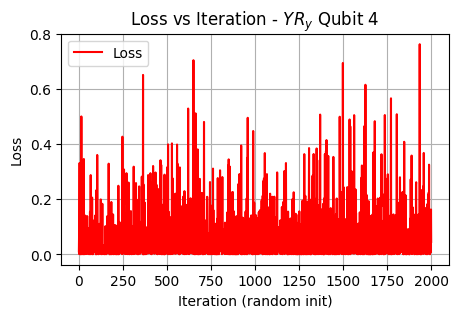

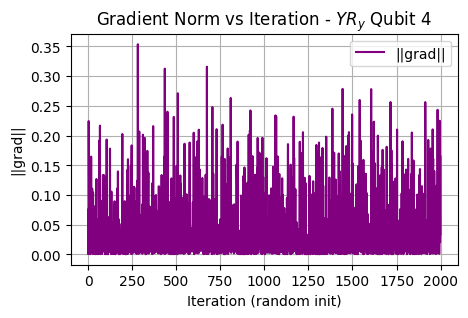

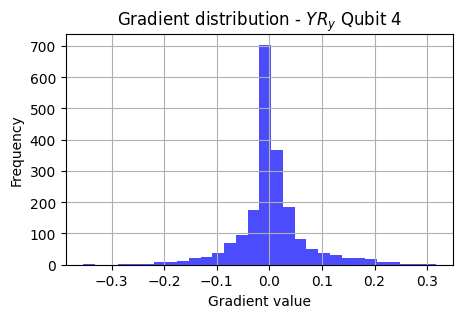


--- Qubit 5 ---
Qubit 5 | mean_grad=2.077660e-02, var_grad=1.490675e-03


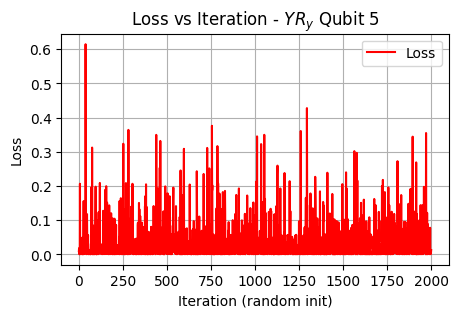

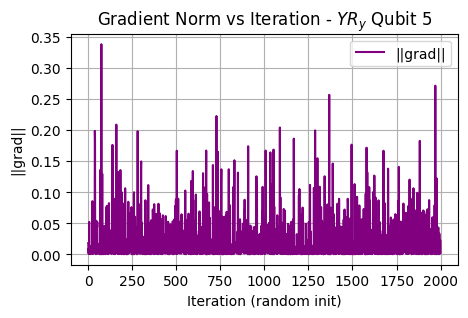

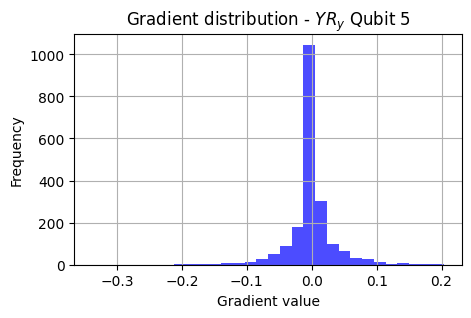


--- Qubit 6 ---
Qubit 6 | mean_grad=9.491063e-03, var_grad=3.696184e-04


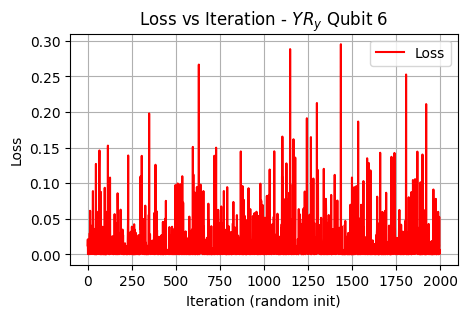

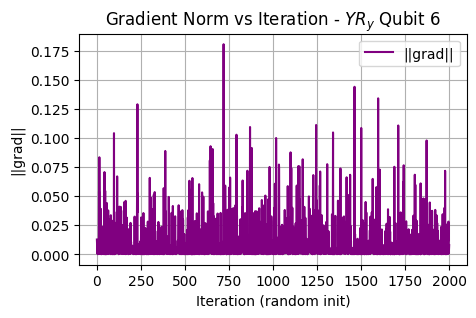

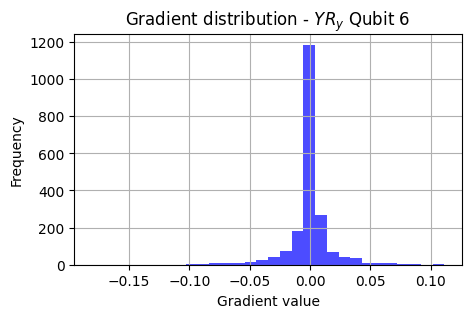


--- Qubit 7 ---
Qubit 7 | mean_grad=5.557829e-03, var_grad=1.725754e-04


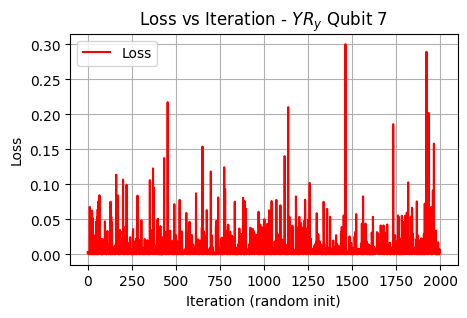

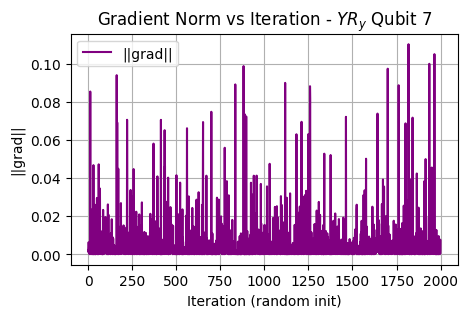

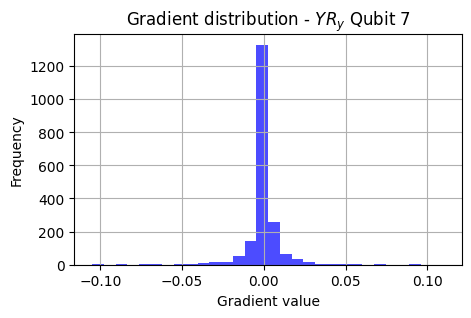


--- Qubit 8 ---
Qubit 8 | mean_grad=2.757318e-03, var_grad=5.420294e-05


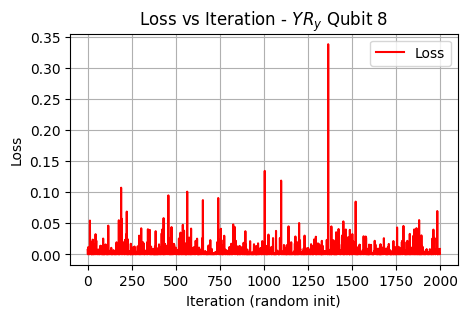

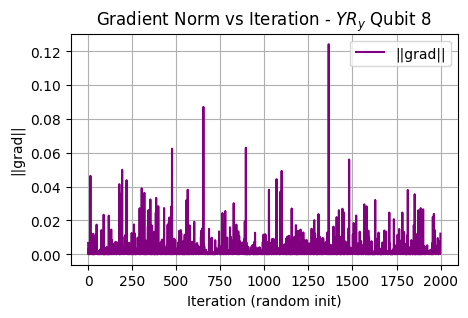

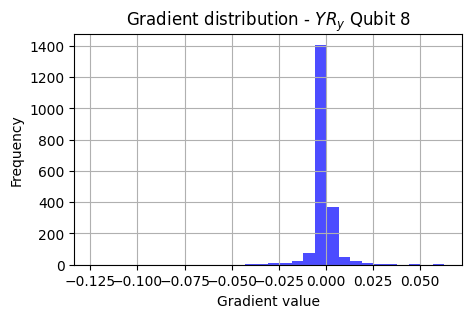


 Mean Gradient vs. Qubits

['3.216523e-01', '1.606809e-01', '8.008391e-02', '3.919282e-02', '2.077660e-02', '9.491063e-03', '5.557829e-03', '2.757318e-03']

Variance Gradient vs. Qubits

['1.269839e-01', '4.277494e-02', '1.362714e-02', '4.146647e-03', '1.490675e-03', '3.696184e-04', '1.725754e-04', '5.420294e-05']
Time taken for $Y R_y$: 126.30 seconds


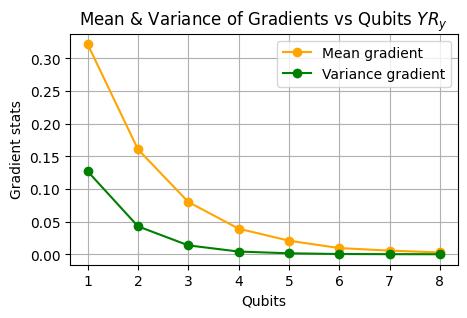


=== Barren Plateau Analysis for Ansatz $Z R_y$ ===

--- Qubit 1 ---
Qubit 1 | mean_grad=3.177082e-01, var_grad=1.252234e-01


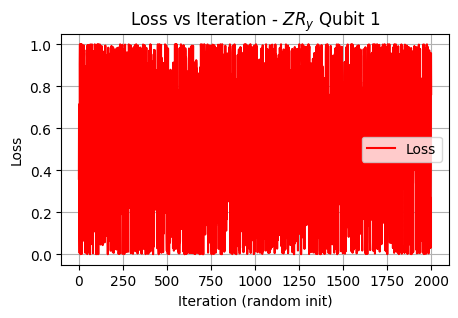

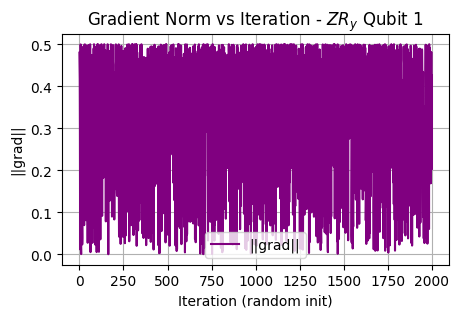

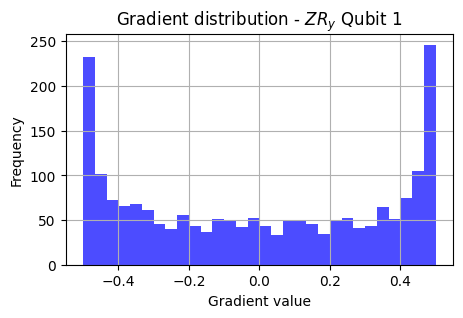


--- Qubit 2 ---
Qubit 2 | mean_grad=1.607707e-01, var_grad=4.309994e-02


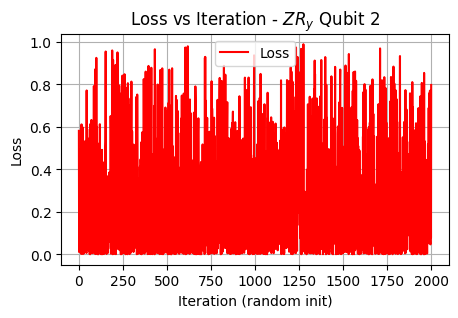

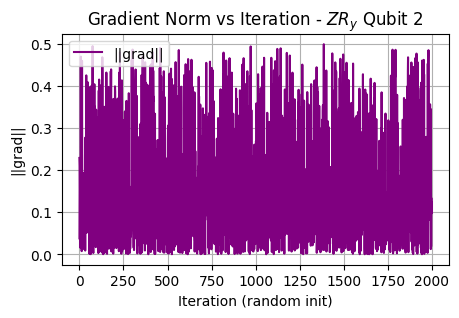

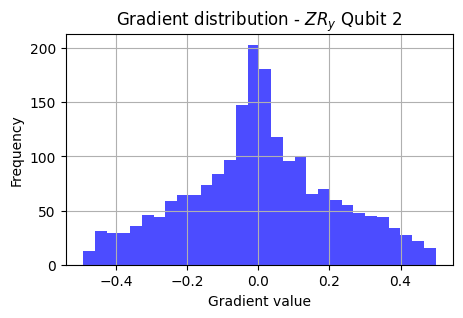


--- Qubit 3 ---
Qubit 3 | mean_grad=7.771165e-02, var_grad=1.294317e-02


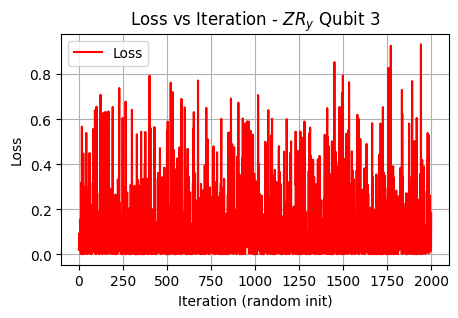

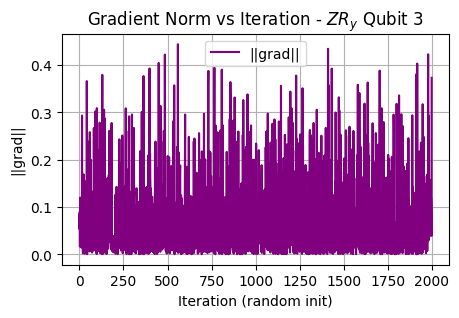

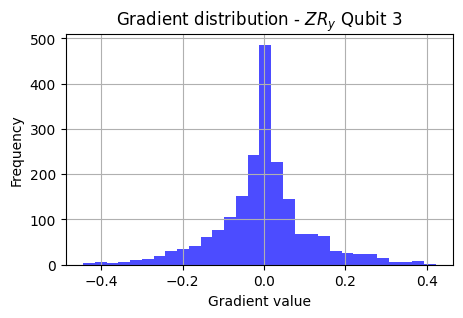


--- Qubit 4 ---
Qubit 4 | mean_grad=3.923710e-02, var_grad=4.134640e-03


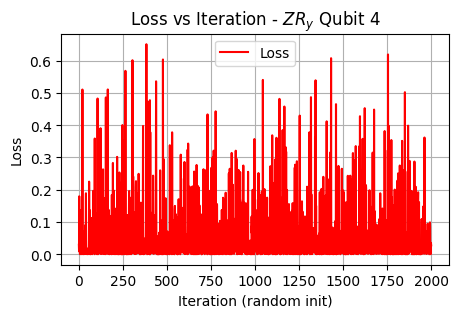

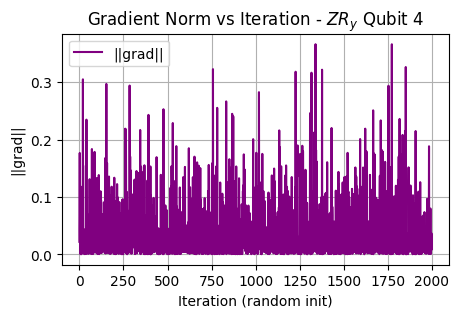

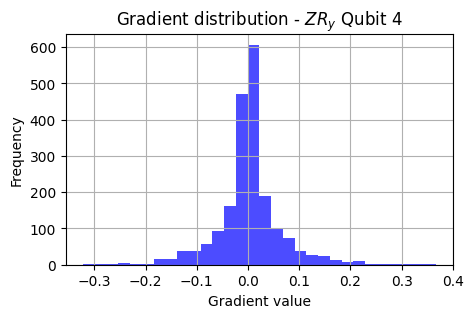


--- Qubit 5 ---
Qubit 5 | mean_grad=1.980196e-02, var_grad=1.429228e-03


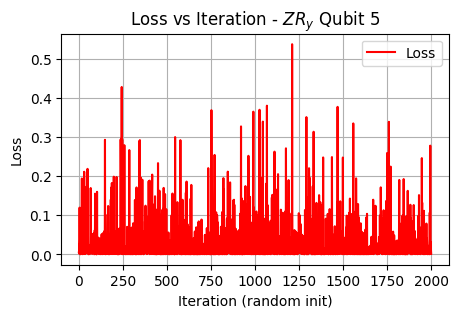

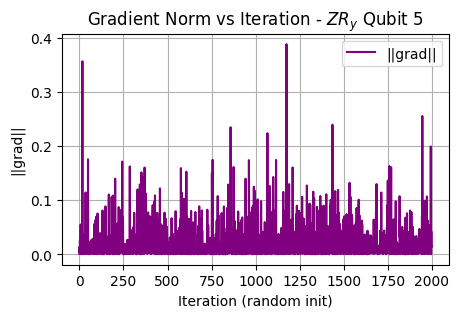

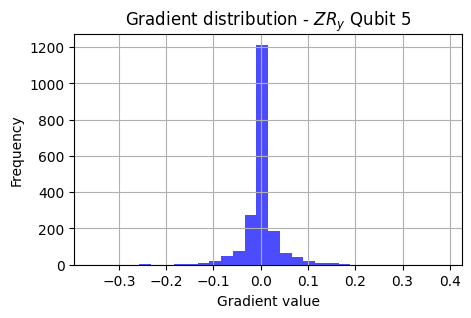


--- Qubit 6 ---
Qubit 6 | mean_grad=1.013927e-02, var_grad=4.576626e-04


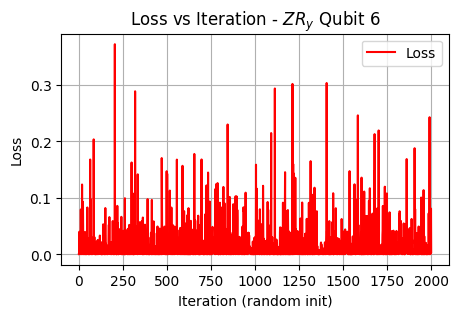

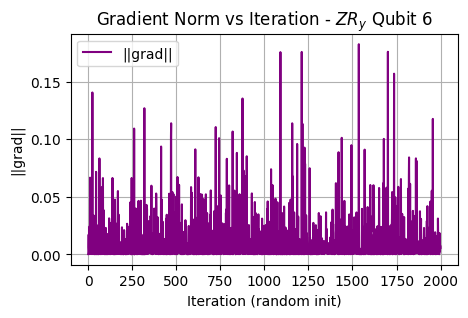

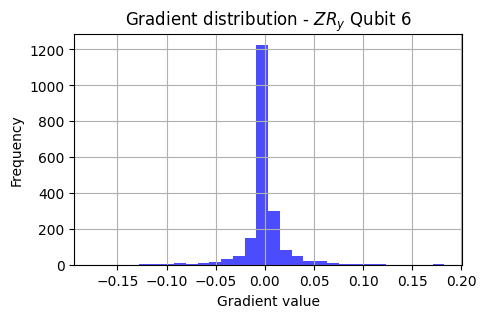


--- Qubit 7 ---
Qubit 7 | mean_grad=5.294706e-03, var_grad=1.534047e-04


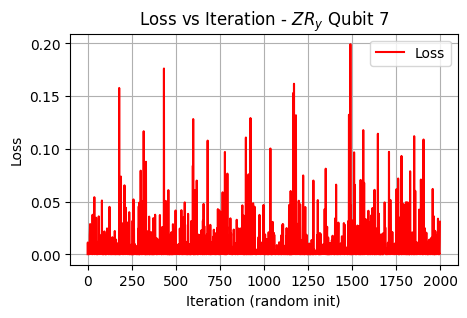

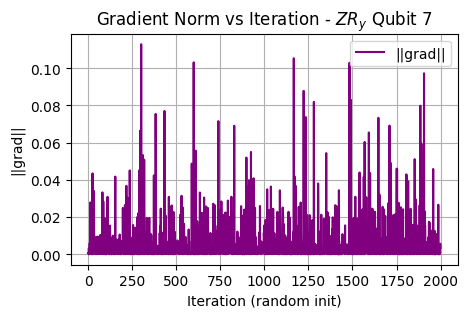

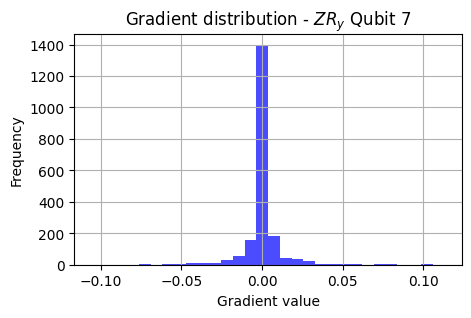


--- Qubit 8 ---
Qubit 8 | mean_grad=2.659729e-03, var_grad=4.829547e-05


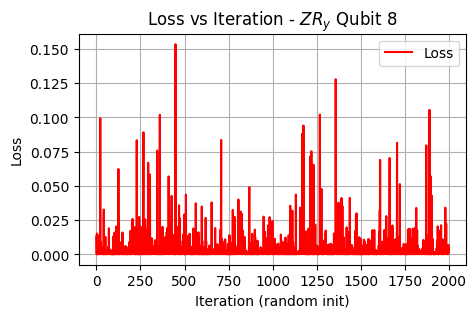

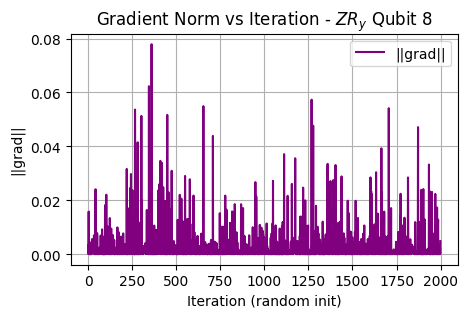

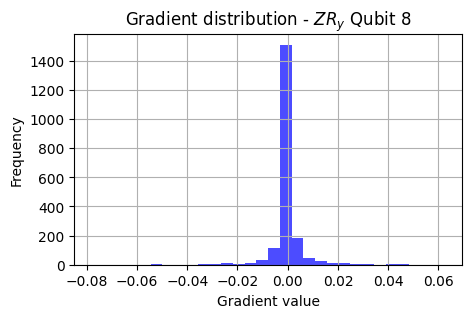


 Mean Gradient vs. Qubits

['3.177082e-01', '1.607707e-01', '7.771165e-02', '3.923710e-02', '1.980196e-02', '1.013927e-02', '5.294706e-03', '2.659729e-03']

Variance Gradient vs. Qubits

['1.252234e-01', '4.309994e-02', '1.294317e-02', '4.134640e-03', '1.429228e-03', '4.576626e-04', '1.534047e-04', '4.829547e-05']
Time taken for $Z R_y$: 129.47 seconds


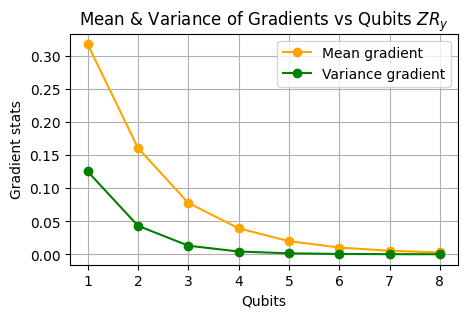

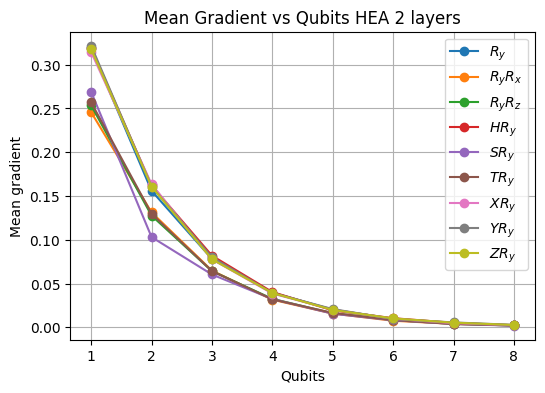

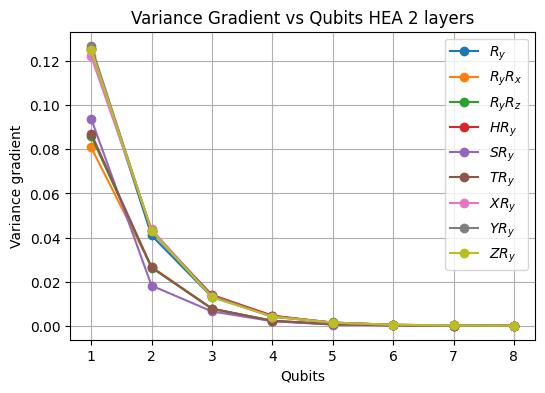

In [7]:
x_theta0 = np.linspace(0.0, 2*np.pi, samples)
N_layers = 2
qubits_list = [1, 2, 3, 4, 5, 6, 7, 8]

def loss_func(num_qubits, ansatz, param_list, param_values):
    bind_dict = {p: float(val) for p, val in zip(param_list, param_values)}
    circuit = ansatz.assign_parameters(bind_dict)
    psi = Statevector.from_label('0'*num_qubits).evolve(circuit).data
    return np.real(np.conjugate(psi[0]) * psi[0])

def compute_ansatz_gradient(num_qubits, ansatz, param_list, theta, param_indices, shift=np.pi/2):
    grads = []
    for idx in param_indices:
        tp = theta.copy()
        tm = theta.copy()
        tp[idx] += shift
        tm[idx] -= shift
        Ep = loss_func(num_qubits, ansatz, param_list, tp)
        Em = loss_func(num_qubits, ansatz, param_list, tm)
        grads.append(0.5 * (Ep - Em))
    return np.array(grads)

results_grad = {}

for gate_label, gate in gates_counts:
    time_init = time.time()
    print(f"\n=== Barren Plateau Analysis for Ansatz {gate_label} ===")
    mean_grads_layer = []
    var_grads_layer = []

    for q in qubits_list:
        print(f"\n--- Qubit {q} ---")
        algorithm_globals.random_seed = 50

        ansatz = hea_custom(q, N_layers, gate)
        param_list = list(ansatz.parameters)
        param_indices = [0]
        grad_history = {idx: [] for idx in param_indices}
        loss_history = []
        grad_norm_history = []

        for it in range(samples):
            theta = np.random.uniform(0, 2*np.pi, len(param_list)).astype(float)
            grad_vals = compute_ansatz_gradient(q, ansatz,
                                                param_list, theta, param_indices)
            loss = loss_func(q, ansatz, param_list, theta)
            loss_history.append(loss)
            grad_norm_history.append(np.linalg.norm(grad_vals))

            for idx, g in zip(param_indices, grad_vals):
                grad_history[idx].append(g)

        grads_all = np.concatenate([grad_history[idx] for idx in param_indices])
        mean_grad = np.mean(np.abs(grads_all))
        var_grad = np.var(grads_all)
        mean_grads_layer.append(mean_grad)
        var_grads_layer.append(var_grad)

        print(f"Qubit {q} | mean_grad={mean_grad:.6e}, var_grad={var_grad:.6e}")

        # === Plot per layer ===
        plt.figure(figsize=(5,3))
        plt.plot(loss_history, color="red", label="Loss")
        plt.xlabel("Iteration (random init)")
        plt.ylabel("Loss")
        plt.title(f"Loss vs Iteration - {gate_label} Qubit {q}")
        plt.grid(True)
        plt.legend()
        plt.show()

        plt.figure(figsize=(5,3))
        plt.plot(grad_norm_history, color="purple", label="||grad||")
        plt.xlabel("Iteration (random init)")
        plt.ylabel("||grad||")
        plt.title(f"Gradient Norm vs Iteration - {gate_label} Qubit {q}")
        plt.grid(True)
        plt.legend()
        plt.show()

        plt.figure(figsize=(5,3))
        plt.hist(grads_all, bins=30, color="blue", alpha=0.7)
        plt.xlabel("Gradient value")
        plt.ylabel("Frequency")
        plt.title(f"Gradient distribution - {gate_label} Qubit {q}")
        plt.grid(True)
        plt.show()

    print("\n Mean Gradient vs. Qubits\n")
    print([f"{val:.6e}" for val in mean_grads_layer])
    print("\nVariance Gradient vs. Qubits\n")
    print([f"{val:.6e}" for val in var_grads_layer])

    time_end = time.time()
    print(f"Time taken for {gate_label}: {time_end - time_init:.2f} seconds")
    
    results_grad[gate_label] = (mean_grads_layer, var_grads_layer)

    plt.figure(figsize=(5,3))
    plt.plot(qubits_list, mean_grads_layer, "o-", color="orange", label="Mean gradient")
    plt.plot(qubits_list, var_grads_layer, "o-", color="green", label="Variance gradient")
    plt.xlabel("Qubits")
    plt.ylabel("Gradient stats")
    plt.title(f"Mean & Variance of Gradients vs Qubits {gate_label}")
    plt.grid(True)
    plt.legend()
    plt.show()

    print("="*100)

plt.figure(figsize=(6,4))
for gate_label, (mean_vals, var_vals) in results_grad.items():
    plt.plot(qubits_list, mean_vals, "o-", label=f"{gate_label}")
plt.xlabel("Qubits")
plt.ylabel("Mean gradient")
plt.title("Mean Gradient vs Qubits HEA 2 layers")
plt.grid(True)
plt.legend()
plt.show()

# === Plot Variance Gradients per Gate ===
plt.figure(figsize=(6,4))
for gate_label, (mean_vals, var_vals) in results_grad.items():
    plt.plot(qubits_list, var_vals, "o-", label=f"{gate_label}")
plt.xlabel("Qubits")
plt.ylabel("Variance gradient")
plt.title("Variance Gradient vs Qubits HEA 2 layers")
plt.grid(True)
plt.legend()
plt.show()

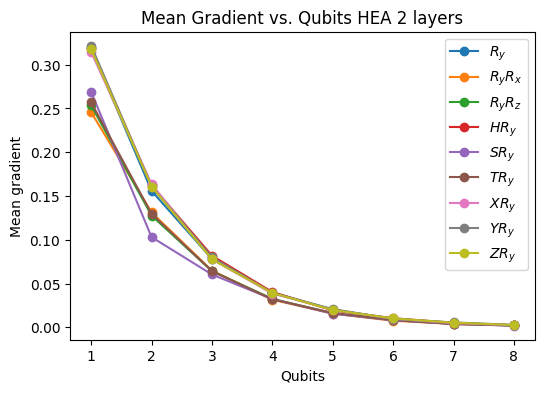

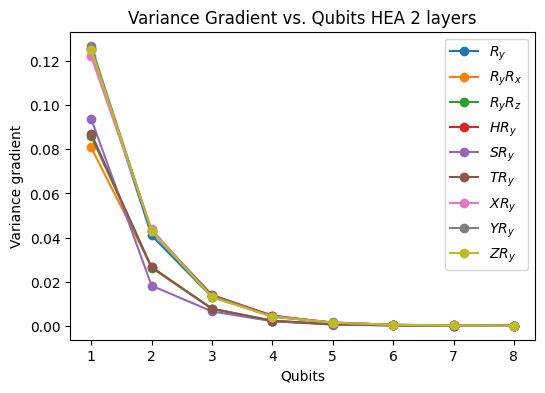

In [2]:
qubits_list = [1, 2, 3, 4, 5, 6, 7, 8]

mean_grad_q_ry = [3.188238e-01, 1.559351e-01, 7.807955e-02, 3.967503e-02, 2.015531e-02, 9.733937e-03, 4.978906e-03, 2.390514e-03]
var_grad_q_ry = [1.256095e-01, 4.093699e-02, 1.300997e-02, 4.403871e-03, 1.408802e-03, 3.571988e-04, 1.395639e-04, 3.782416e-05]
mean_grad_q_ryrx = [2.457020e-01, 1.312758e-01, 6.479388e-02, 3.154407e-02, 1.567418e-02, 7.482818e-03, 3.909399e-03, 2.092717e-03]
var_grad_q_ryrx = [8.084982e-02, 2.671402e-02, 7.764226e-03, 2.066850e-03, 6.090926e-04, 1.582311e-04, 4.786801e-05, 1.585980e-05]
mean_grad_q_ryrz = [2.536133e-01, 1.276348e-01, 6.419181e-02, 3.249928e-02, 1.601993e-02, 8.269000e-03, 3.899657e-03, 2.091742e-03]
var_grad_q_ryrz = [8.601753e-02, 2.638829e-02, 7.700335e-03, 2.312958e-03, 6.236444e-04, 1.897253e-04, 5.506107e-05, 1.612815e-05]
mean_grad_q_hry = [3.193163e-01, 1.619883e-01, 8.184213e-02, 4.028068e-02, 1.930256e-02, 1.040562e-02, 5.049082e-03, 2.290577e-03]
var_grad_q_hry = [1.256968e-01, 4.296281e-02, 1.399198e-02, 4.598786e-03, 1.327834e-03, 4.742437e-04, 1.194334e-04, 3.420636e-05]
mean_grad_q_sry = [2.689014e-01, 1.030556e-01, 6.031643e-02, 3.226981e-02, 1.550872e-02, 8.018992e-03, 3.863688e-03, 1.795739e-03]
var_grad_q_sry = [9.386937e-02, 1.819391e-02, 6.497827e-03, 2.059979e-03, 5.448060e-04, 1.602329e-04, 4.098617e-05, 9.867788e-06]
mean_grad_q_try = [2.568534e-01, 1.296671e-01, 6.410904e-02, 3.200428e-02, 1.639663e-02, 8.250605e-03, 3.839491e-03, 2.152224e-03]
var_grad_q_try = [8.716728e-02, 2.645508e-02, 7.727249e-03, 2.243732e-03, 7.108609e-04, 2.130087e-04, 5.186318e-05, 1.947872e-05]
mean_grad_q_xry = [3.143717e-01, 1.634831e-01, 7.768802e-02, 3.859386e-02, 2.023026e-02, 9.693256e-03, 4.714031e-03, 2.528475e-03]
var_grad_q_xry = [1.221753e-01, 4.376487e-02, 1.331333e-02, 4.025520e-03, 1.394654e-03, 4.232615e-04, 1.242126e-04, 4.839807e-05]
mean_grad_q_yry = [3.216523e-01, 1.606809e-01, 8.008391e-02, 3.919282e-02, 2.077660e-02, 9.491063e-03, 5.557829e-03, 2.757318e-03]
var_grad_q_yry = [1.269839e-01, 4.277494e-02, 1.362714e-02, 4.146647e-03, 1.490675e-03, 3.696184e-04, 1.725754e-04, 5.420294e-05]
mean_grad_q_zry = [3.177082e-01, 1.607707e-01, 7.771165e-02, 3.923710e-02, 1.980196e-02, 1.013927e-02, 5.294706e-03, 2.659729e-03]
var_grad_q_zry = [1.252234e-01, 4.309994e-02, 1.294317e-02, 4.134640e-03, 1.429228e-03, 4.576626e-04, 1.534047e-04, 4.829547e-05]


plt.figure(figsize=(6,4))
plt.plot(qubits_list, mean_grad_q_ry, "o-", label="$R_y$")
plt.plot(qubits_list, mean_grad_q_ryrx, "o-", label="$R_y R_x$")
plt.plot(qubits_list, mean_grad_q_ryrz, "o-", label="$R_y R_z$")
plt.plot(qubits_list, mean_grad_q_hry, "o-", label="$H R_y$")
plt.plot(qubits_list, mean_grad_q_sry, "o-", label="$S R_y$")
plt.plot(qubits_list, mean_grad_q_try, "o-", label="$T R_y$")
plt.plot(qubits_list, mean_grad_q_xry, "o-", label="$X R_y$")
plt.plot(qubits_list, mean_grad_q_yry, "o-", label="$Y R_y$")
plt.plot(qubits_list, mean_grad_q_zry, "o-", label="$Z R_y$")
plt.xlabel("Qubits")
plt.ylabel("Mean gradient")
plt.title("Mean Gradient vs. Qubits HEA 2 layers")
plt.legend()
plt.show()

plt.figure(figsize=(6,4))
plt.plot(qubits_list, var_grad_q_ry, "o-", label="$R_y$")
plt.plot(qubits_list, var_grad_q_ryrx, "o-", label="$R_y R_x$")
plt.plot(qubits_list, var_grad_q_ryrz, "o-", label="$R_y R_z$")
plt.plot(qubits_list, var_grad_q_hry, "o-", label="$H R_y$")
plt.plot(qubits_list, var_grad_q_sry, "o-", label="$S R_y$")
plt.plot(qubits_list, var_grad_q_try, "o-", label="$T R_y$")
plt.plot(qubits_list, var_grad_q_xry, "o-", label="$X R_y$")
plt.plot(qubits_list, var_grad_q_yry, "o-", label="$Y R_y$")
plt.plot(qubits_list, var_grad_q_zry, "o-", label="$Z R_y$")
plt.xlabel("Qubits")
plt.ylabel("Variance gradient")
plt.title("Variance Gradient vs. Qubits HEA 2 layers")
plt.legend()
plt.show()

In the results of the variance and mean gradient of the 2-layer HEA variation against the number of qubits by reviewing the Hamiltonian H2 (Ansatz: 4 qubits and 2 layers), it can be seen that the HEA HRy gradient variance value is the highest.

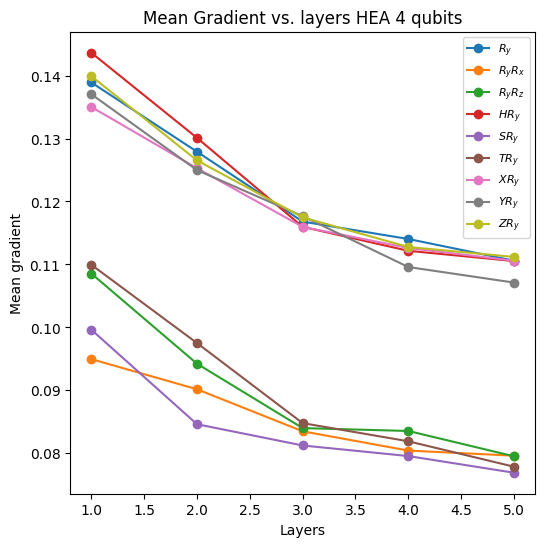

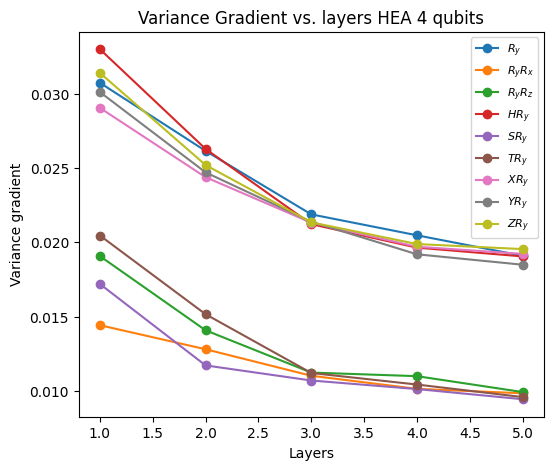

In [18]:
layers_list = [1, 2, 3, 4, 5]

mean_grad_q_ry = [0.13891143949486862, 0.127908347100568, 0.11680190389003597, 0.11404206525672142, 0.11059381347980861]
var_grad_q_ry = [0.030722279596717774, 0.026139201592181697, 0.02187205835051266, 0.02046407094559492, 0.01908429439231094]
mean_grad_q_ryrx = [0.09496128029834293, 0.09017473548640693, 0.08349576843770944, 0.08043141205452126, 0.07962145574116272]
var_grad_q_ryrx = [0.014414389989499508, 0.012797719080772502, 0.011014248078041277, 0.0101337223773712, 0.009834909019360497]
mean_grad_q_ryrz = [0.1085578860787696, 0.0942328297158439, 0.0840036748387311, 0.08354552549879776, 0.07952406416397957]
var_grad_q_ryrz = [0.019063222030048173, 0.014072109748610957, 0.011228601447405229, 0.010987200338150966, 0.009917394572395516]
mean_grad_q_hry = [0.1436304875118082, 0.1301083943178291, 0.11597120879167597, 0.11216600999239656, 0.11053543951264203]
var_grad_q_hry = [0.03298183212207181, 0.026272749628134306, 0.021213759744794752, 0.019634711353473798, 0.019043548844108214]
mean_grad_q_sry = [0.09964098137707537, 0.08462028869928917, 0.08124316927403281, 0.07956163503986792, 0.0769147382257961]
var_grad_q_sry = [0.017186338099711408, 0.011710114116591834, 0.010694932887795007, 0.010119674250155681, 0.009435820110775726]
mean_grad_q_try = [0.10995171552931503, 0.09751503802791464, 0.08479058126044307, 0.08190814250253484, 0.07786839176745065]
var_grad_q_try = [0.02044822672169028, 0.015152857992410203, 0.011200334073848687, 0.010423905927958674, 0.009580563057506037]
mean_grad_q_xry = [0.1350206168866825, 0.12527804363708103, 0.11597038725071487, 0.11261453292573544, 0.11058812468743678]
var_grad_q_xry = [0.029034400757492435, 0.024371412623570107, 0.021312157398796487, 0.019694320995275547, 0.01921319122996383]
mean_grad_q_yry = [0.13704539913743172, 0.12498622213619226, 0.11766113050643068, 0.10958822692595213, 0.10711787271218311]
var_grad_q_yry = [0.03010015821105691, 0.024695682442372253, 0.021375006936577356, 0.019186172518464717, 0.018483878192786313]
mean_grad_q_zry = [0.1399138211407128, 0.1265266977559696, 0.11747679927423889, 0.11277071925421993, 0.11119150272921408]
var_grad_q_zry = [0.03138824844276928, 0.025189900013591823, 0.02133337929120391, 0.019875552375256036, 0.019535991321809408]


plt.figure(figsize=(6,6))
plt.plot(layers_list, mean_grad_q_ry, "o-", label="$R_y$")
plt.plot(layers_list, mean_grad_q_ryrx, "o-", label="$R_y R_x$")
plt.plot(layers_list, mean_grad_q_ryrz, "o-", label="$R_y R_z$")
plt.plot(layers_list, mean_grad_q_hry, "o-", label="$H R_y$")
plt.plot(layers_list, mean_grad_q_sry, "o-", label="$S R_y$")
plt.plot(layers_list, mean_grad_q_try, "o-", label="$T R_y$")
plt.plot(layers_list, mean_grad_q_xry, "o-", label="$X R_y$")
plt.plot(layers_list, mean_grad_q_yry, "o-", label="$Y R_y$")
plt.plot(layers_list, mean_grad_q_zry, "o-", label="$Z R_y$")
plt.xlabel("Layers")
plt.ylabel("Mean gradient")
plt.title("Mean Gradient vs. layers HEA 4 qubits")
plt.legend(fontsize=8)
plt.savefig("mean_grad_layers_hea_4_qubits.png", dpi=1980)
plt.show()

plt.figure(figsize=(6,5))
plt.plot(layers_list, var_grad_q_ry, "o-", label="$R_y$")
plt.plot(layers_list, var_grad_q_ryrx, "o-", label="$R_y R_x$")
plt.plot(layers_list, var_grad_q_ryrz, "o-", label="$R_y R_z$")
plt.plot(layers_list, var_grad_q_hry, "o-", label="$H R_y$")
plt.plot(layers_list, var_grad_q_sry, "o-", label="$S R_y$")
plt.plot(layers_list, var_grad_q_try, "o-", label="$T R_y$")
plt.plot(layers_list, var_grad_q_xry, "o-", label="$X R_y$")
plt.plot(layers_list, var_grad_q_yry, "o-", label="$Y R_y$")
plt.plot(layers_list, var_grad_q_zry, "o-", label="$Z R_y$")
plt.xlabel("Layers")
plt.ylabel("Variance gradient")
plt.title("Variance Gradient vs. layers HEA 4 qubits")
plt.legend(fontsize=8)
plt.savefig("var_grad_layers_hea_4_qubits.png", dpi=1980)
plt.show()

In the results of the variance and mean gradient of the 4-qubits HEA variation against the number of layers by reviewing the Hamiltonian H2 (Ansatz: 4 qubits and 2 layers), it can be seen that the HEA HRy gradient variance value is the highest.